In [1]:
import os
import pandas as pd

# ingore future warning
import warnings
warnings.filterwarnings("ignore", message=r"Passing", category=FutureWarning)
# surprass chain warning
pd.set_option('mode.chained_assignment', None)
#warnings.filterwarnings("ignore", message=r"Passing", category=SettingWithCopyWarning)

print("Set the printing size of the pandas df... ")
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

Set the printing size of the pandas df... 


# Load in data

In [ ]:

# get the path
path = os.getcwd()
files = os.listdir(path + '/data/excel/')

# filter excel
files_xlsx = [f for f in files if f[-4:] == 'xlsx']
print("files_xlsx: ", files_xlsx)

# get all excel files 
# init ls_files 
ls_files = [] 
print("store in list: ls_files")
# looping
for f in files_xlsx:
    # read excel 
    file_name = pd.read_excel('data/excel/'+f, 'Raw data 3D co.')
    # append
    ls_files.append(file_name)

files_xlsx:  ['1-18-21-leona-clip1.xlsx', '1-18-21-leona-clip2_copy.xlsx', '1-19-21-honey-clip1.xlsx', '1-19-21-leona_clip1.xlsx', '1-19-21-leona_clip2_copy.xlsx', '1-20-21-beyonce-clip1.xlsx', '1-20-21-honey-clip1.xlsx', '1-20-21-leona_clip1.xlsx', '1-20-21-leona_clip2.xlsx', '1-20-21-penelope_clip1.xlsx', '1-20-21-penelope_clip2_copy.xlsx', '1-21-21-beyonce_clip1_copy.xlsx', '1-21-21-honey-clip2_copy.xlsx', '1-21-21-penelope_clip1_copy.xlsx', '1-21-21-penelope_clip2_copy.xlsx', '1-22-21-beyonce-clip2.xlsx', '1-22-21-beyonce_clip1_copy2.xlsx', '1-22-21-honey-clip1.xlsx', '1-22-21-honey-clip2_copy.xlsx', '1-22-21-penelope_clip1_copy.xlsx', '1-25-21-moonique_clip1.xlsx', '1-25-21-moonique_clip2.xlsx', '1-26-21-alice_clip1_copy.xlsx', '1-26-21-moonique_clip1_copy.xlsx', '1-26-21-moonique_clip2.xlsx', '1-28-21-alice_clip1.xlsx', '1-28-21-alice_clip2_copy.xlsx', '1-28-21-moonique_clip2.xlsx', '2-1-21-tweet_clip1.xlsx', '2-10-21-moolan_clip1.xlsx', '2-10-21-moolan_clip2.xlsx', '2-11-21-loza

In [24]:
""" 
func:
    process each file 
args: 
    ls_files: list[pd]
    align: bool (do we align dataset before dropna)
return: 
    ls_pds: list[pd]
"""
def process_each_file(ls_files, align=False):
    
    # init ls_pds 
    ls_pds = [] 
    
    # looping 
    for file in range(len(ls_files)):
        # one file, keep the last 16 columns (back markers)
        one_file = ls_files[file].iloc[:, -16:]
        # if align
        if align: 
            # drop nan and move up the numbers 
            one_file = one_file.apply(lambda x: pd.Series(x.dropna().values))

        # drop nan 
        one_file_all_clean = one_file.dropna()

        # append 
        ls_pds.append(one_file_all_clean)
    
    print("length of ls_pds: ", len(ls_pds))
    return ls_pds

In [25]:
"""using func: process_each_file"""
ls_pds = process_each_file(ls_files)

length of ls_pds:  69


# Load in labels

Obtain the binary label:  [1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]


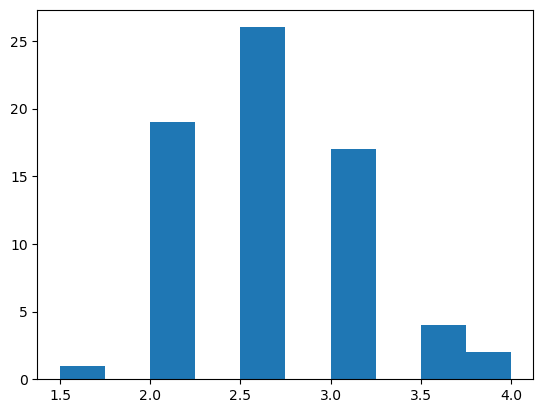

In [5]:
# load from excel 
labels_12 = pd.read_excel('data/NRS_LABEL.xlsx')

# get index for each example
idx = [i for i in range(len(files_xlsx))]
ls_idx = [12*i for i in idx]
#print("ls_idx: ", ls_idx)

# get every 12 labels (because each repeats 12 times)
labels = labels_12.iloc[ls_idx, :]

# sort by the first columns
labels_sort = labels.sort_values(labels.columns[0])
# add col 
labels_sort['name'] = files_xlsx
# print(labels_sort)

# label list 
labels_ls = labels_sort['nrs-score'].tolist()
import matplotlib.pyplot as plt
# plot histogram
plt.hist(labels_ls, density=False)

# get a binary list
binary_ls = [1 if i >= 3 else 0 for i in labels_ls]
print("Obtain the binary label: ", binary_ls)

# Visualization

### Four curves

In [55]:
import matplotlib.pyplot as plt

""" 
func: 
    to plot the xyz 
args: 
    file: pd
"""
def plot_z(file, on_x=False):
    
    if on_x==False:
        plt.plot(file['Z-B1'], label='Z-B1')
        plt.plot(file['Z-B2'], label='Z-B2')
        plt.plot(file['Z-B3'], label='Z-B3')
        plt.plot(file['Z-B4'], label='Z-B4')
        plt.legend()
        plt.show()
    
    else: 
        plt.plot(file['X-B1'], file['Z-B1'], label='Z-B1')
        plt.plot(file['X-B2'], file['Z-B2'], label='Z-B2')
        plt.plot(file['X-B3'], file['Z-B3'], label='Z-B3')
        plt.plot(file['X-B4'], file['Z-B4'], label='Z-B4')
        plt.legend()
        plt.show()

----------  1  ------------
----------  1-18-21-leona-clip1.xlsx  ------------


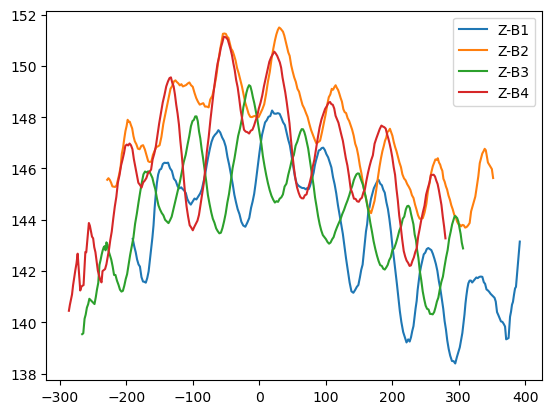

----------  0  ------------
----------  1-18-21-leona-clip2_copy.xlsx  ------------


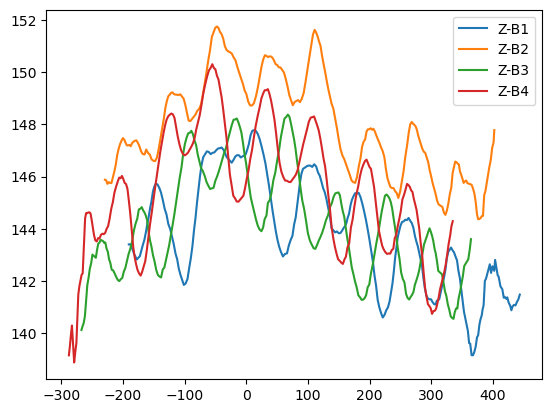

----------  1  ------------
----------  1-19-21-honey-clip1.xlsx  ------------


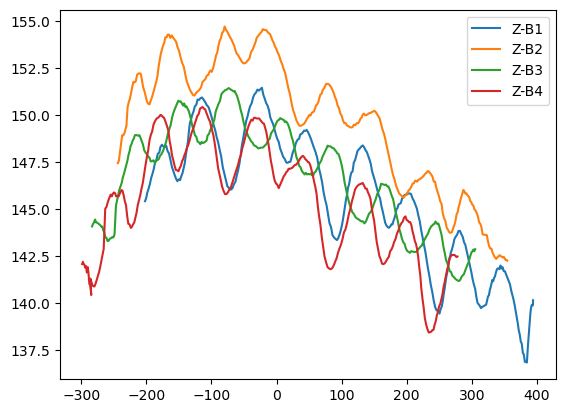

----------  0  ------------
----------  1-19-21-leona_clip1.xlsx  ------------


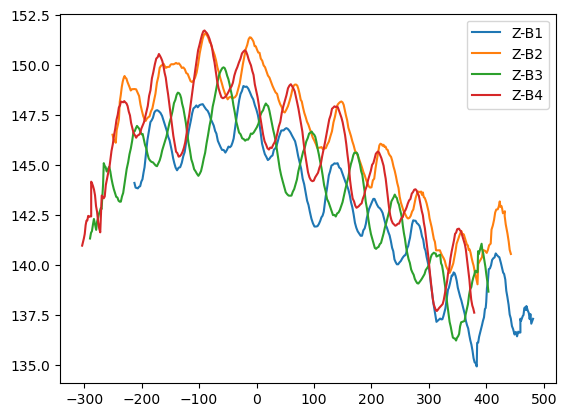

----------  0  ------------
----------  1-19-21-leona_clip2_copy.xlsx  ------------


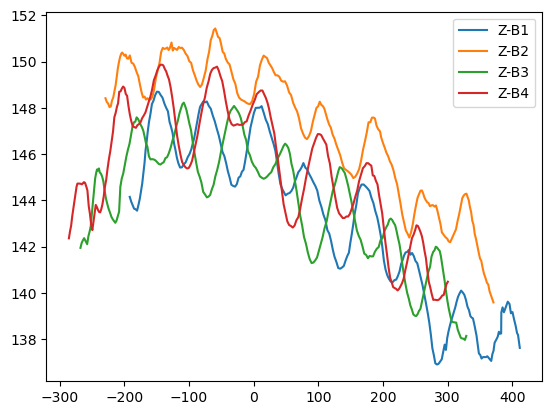

----------  0  ------------
----------  1-20-21-beyonce-clip1.xlsx  ------------


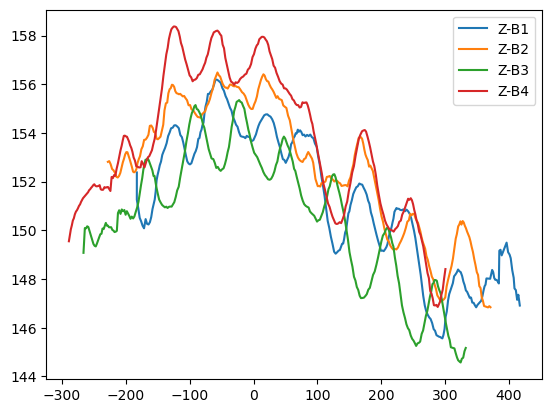

----------  0  ------------
----------  1-20-21-honey-clip1.xlsx  ------------


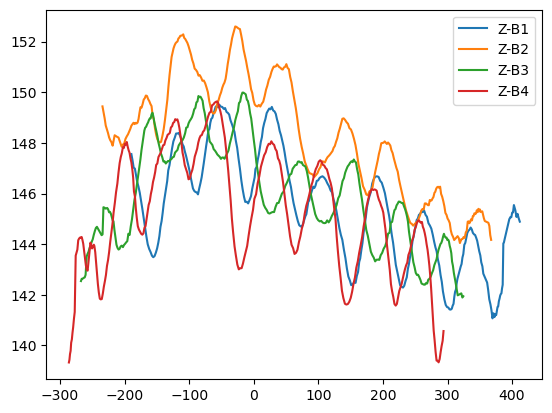

----------  0  ------------
----------  1-20-21-leona_clip1.xlsx  ------------


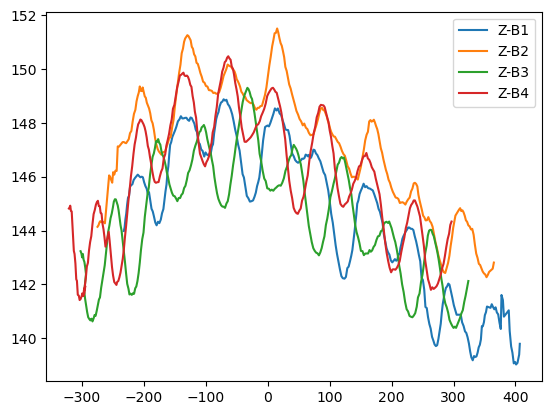

----------  1  ------------
----------  1-20-21-leona_clip2.xlsx  ------------


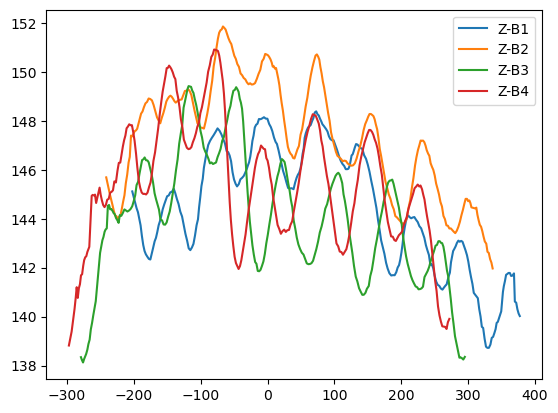

----------  0  ------------
----------  1-20-21-penelope_clip1.xlsx  ------------


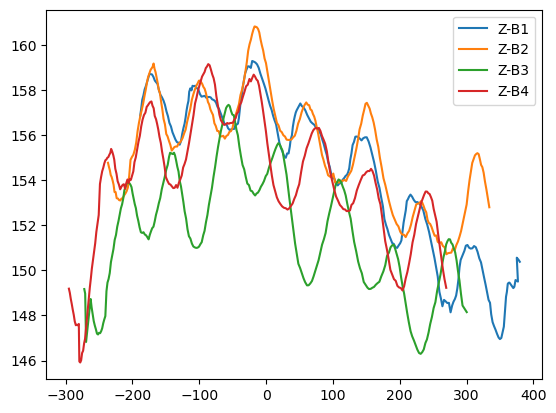

----------  0  ------------
----------  1-20-21-penelope_clip2_copy.xlsx  ------------


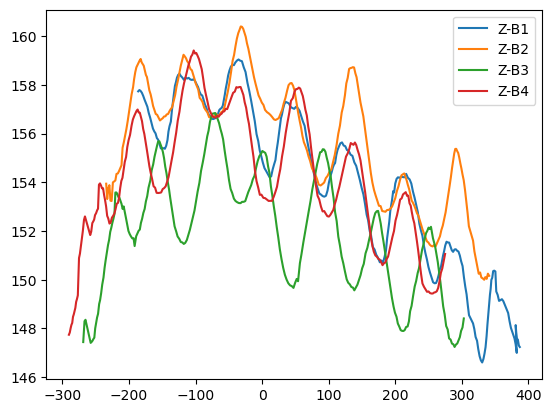

----------  0  ------------
----------  1-21-21-beyonce_clip1_copy.xlsx  ------------


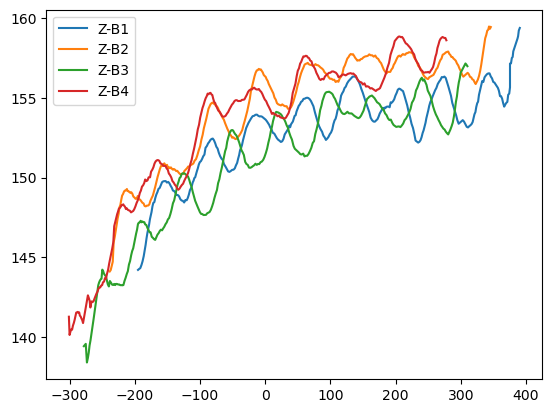

----------  1  ------------
----------  1-21-21-honey-clip2_copy.xlsx  ------------


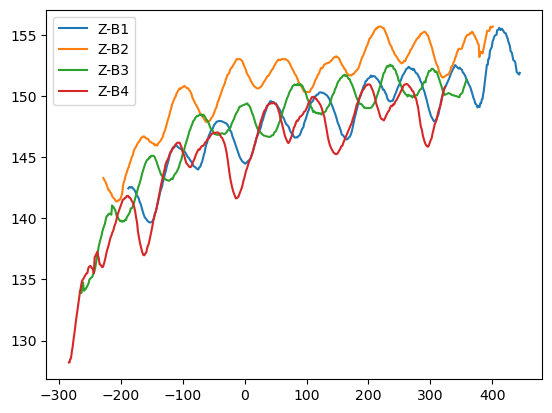

----------  0  ------------
----------  1-21-21-penelope_clip1_copy.xlsx  ------------


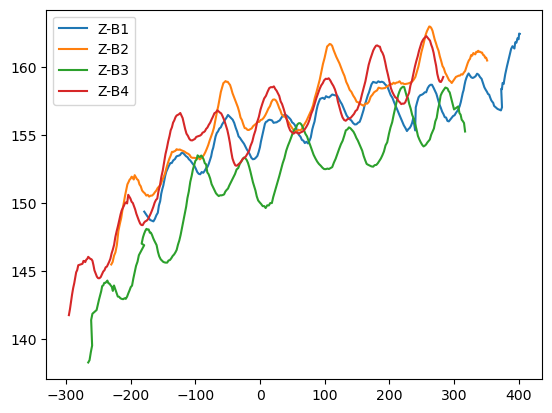

----------  0  ------------
----------  1-21-21-penelope_clip2_copy.xlsx  ------------


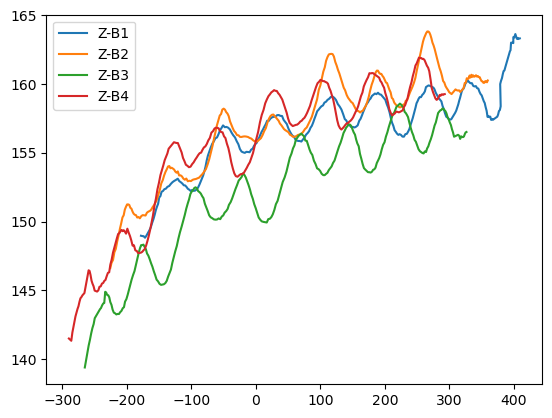

----------  0  ------------
----------  1-22-21-beyonce-clip2.xlsx  ------------


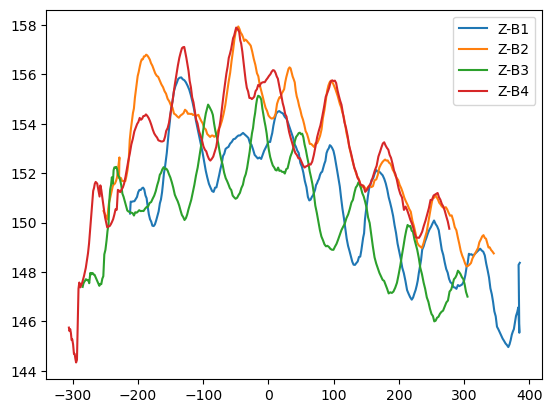

----------  1  ------------
----------  1-22-21-beyonce_clip1_copy2.xlsx  ------------


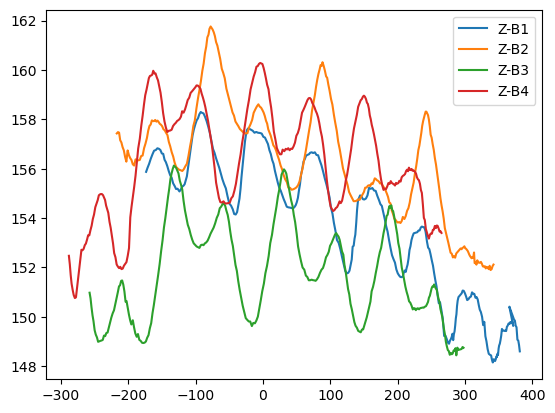

----------  1  ------------
----------  1-22-21-honey-clip1.xlsx  ------------


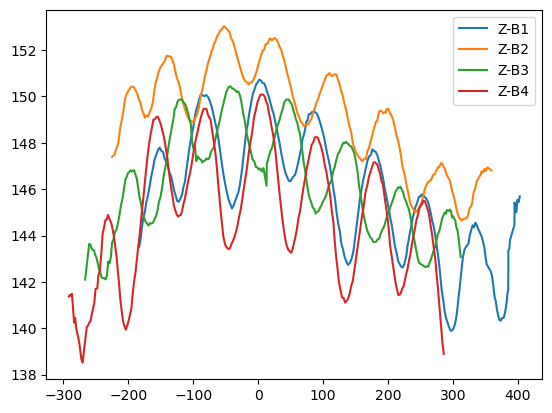

----------  1  ------------
----------  1-22-21-honey-clip2_copy.xlsx  ------------


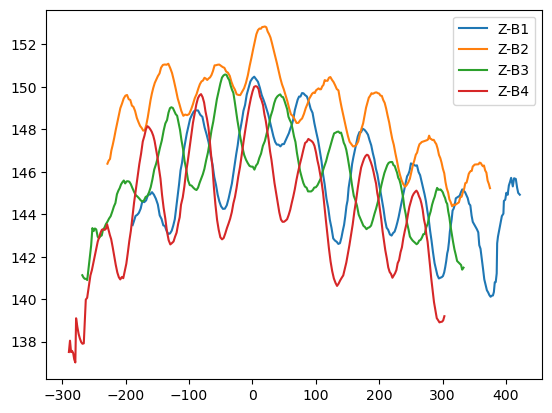

----------  1  ------------
----------  1-22-21-penelope_clip1_copy.xlsx  ------------


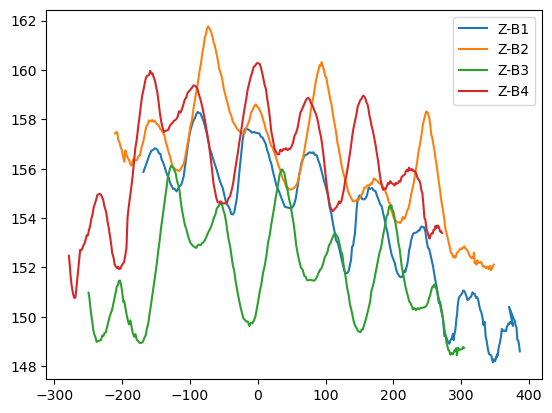

----------  0  ------------
----------  1-25-21-moonique_clip1.xlsx  ------------


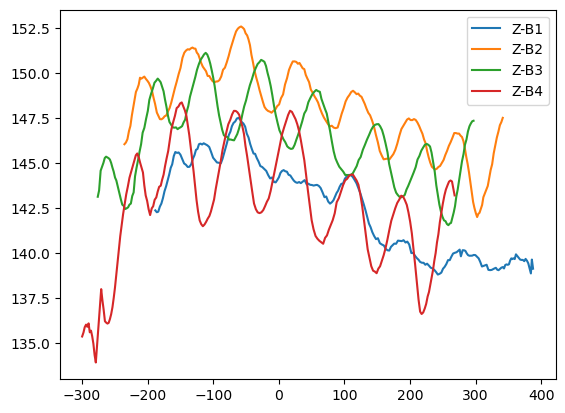

----------  0  ------------
----------  1-25-21-moonique_clip2.xlsx  ------------


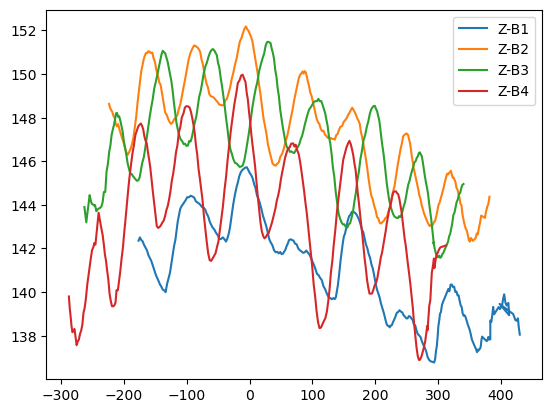

----------  0  ------------
----------  1-26-21-alice_clip1_copy.xlsx  ------------


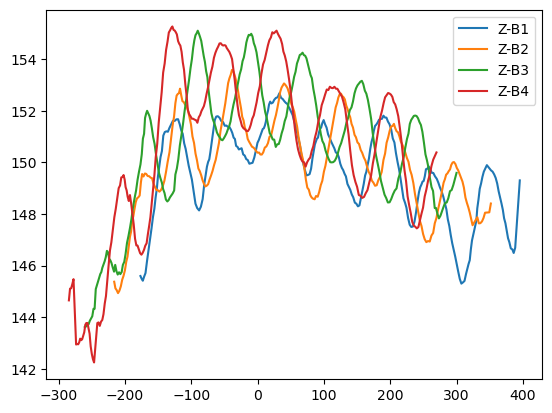

----------  0  ------------
----------  1-26-21-moonique_clip1_copy.xlsx  ------------


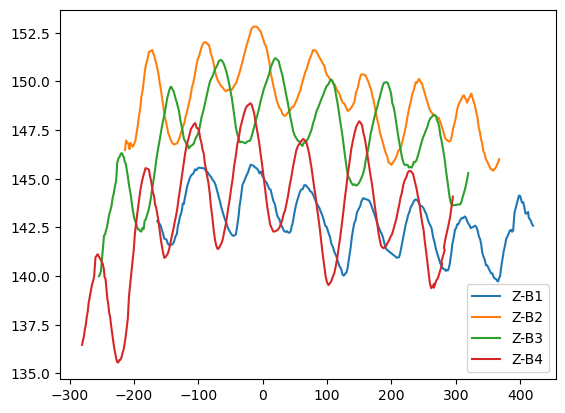

----------  0  ------------
----------  1-26-21-moonique_clip2.xlsx  ------------


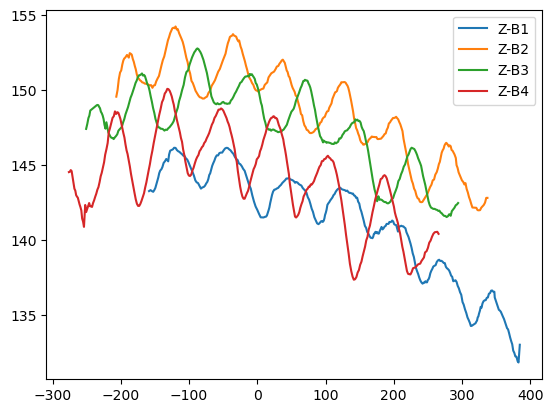

----------  0  ------------
----------  1-28-21-alice_clip1.xlsx  ------------


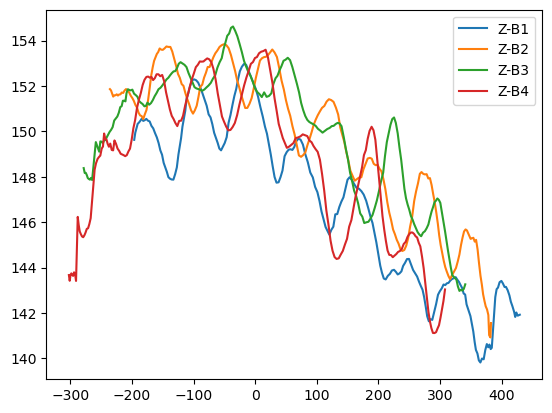

----------  1  ------------
----------  1-28-21-alice_clip2_copy.xlsx  ------------


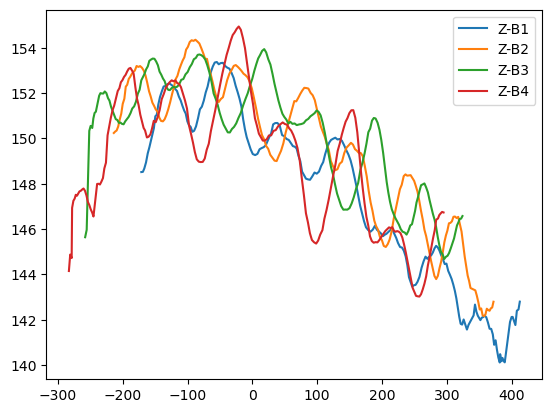

----------  0  ------------
----------  1-28-21-moonique_clip2.xlsx  ------------


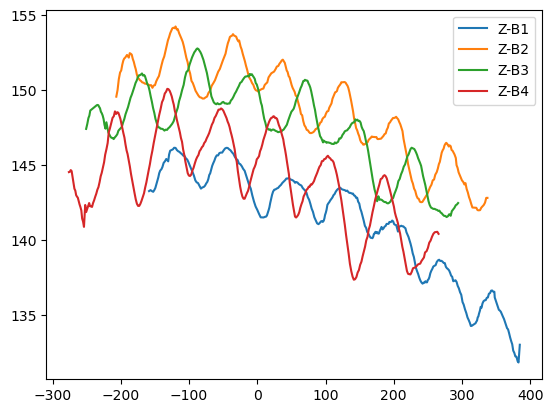

----------  1  ------------
----------  2-1-21-tweet_clip1.xlsx  ------------


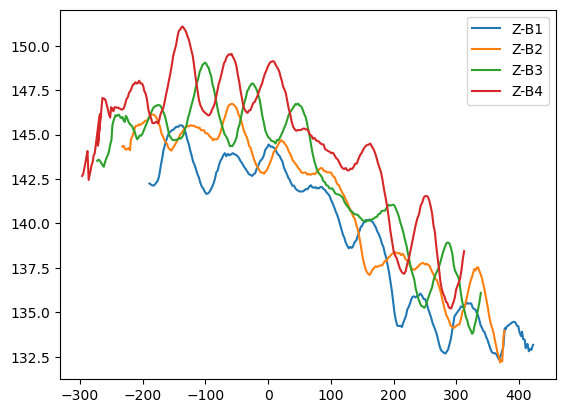

----------  0  ------------
----------  2-10-21-moolan_clip1.xlsx  ------------


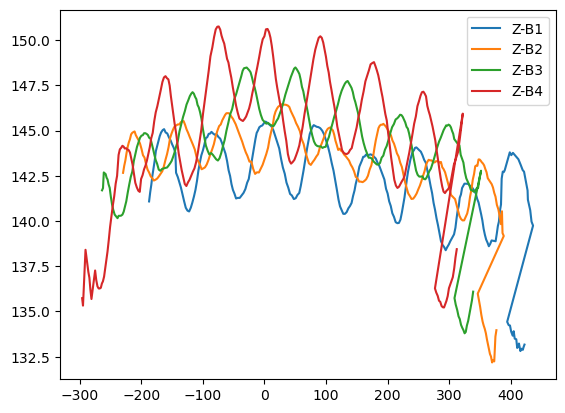

----------  0  ------------
----------  2-10-21-moolan_clip2.xlsx  ------------


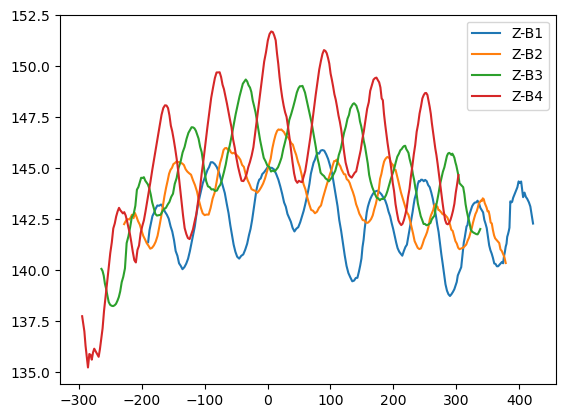

----------  0  ------------
----------  2-11-21-loza_clip1.xlsx  ------------


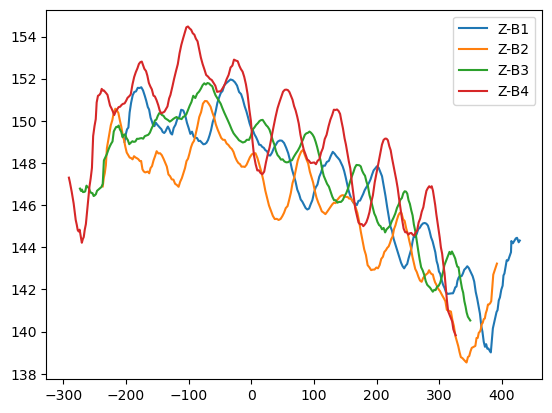

----------  0  ------------
----------  2-11-21-moon_clip1.xlsx  ------------


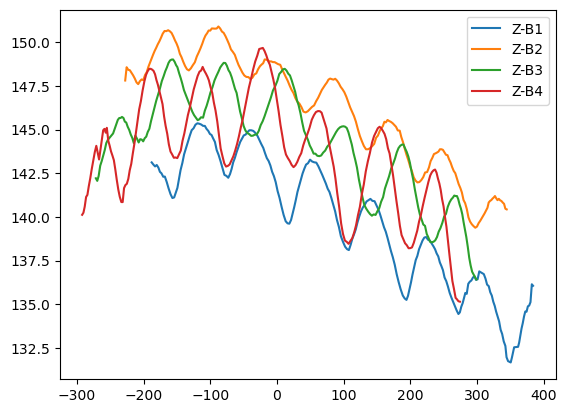

----------  1  ------------
----------  2-11-21-robin_clip1.xlsx  ------------


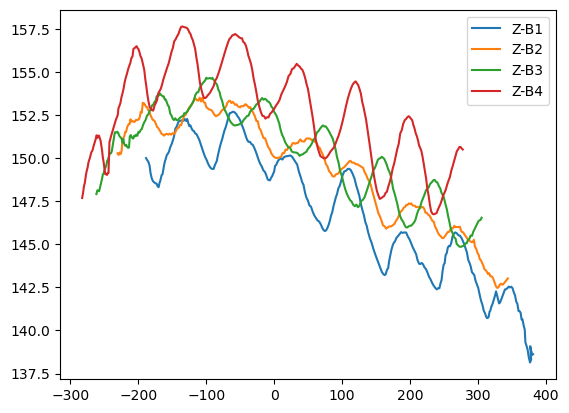

----------  1  ------------
----------  2-11-21-tweet_clip1.xlsx  ------------


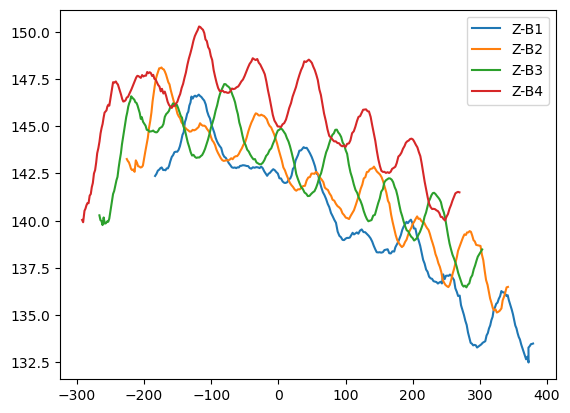

----------  0  ------------
----------  2-12-21-leona_clip1.xlsx  ------------


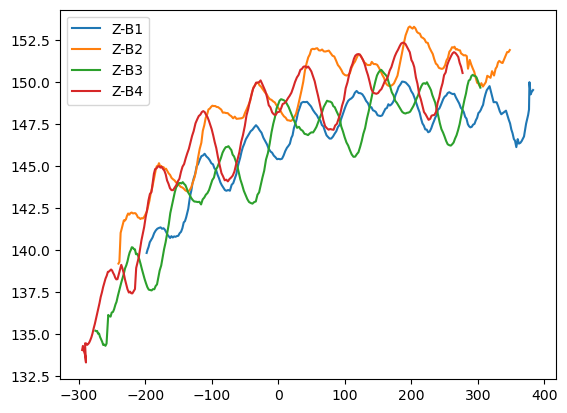

----------  0  ------------
----------  2-12-21-leona_clip2.xlsx  ------------


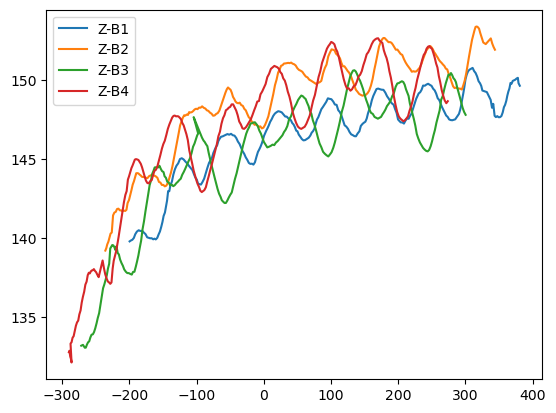

----------  0  ------------
----------  2-12-21-leona_clip3.xlsx  ------------


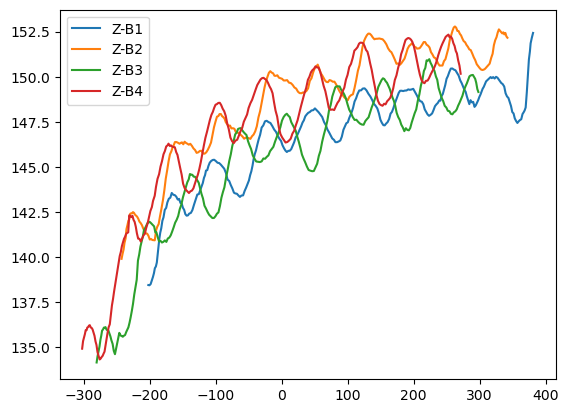

----------  0  ------------
----------  2-12-21-moon_clip1.xlsx  ------------


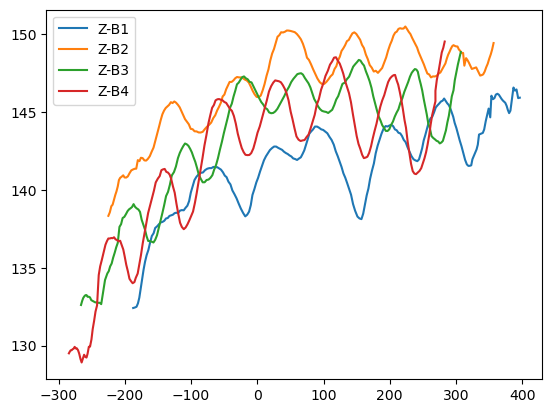

----------  1  ------------
----------  2-12-21-robin_clip1.xlsx  ------------


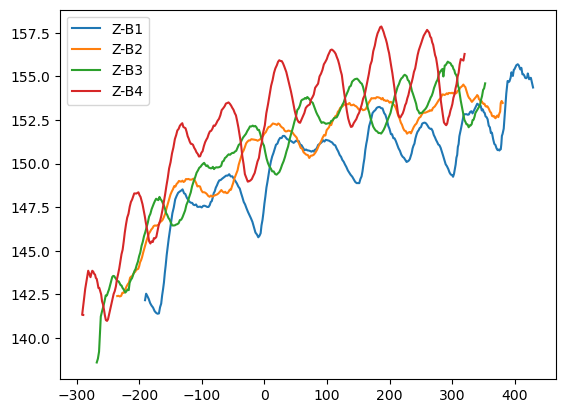

----------  1  ------------
----------  2-12-21-robin_clip2.xlsx  ------------


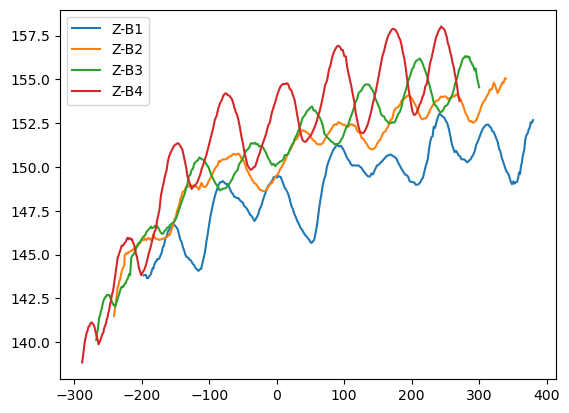

----------  1  ------------
----------  2-12-21-robin_clip3.xlsx  ------------


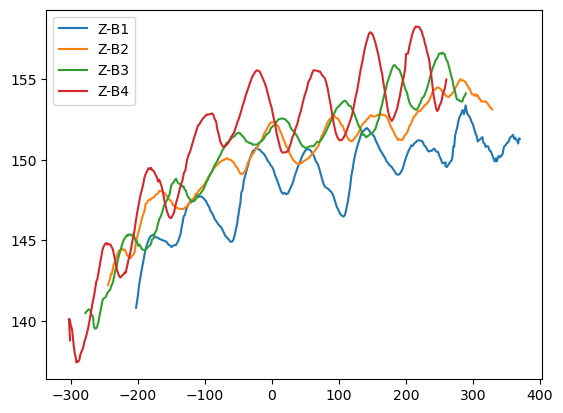

----------  1  ------------
----------  2-12-21-tweet_clip1.xlsx  ------------


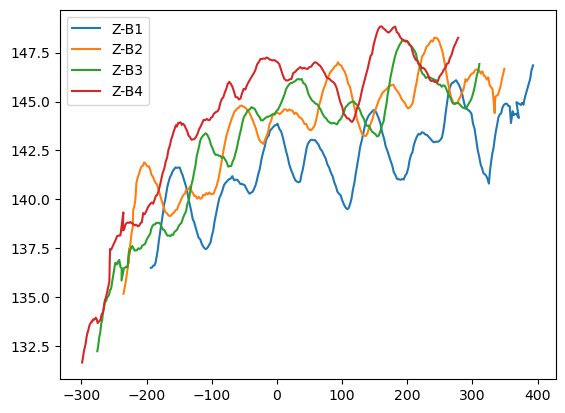

----------  0  ------------
----------  2-2-21-loza_clip1.xlsx  ------------


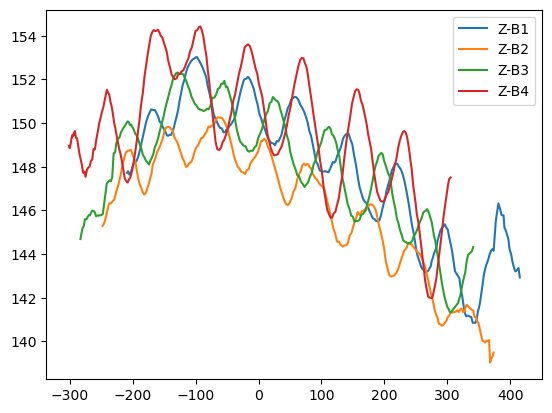

----------  0  ------------
----------  2-2-21-loza_clip2.xlsx  ------------


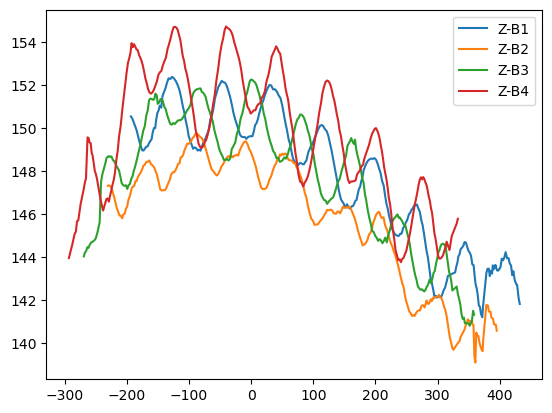

----------  0  ------------
----------  2-2-21-loza_clip3.xlsx  ------------


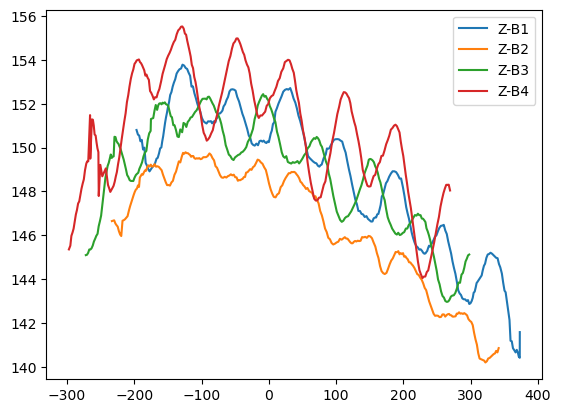

----------  1  ------------
----------  2-2-21-tweet_clip1.xlsx  ------------


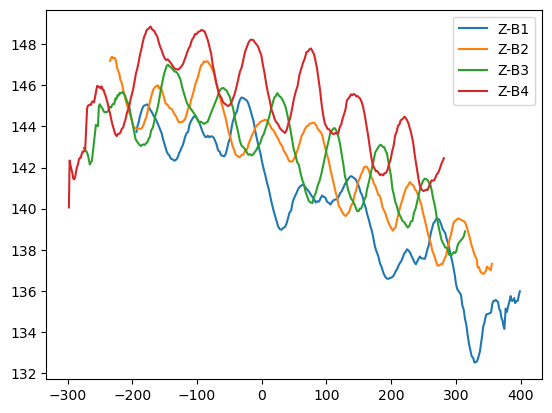

----------  1  ------------
----------  2-2-21-tweet_clip2.xlsx  ------------


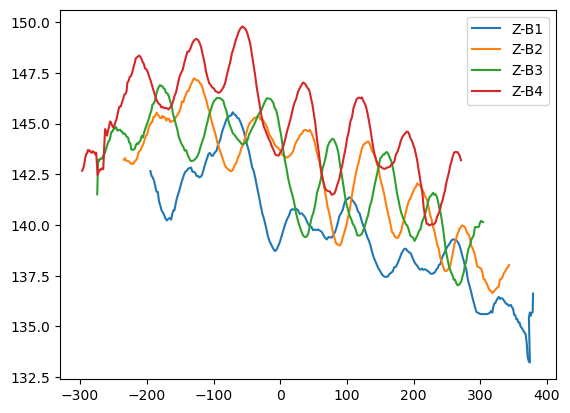

----------  0  ------------
----------  2-3-21-loza_clip1.xlsx  ------------


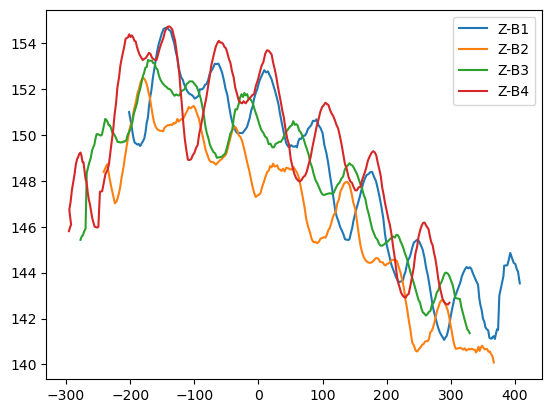

----------  0  ------------
----------  2-3-21-loza_clip3.xlsx  ------------


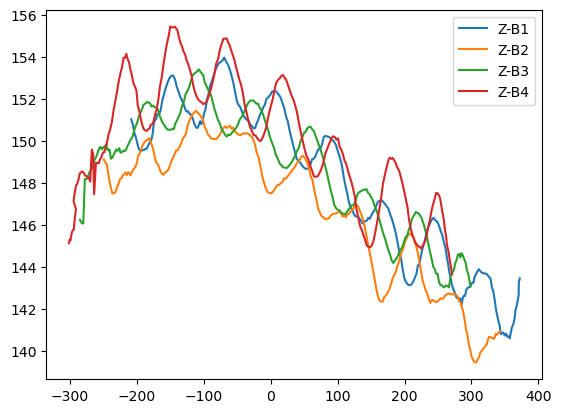

----------  0  ------------
----------  2-3-21-moon_clip1.xlsx  ------------


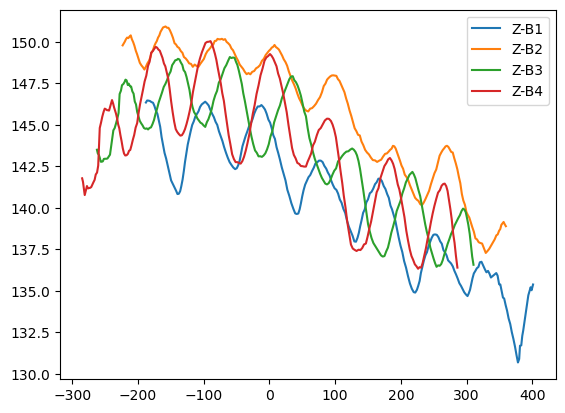

----------  0  ------------
----------  2-3-21-moon_clip2.xlsx  ------------


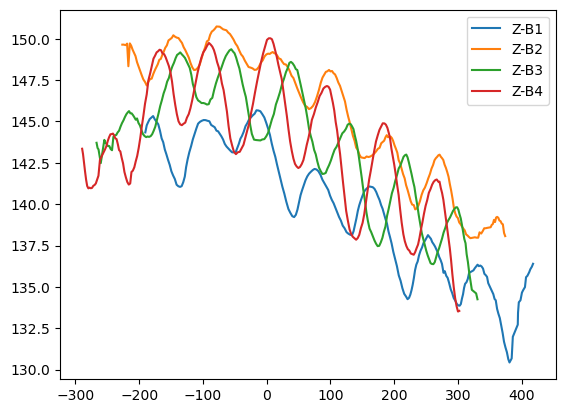

----------  1  ------------
----------  2-4-21-loza_clip1.xlsx  ------------


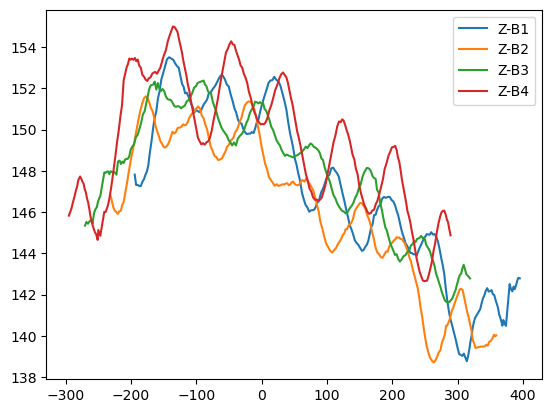

----------  1  ------------
----------  2-4-21-loza_clip2.xlsx  ------------


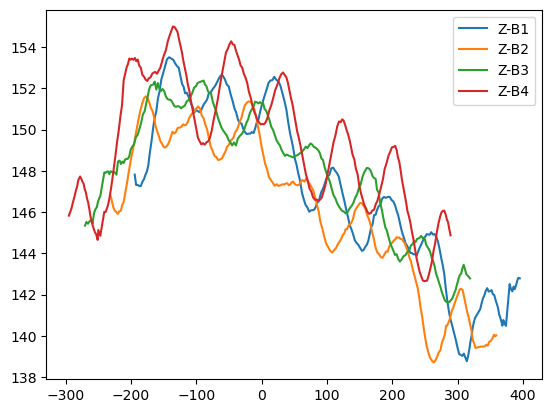

----------  0  ------------
----------  2-5-21-moon_clip1.xlsx  ------------


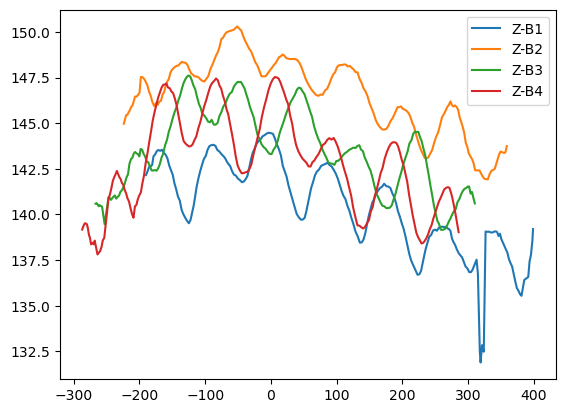

----------  0  ------------
----------  2-5-21-moon_clip2.xlsx  ------------


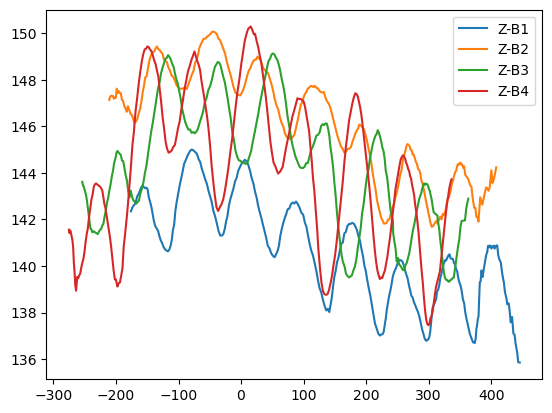

----------  0  ------------
----------  2-5-21-PtitNugget_clip1.xlsx  ------------


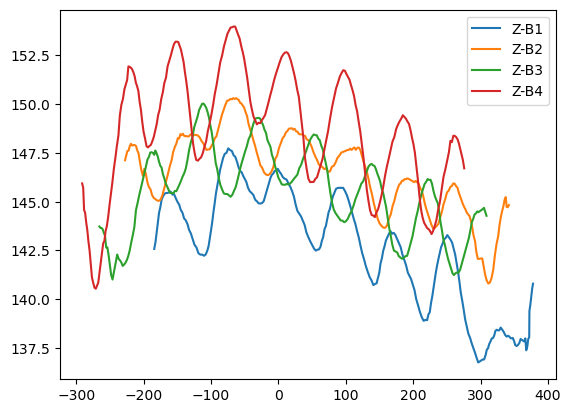

----------  1  ------------
----------  2-5-21-tweet_clip1.xlsx  ------------


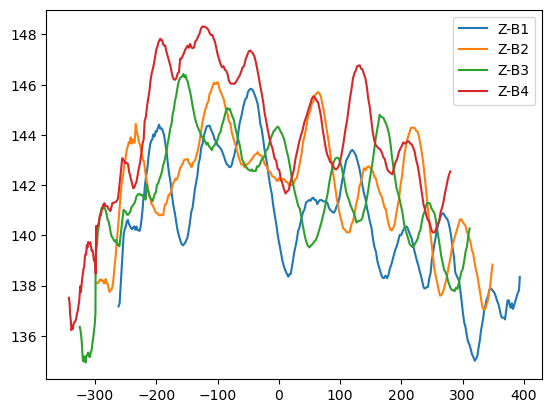

----------  1  ------------
----------  2-5-21-tweet_clip2.xlsx  ------------


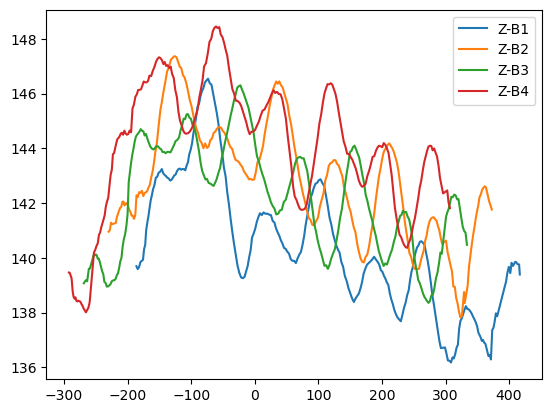

----------  0  ------------
----------  2-8-21-moon_clip1.xlsx  ------------


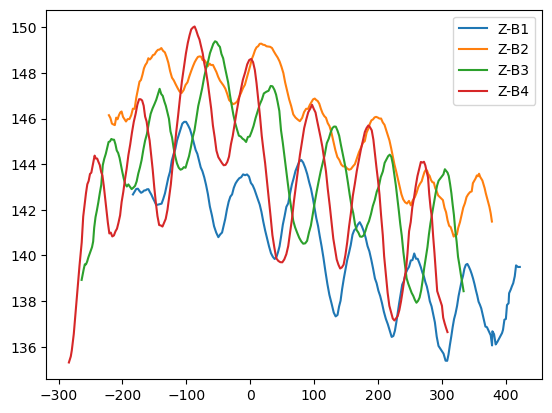

----------  0  ------------
----------  2-8-21-moon_clip2.xlsx  ------------


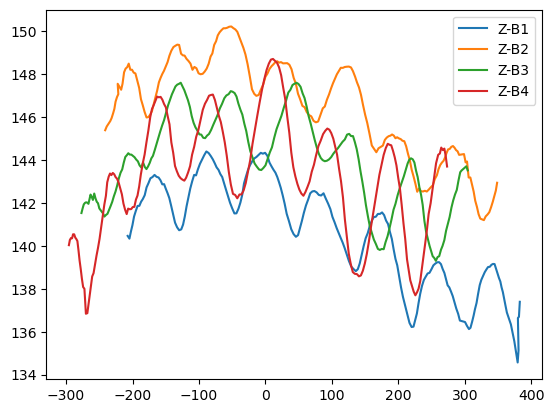

----------  0  ------------
----------  2-8-21-moon_clip3.xlsx  ------------


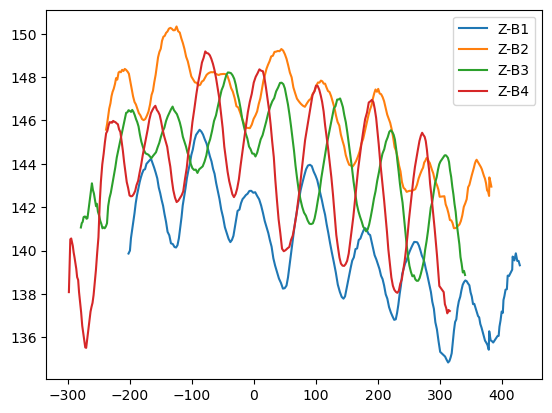

----------  0  ------------
----------  2-8-21-ptitnugget_clip2.xlsx  ------------


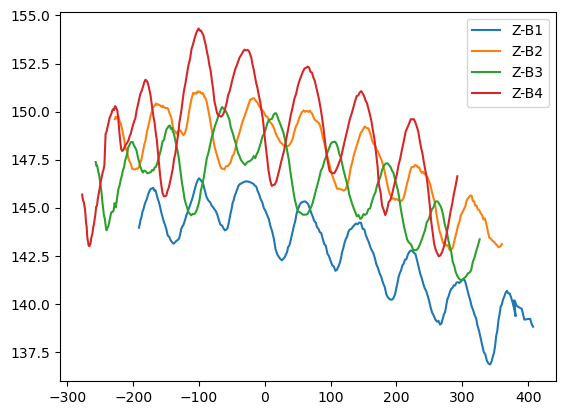

----------  0  ------------
----------  2-9-21-PtitNugget-clip1_manual.xlsx  ------------


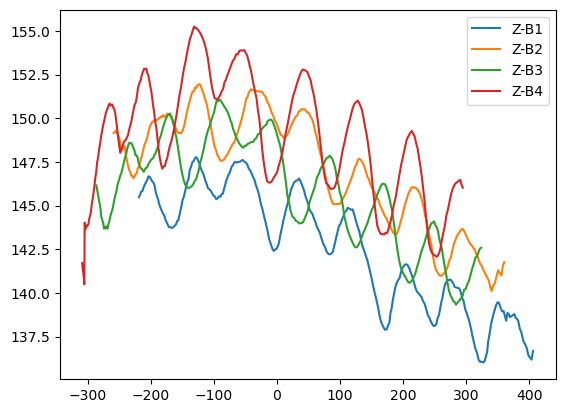

----------  0  ------------
----------  2-9-21-PtitNugget-clip2_manual.xlsx  ------------


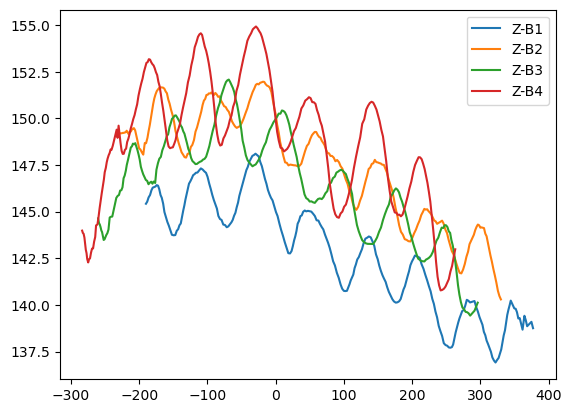

----------  0  ------------
----------  2-9-21-PtitNugget-clip3_manual.xlsx  ------------


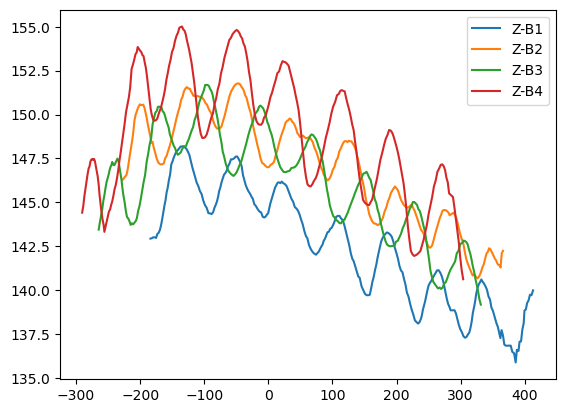

----------  0  ------------
----------  2-9-21-Robin-clip1_manual.xlsx  ------------


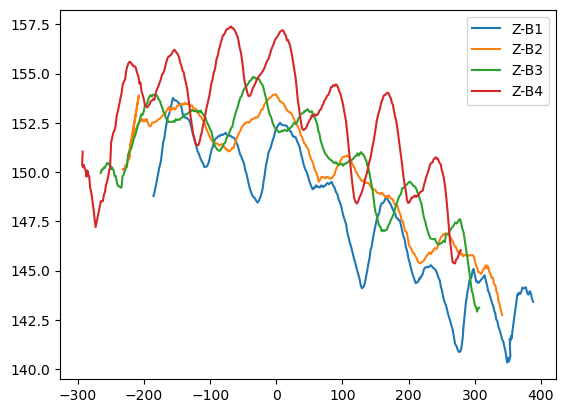

----------  0  ------------
----------  2-9-21-Robin-clip2_manual.xlsx  ------------


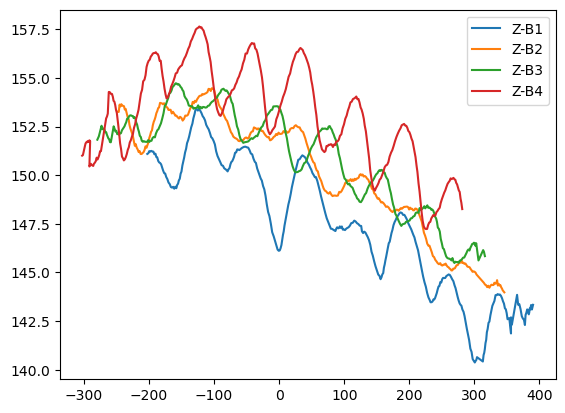

----------  1  ------------
----------  2-9-21-Robin-clip3_manual.xlsx  ------------


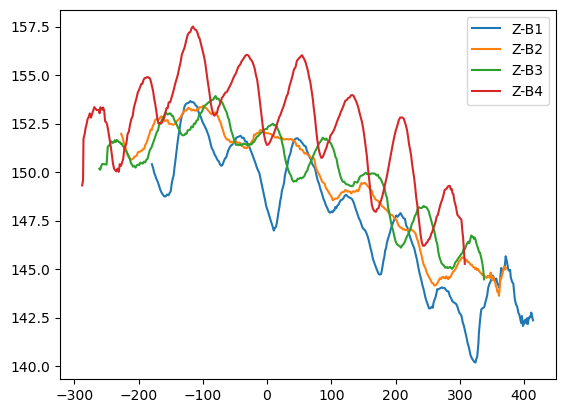

In [56]:
for i in range(len(ls_pds)):
    print("---------- ", binary_ls[i], " ------------")
    print("---------- ", files_xlsx[i], " ------------")
    """using func: """
    plot_z(ls_pds[i], on_x=True)

----------  1  ------------
----------  1-18-21-leona-clip1.xlsx  ------------


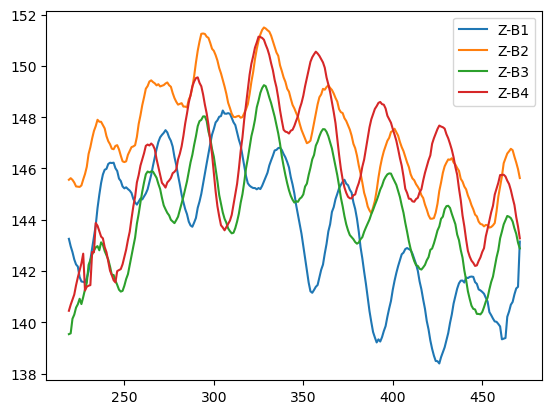

----------  0  ------------
----------  1-18-21-leona-clip2_copy.xlsx  ------------


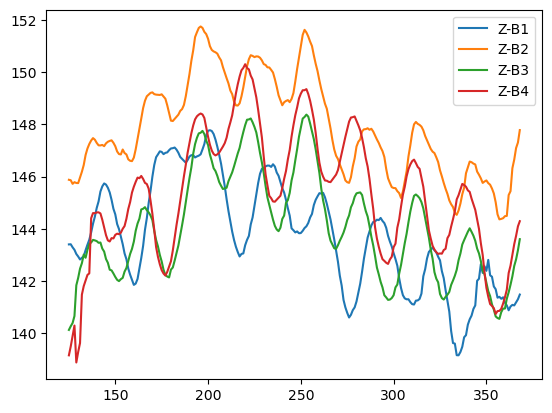

----------  1  ------------
----------  1-19-21-honey-clip1.xlsx  ------------


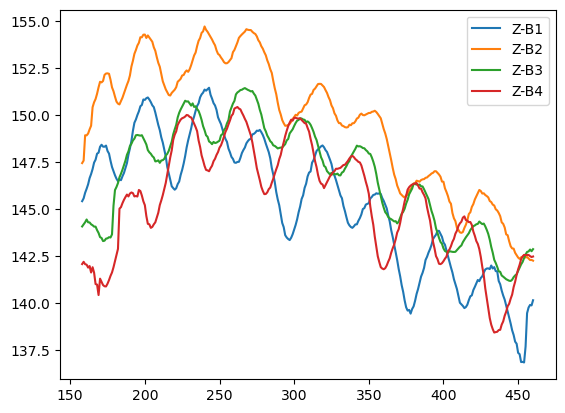

----------  0  ------------
----------  1-19-21-leona_clip1.xlsx  ------------


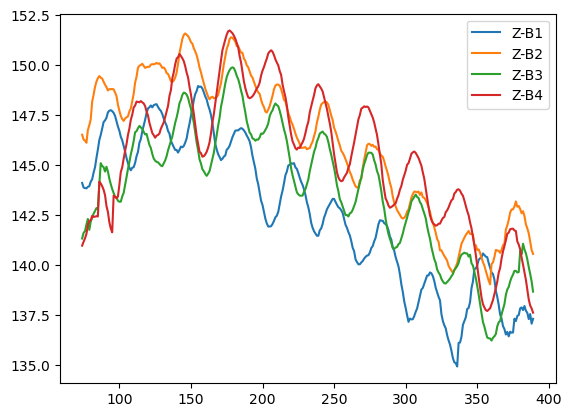

----------  0  ------------
----------  1-19-21-leona_clip2_copy.xlsx  ------------


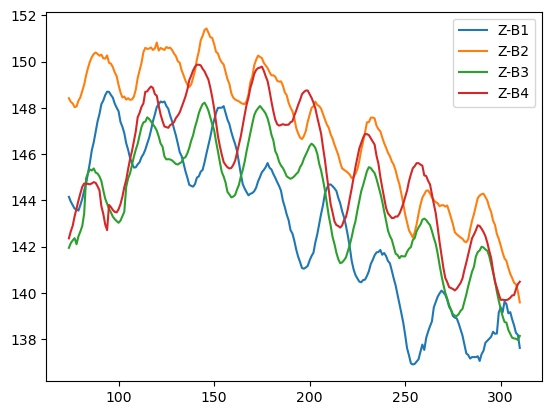

----------  0  ------------
----------  1-20-21-beyonce-clip1.xlsx  ------------


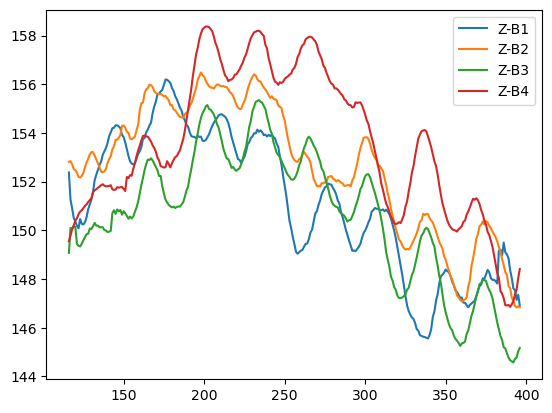

----------  0  ------------
----------  1-20-21-honey-clip1.xlsx  ------------


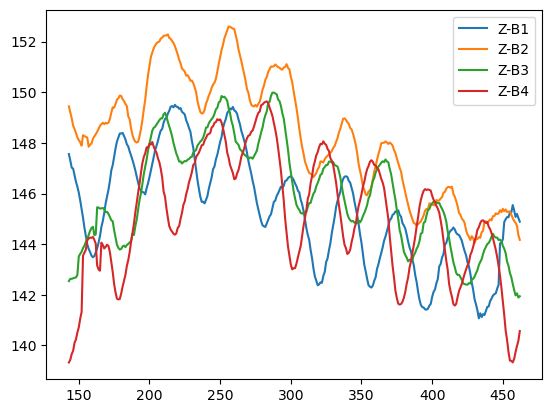

----------  0  ------------
----------  1-20-21-leona_clip1.xlsx  ------------


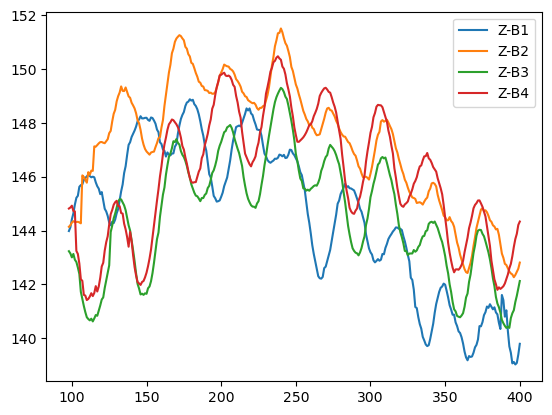

----------  1  ------------
----------  1-20-21-leona_clip2.xlsx  ------------


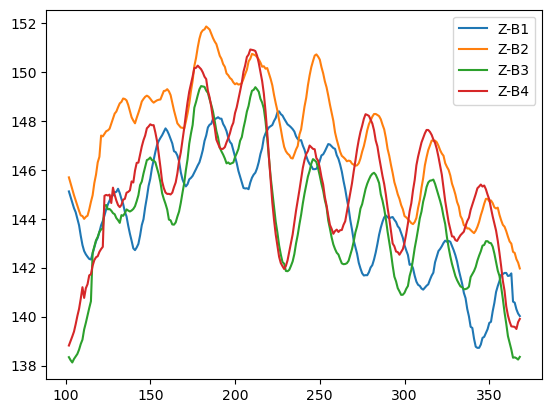

----------  0  ------------
----------  1-20-21-penelope_clip1.xlsx  ------------


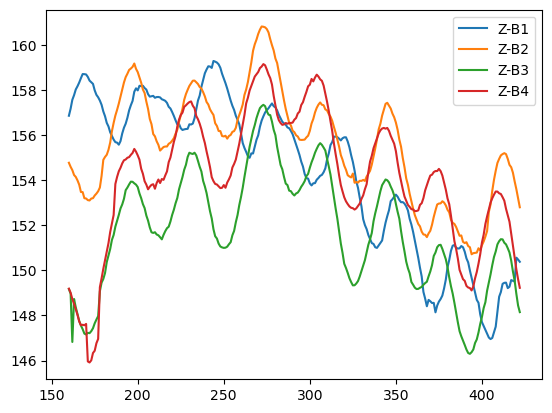

----------  0  ------------
----------  1-20-21-penelope_clip2_copy.xlsx  ------------


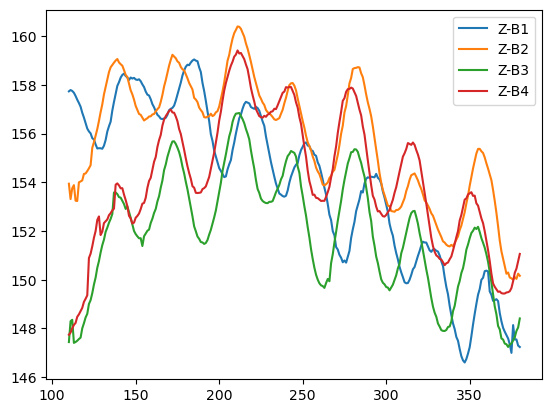

----------  0  ------------
----------  1-21-21-beyonce_clip1_copy.xlsx  ------------


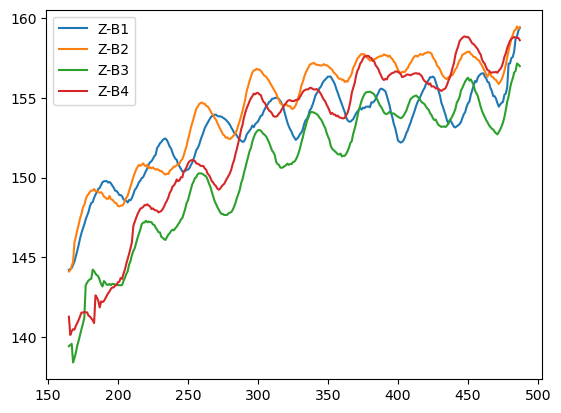

----------  1  ------------
----------  1-21-21-honey-clip2_copy.xlsx  ------------


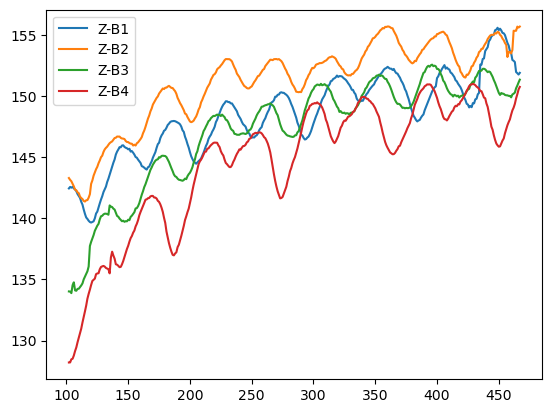

----------  0  ------------
----------  1-21-21-penelope_clip1_copy.xlsx  ------------


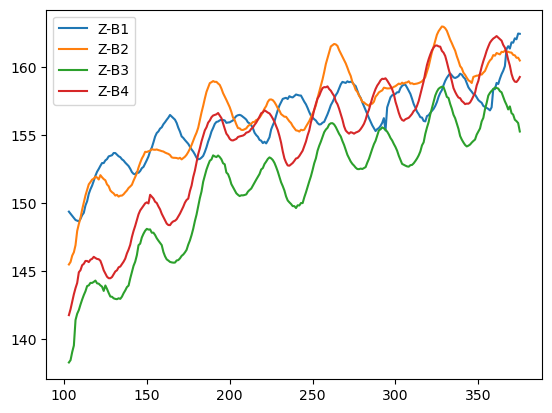

----------  0  ------------
----------  1-21-21-penelope_clip2_copy.xlsx  ------------


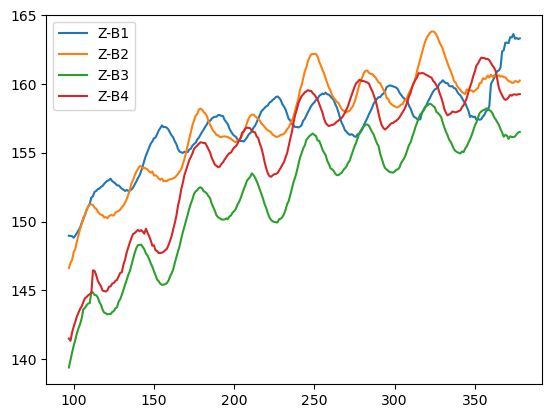

----------  0  ------------
----------  1-22-21-beyonce-clip2.xlsx  ------------


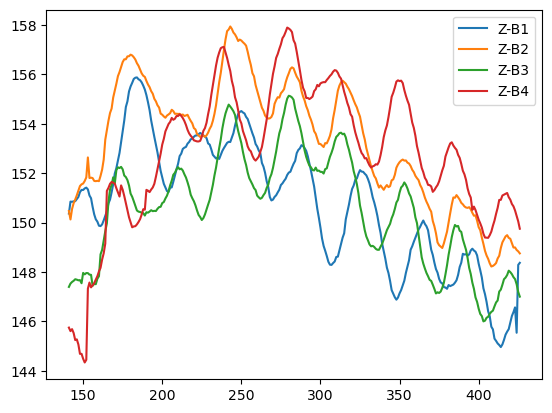

----------  1  ------------
----------  1-22-21-beyonce_clip1_copy2.xlsx  ------------


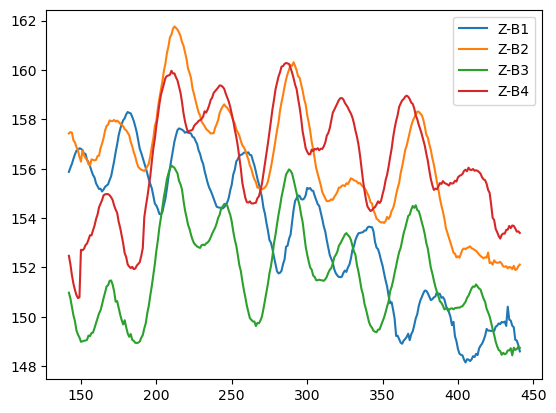

----------  1  ------------
----------  1-22-21-honey-clip1.xlsx  ------------


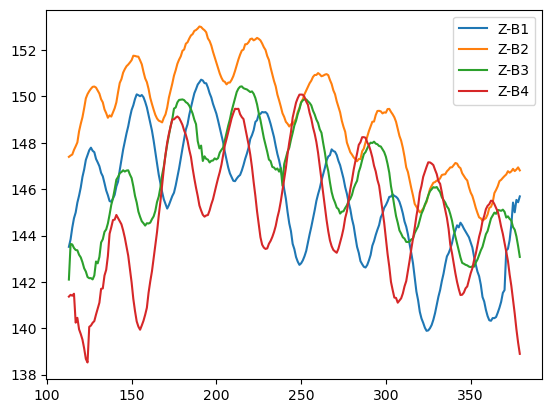

----------  1  ------------
----------  1-22-21-honey-clip2_copy.xlsx  ------------


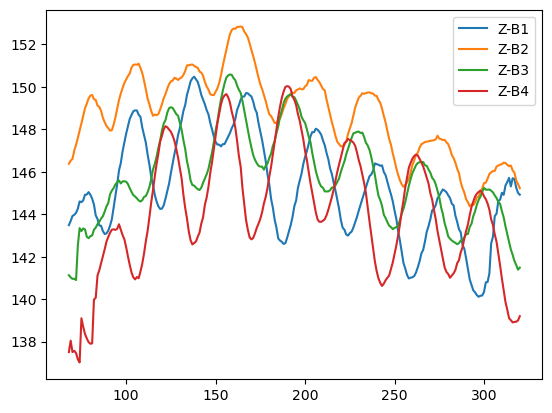

----------  1  ------------
----------  1-22-21-penelope_clip1_copy.xlsx  ------------


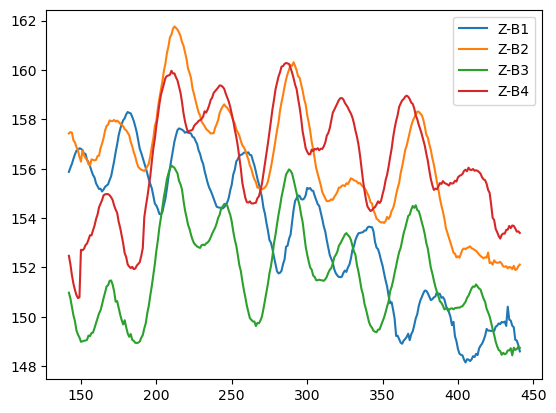

----------  0  ------------
----------  1-25-21-moonique_clip1.xlsx  ------------


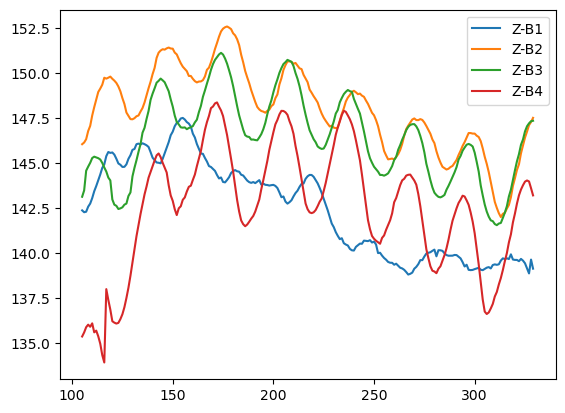

----------  0  ------------
----------  1-25-21-moonique_clip2.xlsx  ------------


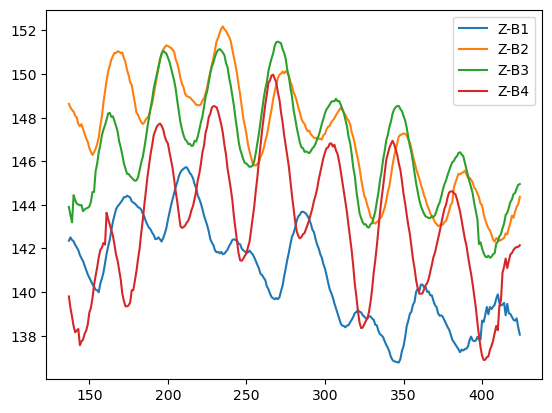

----------  0  ------------
----------  1-26-21-alice_clip1_copy.xlsx  ------------


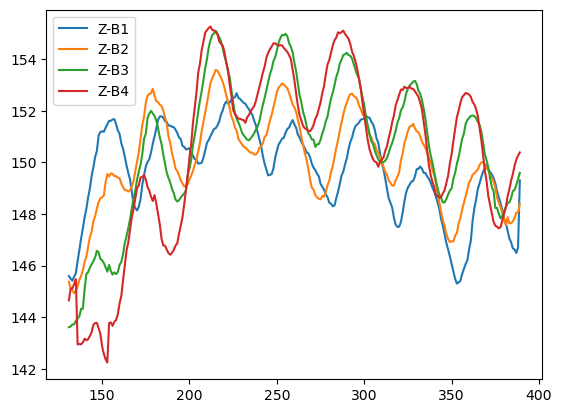

----------  0  ------------
----------  1-26-21-moonique_clip1_copy.xlsx  ------------


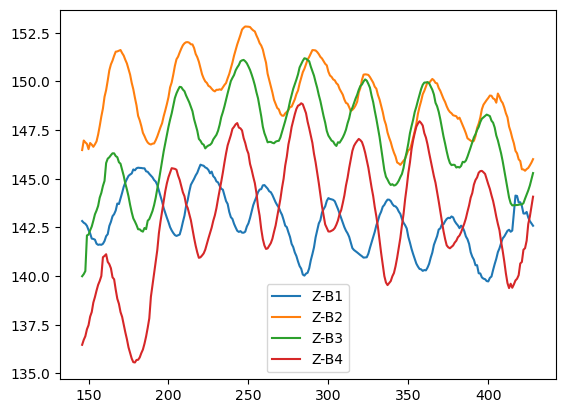

----------  0  ------------
----------  1-26-21-moonique_clip2.xlsx  ------------


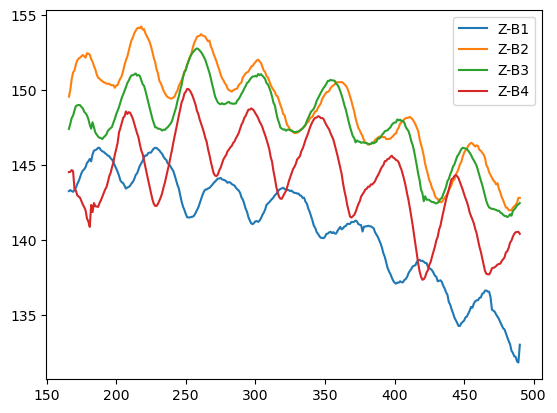

----------  0  ------------
----------  1-28-21-alice_clip1.xlsx  ------------


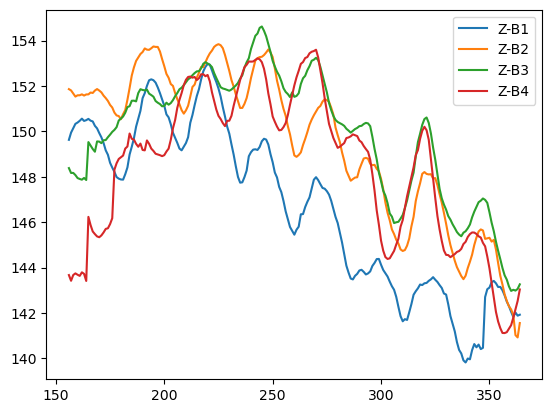

----------  1  ------------
----------  1-28-21-alice_clip2_copy.xlsx  ------------


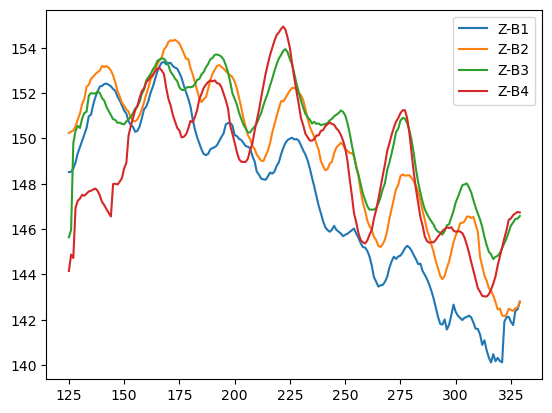

----------  0  ------------
----------  1-28-21-moonique_clip2.xlsx  ------------


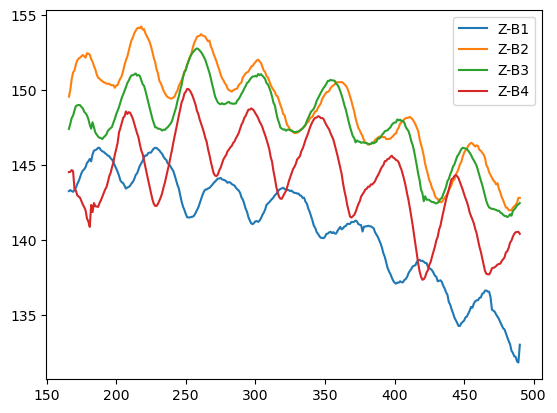

----------  1  ------------
----------  2-1-21-tweet_clip1.xlsx  ------------


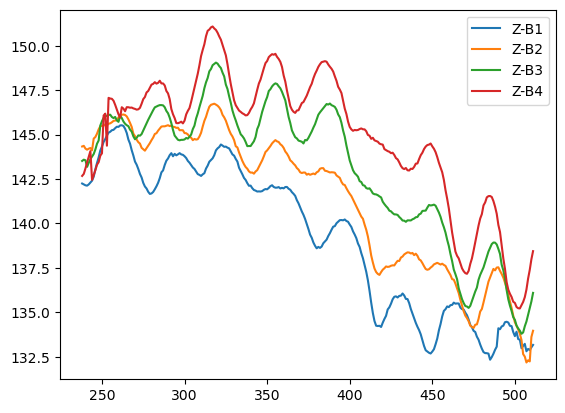

----------  0  ------------
----------  2-10-21-moolan_clip1.xlsx  ------------


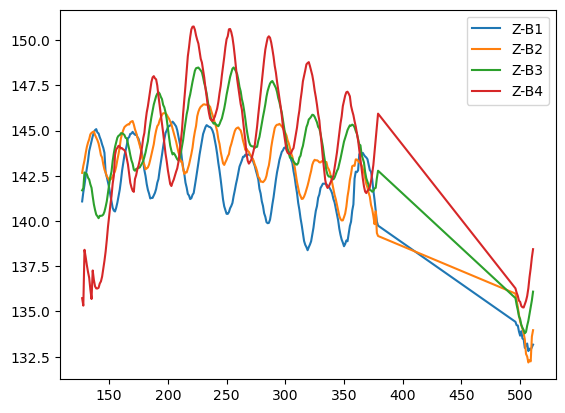

----------  0  ------------
----------  2-10-21-moolan_clip2.xlsx  ------------


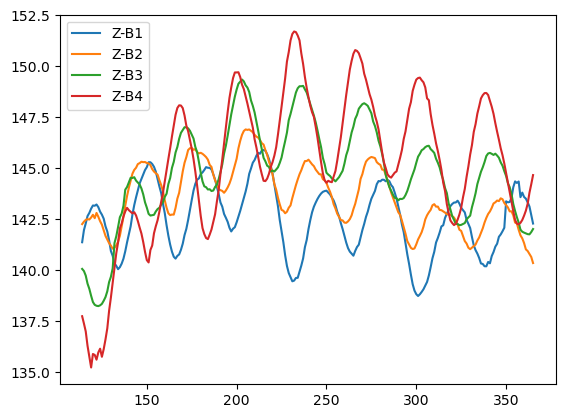

----------  0  ------------
----------  2-11-21-loza_clip1.xlsx  ------------


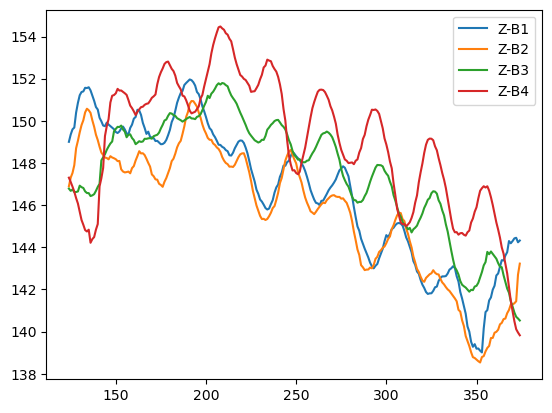

----------  0  ------------
----------  2-11-21-moon_clip1.xlsx  ------------


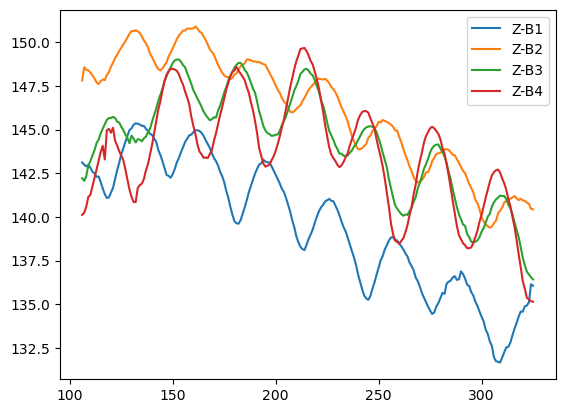

----------  1  ------------
----------  2-11-21-robin_clip1.xlsx  ------------


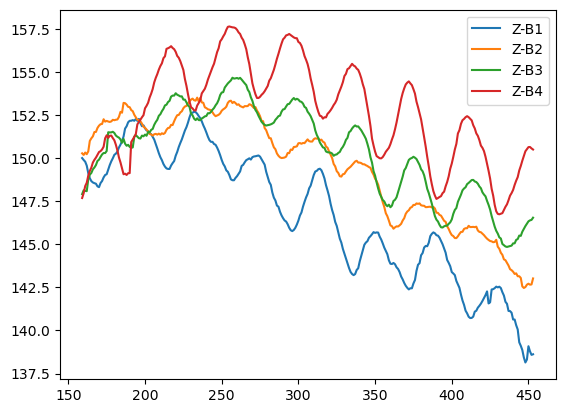

----------  1  ------------
----------  2-11-21-tweet_clip1.xlsx  ------------


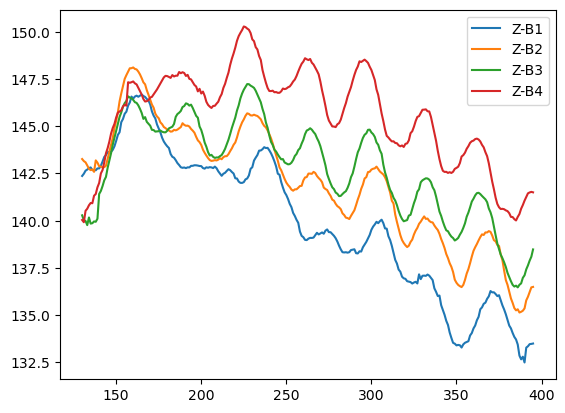

----------  0  ------------
----------  2-12-21-leona_clip1.xlsx  ------------


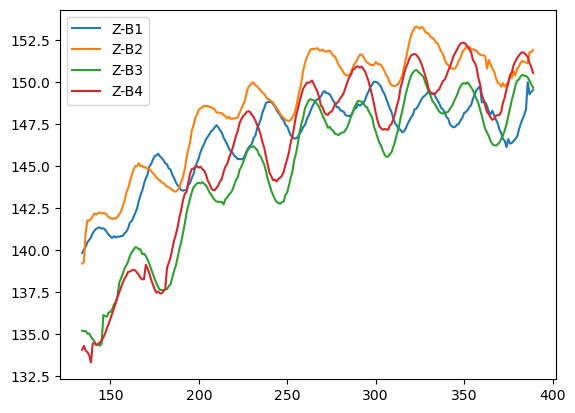

----------  0  ------------
----------  2-12-21-leona_clip2.xlsx  ------------


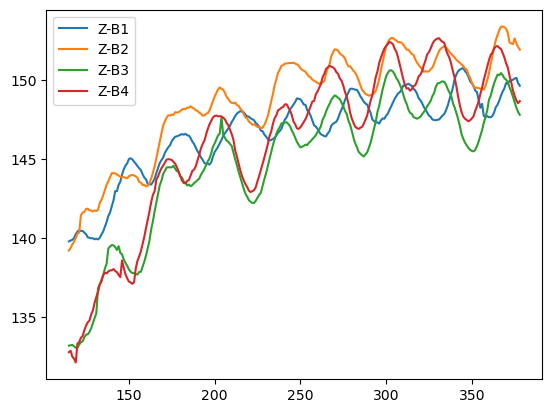

----------  0  ------------
----------  2-12-21-leona_clip3.xlsx  ------------


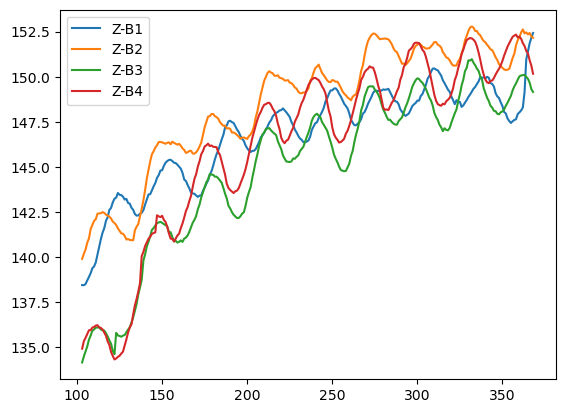

----------  0  ------------
----------  2-12-21-moon_clip1.xlsx  ------------


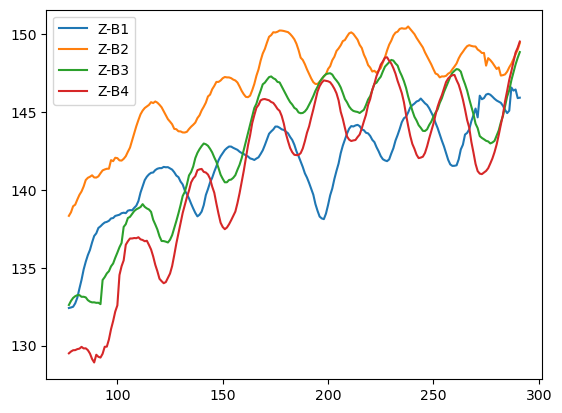

----------  1  ------------
----------  2-12-21-robin_clip1.xlsx  ------------


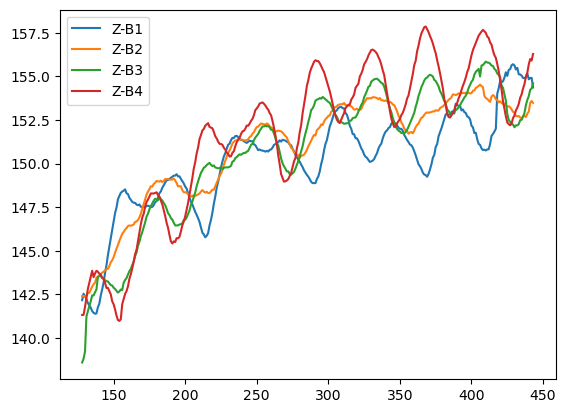

----------  1  ------------
----------  2-12-21-robin_clip2.xlsx  ------------


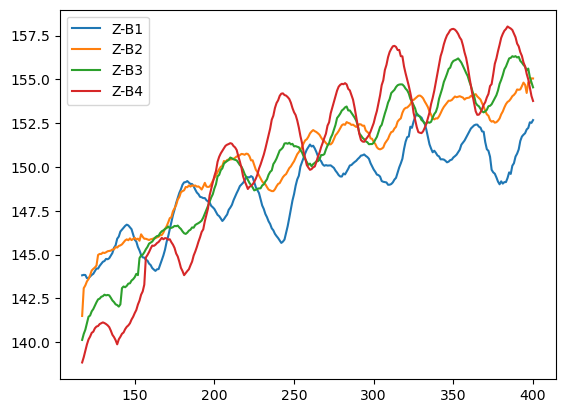

----------  1  ------------
----------  2-12-21-robin_clip3.xlsx  ------------


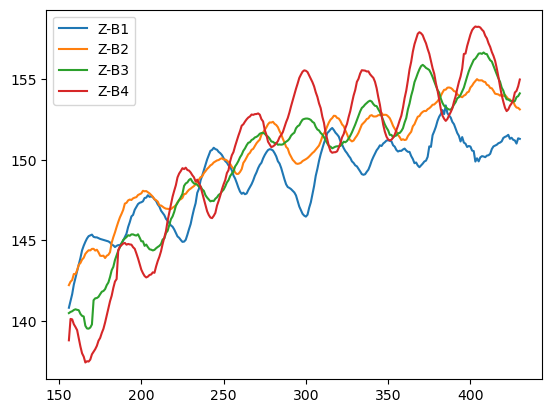

----------  1  ------------
----------  2-12-21-tweet_clip1.xlsx  ------------


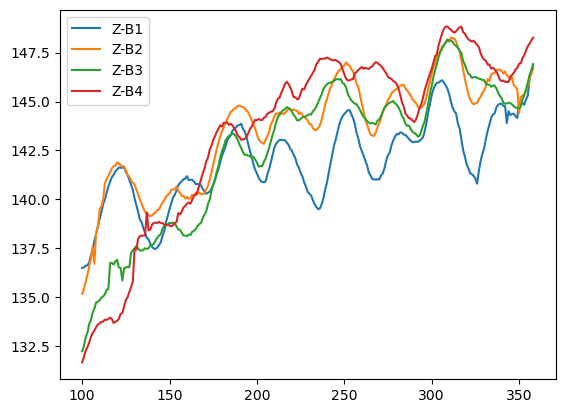

----------  0  ------------
----------  2-2-21-loza_clip1.xlsx  ------------


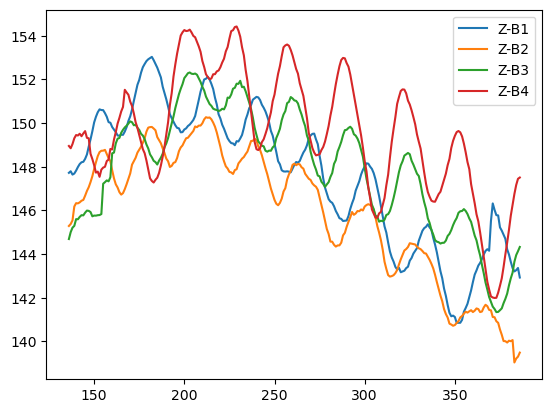

----------  0  ------------
----------  2-2-21-loza_clip2.xlsx  ------------


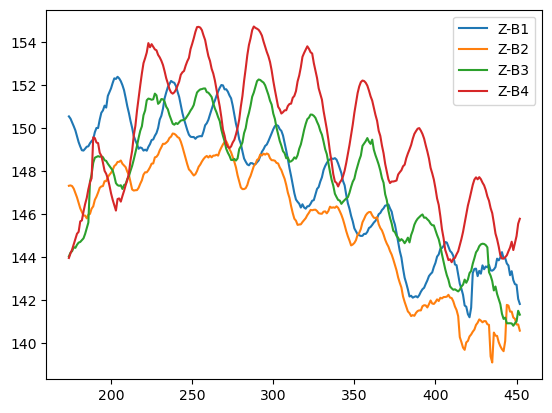

----------  0  ------------
----------  2-2-21-loza_clip3.xlsx  ------------


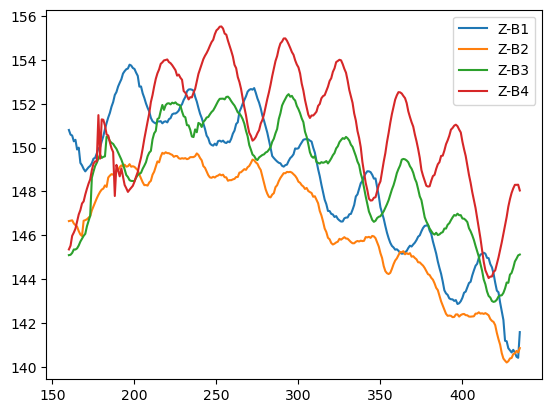

----------  1  ------------
----------  2-2-21-tweet_clip1.xlsx  ------------


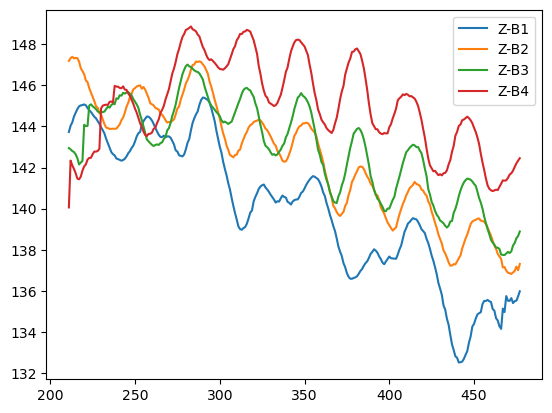

----------  1  ------------
----------  2-2-21-tweet_clip2.xlsx  ------------


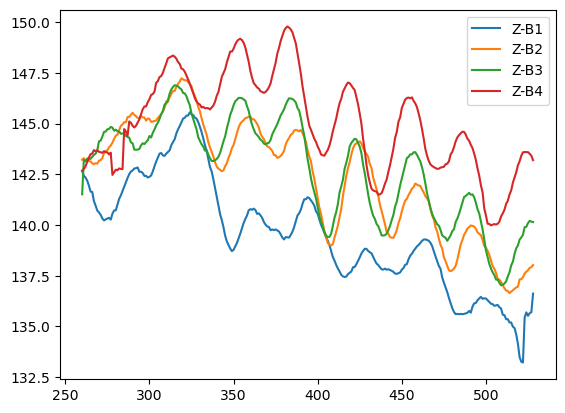

----------  0  ------------
----------  2-3-21-loza_clip1.xlsx  ------------


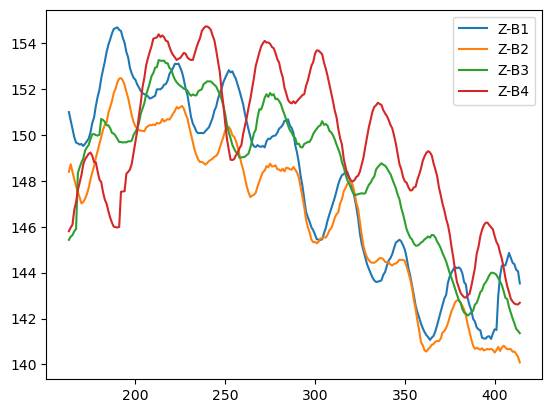

----------  0  ------------
----------  2-3-21-loza_clip3.xlsx  ------------


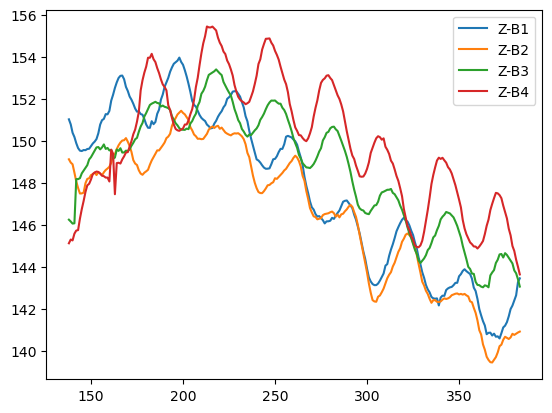

----------  0  ------------
----------  2-3-21-moon_clip1.xlsx  ------------


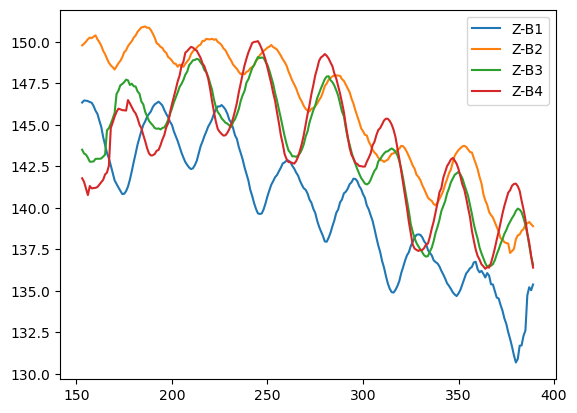

----------  0  ------------
----------  2-3-21-moon_clip2.xlsx  ------------


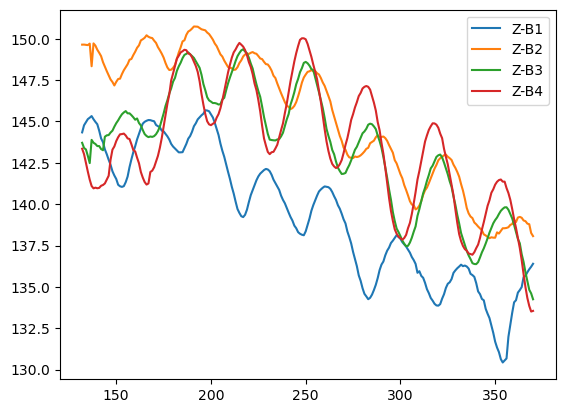

----------  1  ------------
----------  2-4-21-loza_clip1.xlsx  ------------


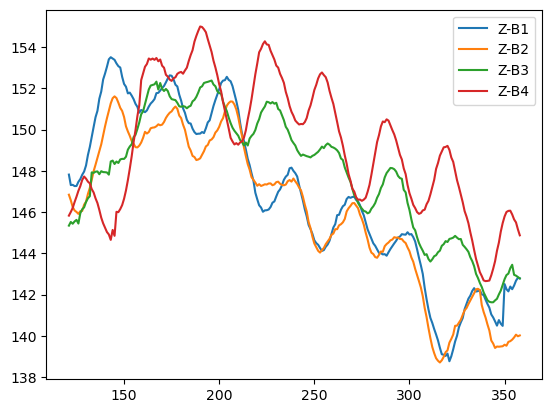

----------  1  ------------
----------  2-4-21-loza_clip2.xlsx  ------------


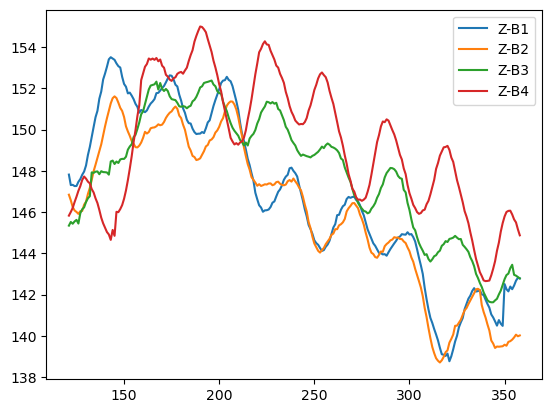

----------  0  ------------
----------  2-5-21-moon_clip1.xlsx  ------------


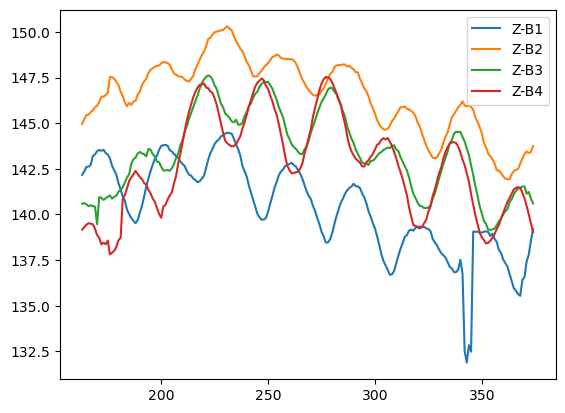

----------  0  ------------
----------  2-5-21-moon_clip2.xlsx  ------------


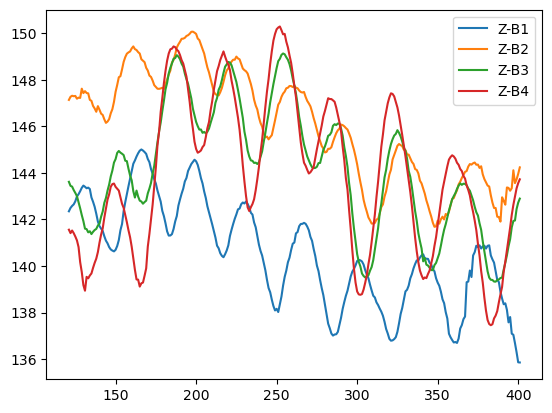

----------  0  ------------
----------  2-5-21-PtitNugget_clip1.xlsx  ------------


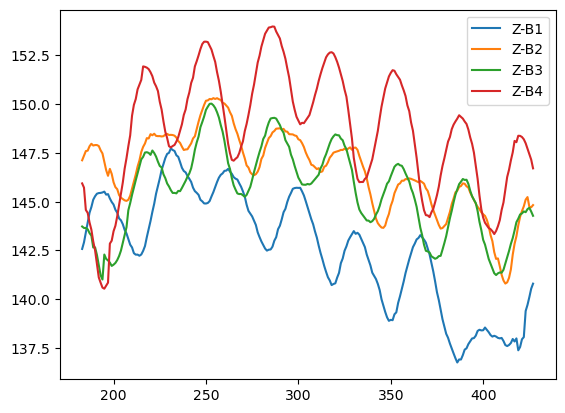

----------  1  ------------
----------  2-5-21-tweet_clip1.xlsx  ------------


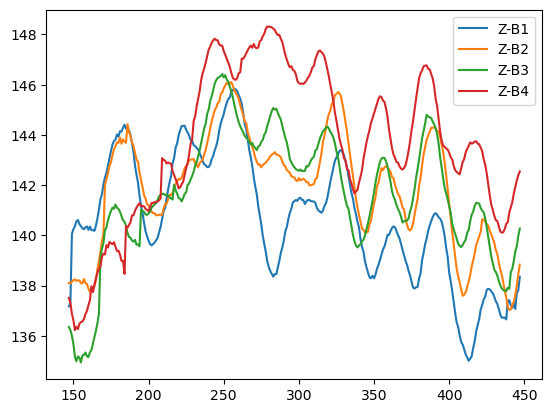

----------  1  ------------
----------  2-5-21-tweet_clip2.xlsx  ------------


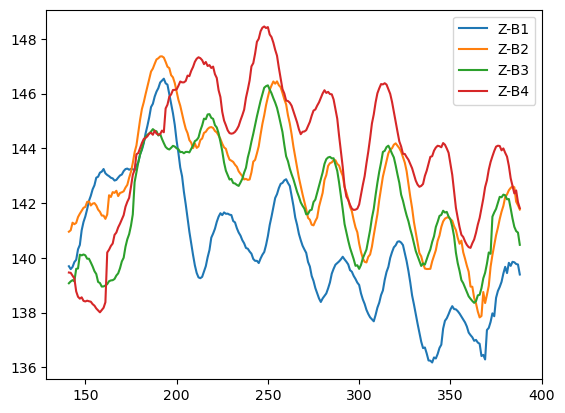

----------  0  ------------
----------  2-8-21-moon_clip1.xlsx  ------------


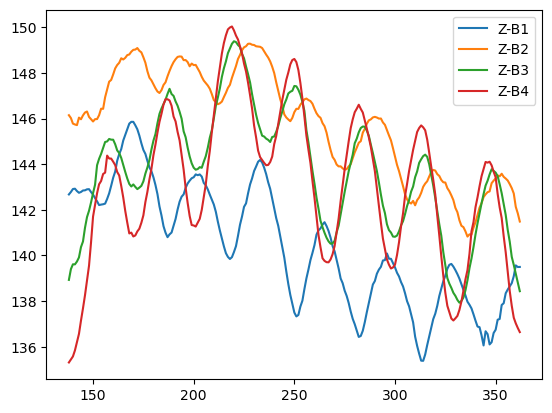

----------  0  ------------
----------  2-8-21-moon_clip2.xlsx  ------------


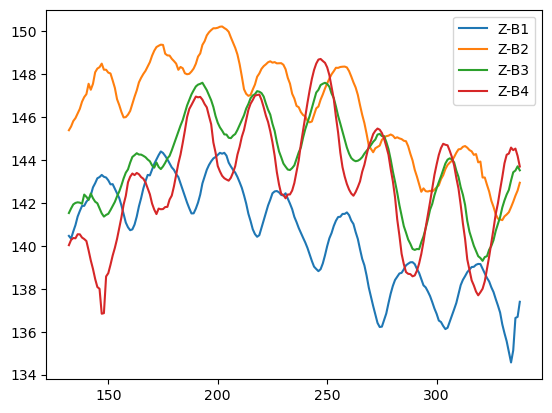

----------  0  ------------
----------  2-8-21-moon_clip3.xlsx  ------------


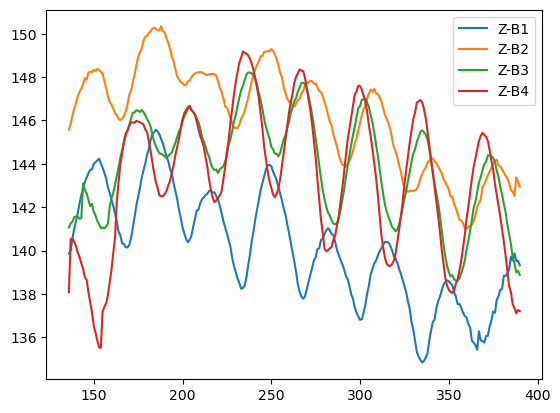

----------  0  ------------
----------  2-8-21-ptitnugget_clip2.xlsx  ------------


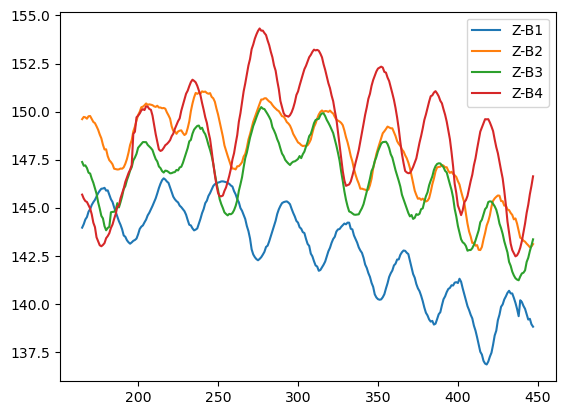

----------  0  ------------
----------  2-9-21-PtitNugget-clip1_manual.xlsx  ------------


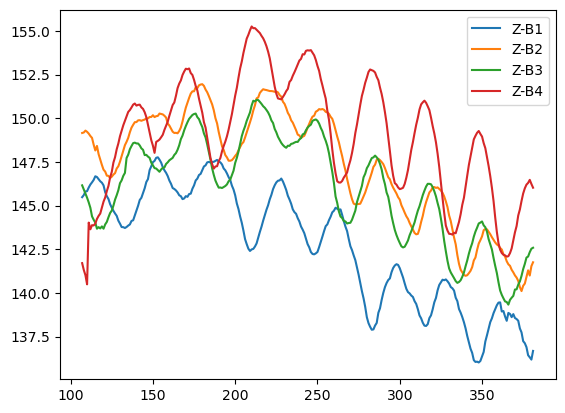

----------  0  ------------
----------  2-9-21-PtitNugget-clip2_manual.xlsx  ------------


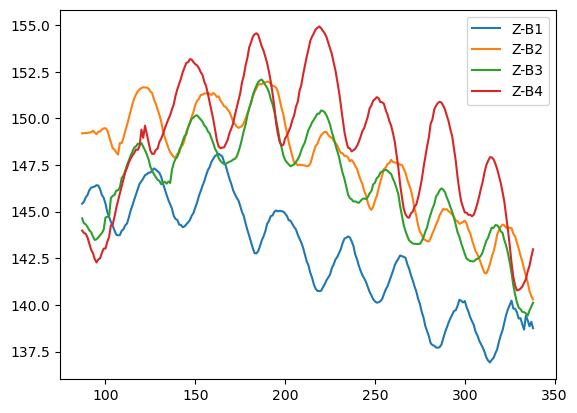

----------  0  ------------
----------  2-9-21-PtitNugget-clip3_manual.xlsx  ------------


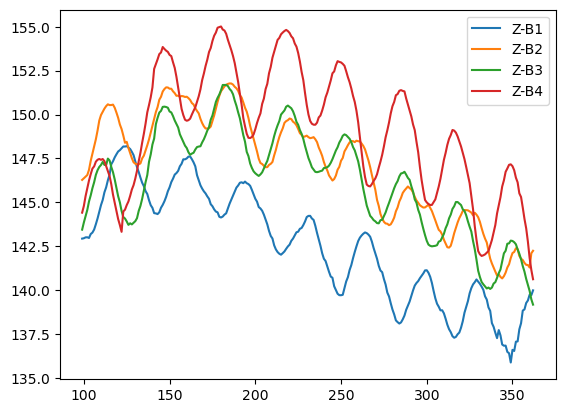

----------  0  ------------
----------  2-9-21-Robin-clip1_manual.xlsx  ------------


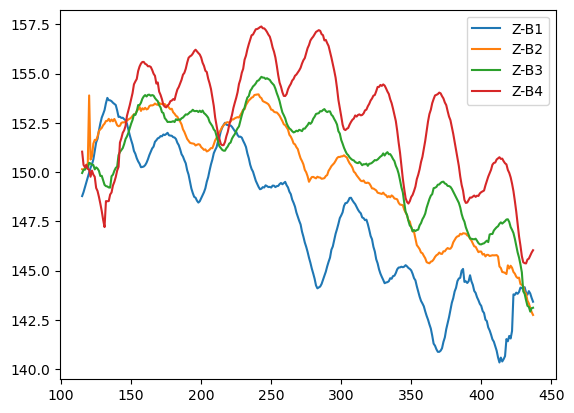

----------  0  ------------
----------  2-9-21-Robin-clip2_manual.xlsx  ------------


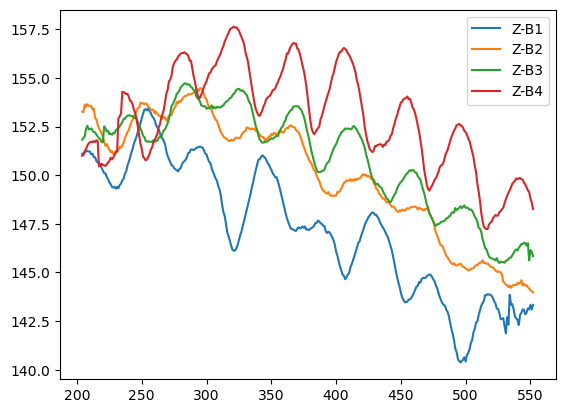

----------  1  ------------
----------  2-9-21-Robin-clip3_manual.xlsx  ------------


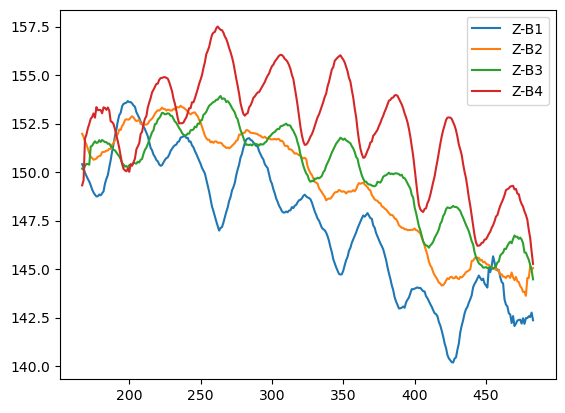

In [34]:
for i in range(len(ls_pds)):
    print("---------- ", binary_ls[i], " ------------")
    print("---------- ", files_xlsx[i], " ------------")
    """using func: """
    plot_z(ls_pds[i])

### Find the frequency and amptitude of each curves

In [36]:
# https://stackoverflow.com/questions/26105698/how-to-calculate-frequency-of-a-give-wave-and-time

import numpy as np
import scipy as sy
import scipy.fftpack as syfp
import pylab as pyl

0.0

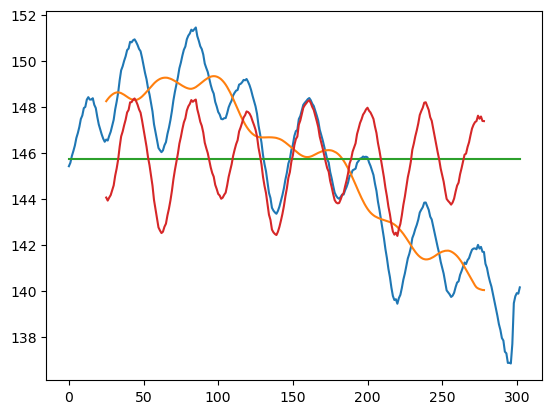

In [114]:
# get line
temp_ls = one_ex['Z-B1']
temp_ls = temp_ls.reset_index(drop=True)
plt.plot(temp_ls)

# get long-term trend
long_trend = temp_ls.rolling(50, center=True).mean()
plt.plot(long_trend)

# get average of the long_trend 
mid_trend = long_trend.mean()
mid_trend_ls = [mid_trend for i in range(len(long_trend))]
plt.plot(mid_trend_ls)

# get diff: (diff: long_trend - mid_trend_ls)
diff = long_trend - mid_trend_ls

# diff 
ls_sub = temp_ls - diff
plt.plot(ls_sub)
# drop nan
ls_sub = ls_sub.dropna()
# get amp
amp = max(ls_sub) - min(ls_sub)
# Do FFT analysis of array
FFT = sy.fft.fft(np.array(ls_sub))
# Getting the related frequencies
freqs = syfp.fftfreq(len(ls_sub), amp)     
# get best freq
max_freq = np.argmax(np.lib.scimath.log10(abs(FFT)))
# get freq
freqs[max_freq]

0.010187431271222538

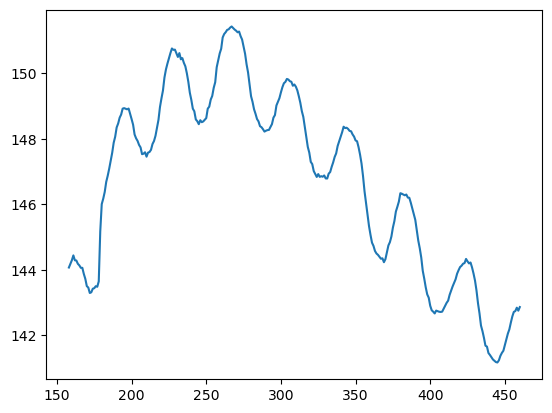

In [99]:
# get line
temp_ls = one_ex['Z-B3']
plt.plot(temp_ls)
# get long-term trend
long_trend = temp_ls.rolling(25, center=True).mean()
# diff 
ls_sub = temp_ls - long_trend
# drop nan
ls_sub = ls_sub.dropna()
# get amp
amp = max(ls_sub) - min(ls_sub)
# Do FFT analysis of array
FFT = sy.fft.fft(np.array(ls_sub))
# Getting the related frequencies
freqs = syfp.fftfreq(len(ls_sub), amp)     
# get best freq
max_freq = np.argmax(np.lib.scimath.log10(abs(FFT)))
# get freq
freqs[max_freq]

0.0

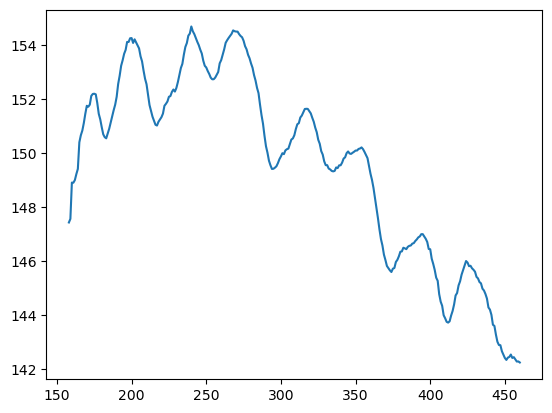

In [102]:
# get line
temp_ls = one_ex['Z-B2']
plt.plot(temp_ls)

# Do FFT analysis of array
FFT = sy.fft.fft(np.array(temp_ls))
# Getting the related frequencies
freqs = syfp.fftfreq(len(ls_sub), 5)     
# get best freq
max_freq = np.argmax(np.lib.scimath.log10(abs(FFT)))
# get freq
freqs[max_freq]

# Other visualization

### Two curves (D1: B4-B3, D2: B2-B1)

In [114]:

""" 
func: 
    to plot the d
args: 
    file: pd
    binary_score: bool
    choose: str
"""
def plot_d(test, binary_score, only_pos=False):

    # if only plot pos, return none for neg class
    if only_pos and binary_score==0: return None 
    
    # create D1 and D2
    test['D1'] = test['Z-B4'] - test['Z-B3']
    test['D2'] = test['Z-B2'] - test['Z-B1']

    # plot
    plt.plot(test['D1'], label='D1')
    plt.plot(test['D2'], label='D2')

    plt.legend()
    plt.show()

----------  0  ------------
----------  1-18-21-leona-clip1.xlsx  ------------
----------  0  ------------
----------  1-18-21-leona-clip2_copy.xlsx  ------------
----------  0  ------------
----------  1-19-21-honey-clip1.xlsx  ------------
----------  0  ------------
----------  1-19-21-leona_clip1.xlsx  ------------
----------  0  ------------
----------  1-19-21-leona_clip2_copy.xlsx  ------------
----------  0  ------------
----------  1-20-21-beyonce-clip1.xlsx  ------------
----------  0  ------------
----------  1-20-21-honey-clip1.xlsx  ------------
----------  0  ------------
----------  1-20-21-leona_clip1.xlsx  ------------
----------  0  ------------
----------  1-20-21-leona_clip2.xlsx  ------------
----------  0  ------------
----------  1-20-21-penelope_clip1.xlsx  ------------
----------  0  ------------
----------  1-20-21-penelope_clip2_copy.xlsx  ------------
----------  0  ------------
----------  1-21-21-beyonce_clip1_copy.xlsx  ------------
----------  0  -------

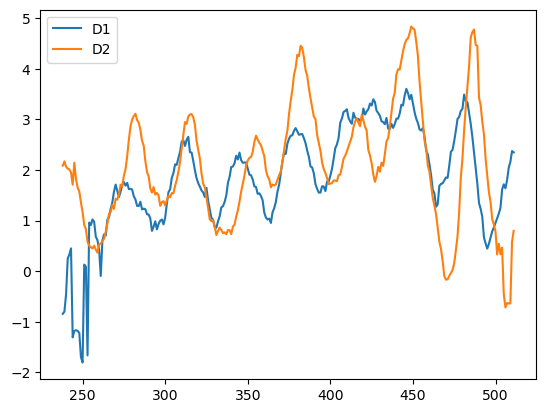

----------  0  ------------
----------  2-10-21-moolan_clip1.xlsx  ------------
----------  0  ------------
----------  2-10-21-moolan_clip2.xlsx  ------------
----------  0  ------------
----------  2-11-21-loza_clip1.xlsx  ------------
----------  0  ------------
----------  2-11-21-moon_clip1.xlsx  ------------
----------  1  ------------
----------  2-11-21-robin_clip1.xlsx  ------------


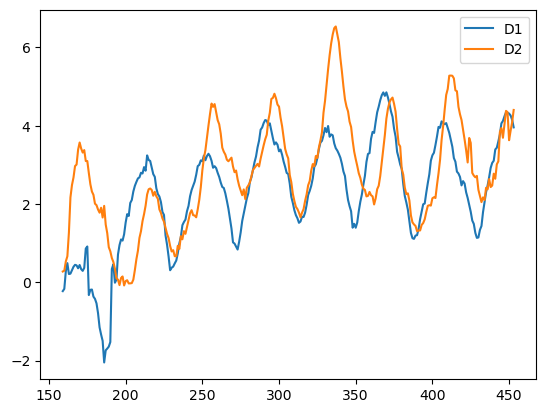

----------  0  ------------
----------  2-11-21-tweet_clip1.xlsx  ------------
----------  0  ------------
----------  2-12-21-leona_clip1.xlsx  ------------
----------  0  ------------
----------  2-12-21-leona_clip2.xlsx  ------------
----------  0  ------------
----------  2-12-21-leona_clip3.xlsx  ------------
----------  0  ------------
----------  2-12-21-moon_clip1.xlsx  ------------
----------  1  ------------
----------  2-12-21-robin_clip1.xlsx  ------------


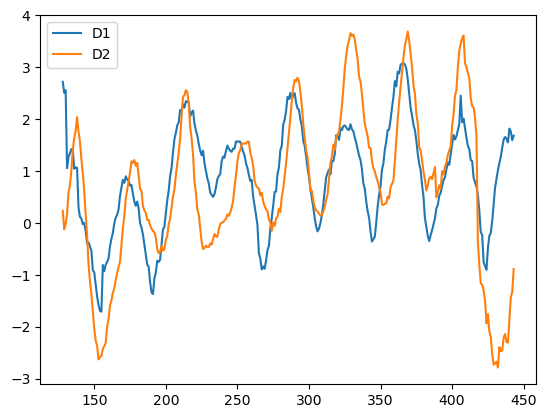

----------  0  ------------
----------  2-12-21-robin_clip2.xlsx  ------------
----------  0  ------------
----------  2-12-21-robin_clip3.xlsx  ------------
----------  1  ------------
----------  2-12-21-tweet_clip1.xlsx  ------------


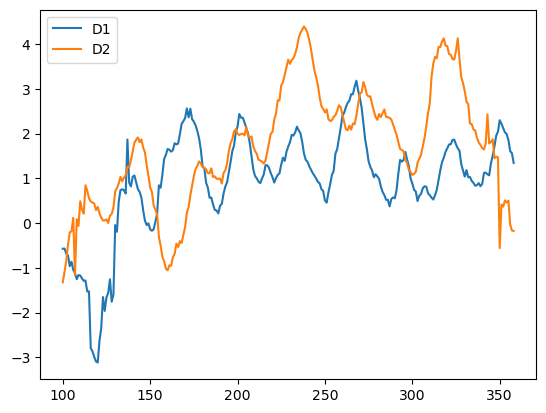

----------  0  ------------
----------  2-2-21-loza_clip1.xlsx  ------------
----------  0  ------------
----------  2-2-21-loza_clip2.xlsx  ------------
----------  0  ------------
----------  2-2-21-loza_clip3.xlsx  ------------
----------  0  ------------
----------  2-2-21-tweet_clip1.xlsx  ------------
----------  0  ------------
----------  2-2-21-tweet_clip2.xlsx  ------------
----------  0  ------------
----------  2-3-21-loza_clip1.xlsx  ------------
----------  0  ------------
----------  2-3-21-loza_clip3.xlsx  ------------
----------  0  ------------
----------  2-3-21-moon_clip1.xlsx  ------------
----------  0  ------------
----------  2-3-21-moon_clip2.xlsx  ------------
----------  0  ------------
----------  2-4-21-loza_clip1.xlsx  ------------
----------  0  ------------
----------  2-4-21-loza_clip2.xlsx  ------------
----------  0  ------------
----------  2-5-21-PtitNugget_clip1.xlsx  ------------
----------  0  ------------
----------  2-5-21-moon_clip1.xlsx  ----

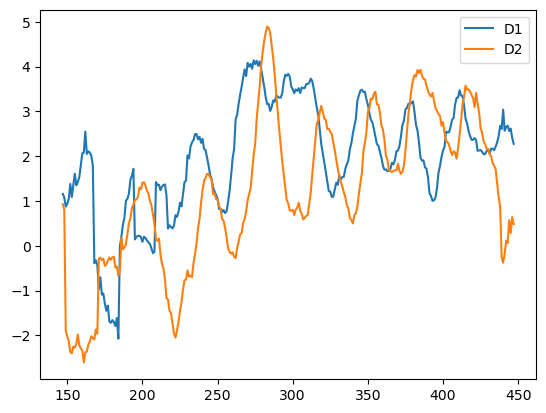

----------  1  ------------
----------  2-5-21-tweet_clip2.xlsx  ------------


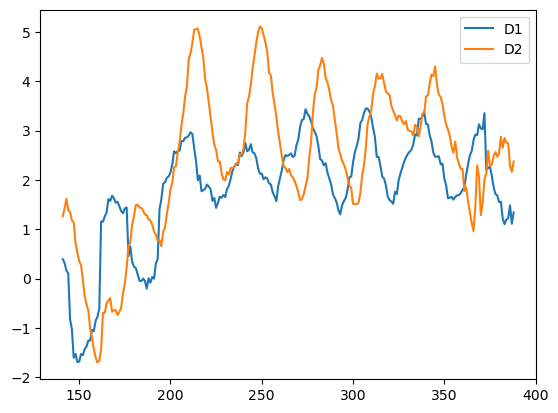

----------  0  ------------
----------  2-8-21-moon_clip1.xlsx  ------------
----------  0  ------------
----------  2-8-21-moon_clip2.xlsx  ------------
----------  0  ------------
----------  2-8-21-moon_clip3.xlsx  ------------
----------  0  ------------
----------  2-8-21-ptitnugget_clip2.xlsx  ------------
----------  0  ------------
----------  2-9-21-PtitNugget-clip1_manual.xlsx  ------------
----------  0  ------------
----------  2-9-21-PtitNugget-clip2_manual.xlsx  ------------
----------  0  ------------
----------  2-9-21-PtitNugget-clip3_manual.xlsx  ------------
----------  0  ------------
----------  2-9-21-Robin-clip1_manual.xlsx  ------------
----------  0  ------------
----------  2-9-21-Robin-clip2_manual.xlsx  ------------
----------  0  ------------
----------  2-9-21-Robin-clip3_manual.xlsx  ------------


In [115]:
for i in range(len(ls_pds)):
    print("---------- ", binary_ls[i], " ------------")
    print("---------- ", files_xlsx[i], " ------------")
    """using func: plot_d"""
    plot_d(ls_pds[i], binary_ls[i], only_pos=True)

----------  0  ------------
----------  1-18-21-leona-clip1.xlsx  ------------


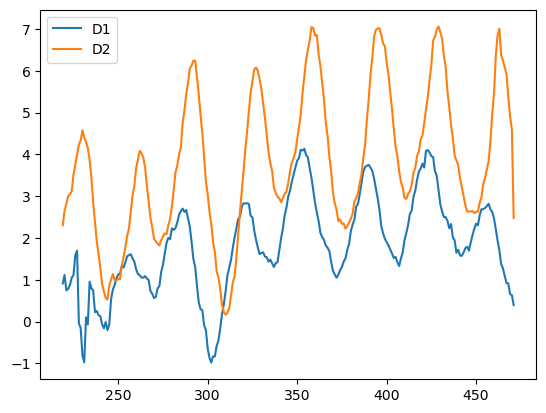

----------  0  ------------
----------  1-18-21-leona-clip2_copy.xlsx  ------------


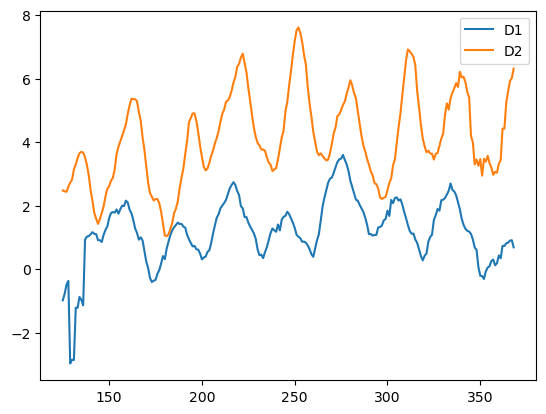

----------  0  ------------
----------  1-19-21-honey-clip1.xlsx  ------------


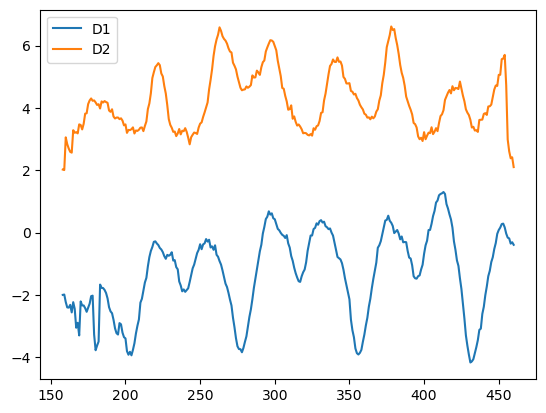

----------  0  ------------
----------  1-19-21-leona_clip1.xlsx  ------------


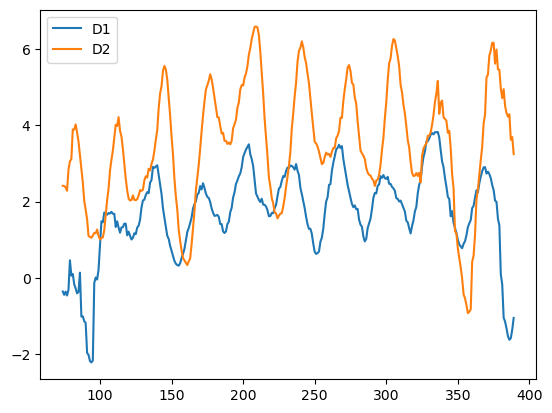

----------  0  ------------
----------  1-19-21-leona_clip2_copy.xlsx  ------------


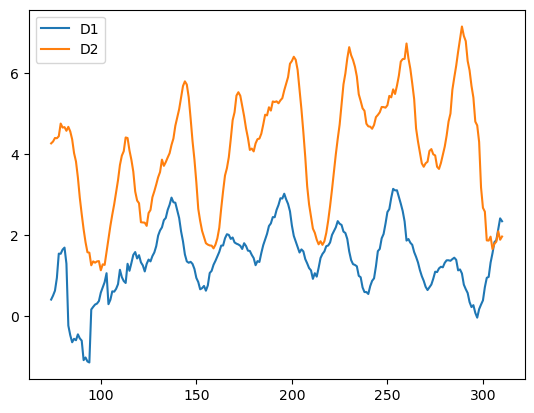

----------  0  ------------
----------  1-20-21-beyonce-clip1.xlsx  ------------


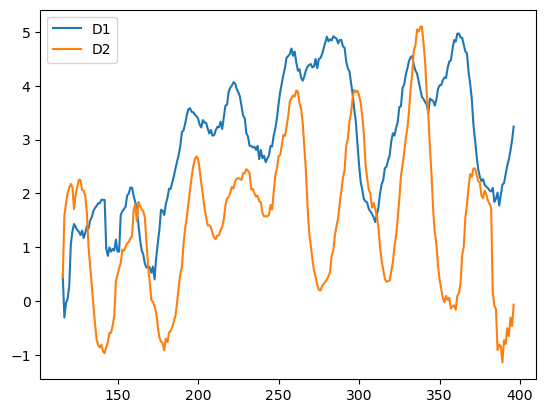

----------  0  ------------
----------  1-20-21-honey-clip1.xlsx  ------------


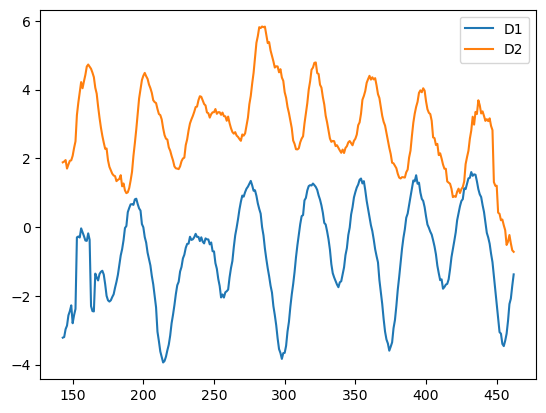

----------  0  ------------
----------  1-20-21-leona_clip1.xlsx  ------------


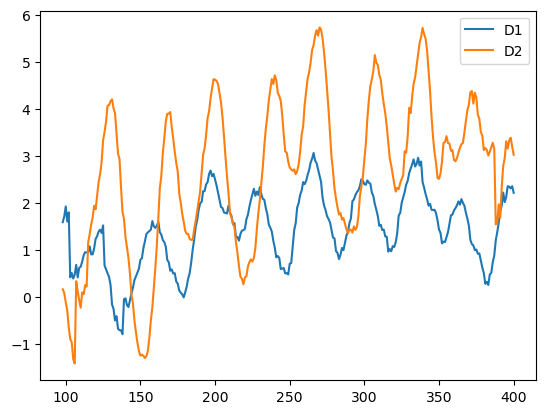

----------  0  ------------
----------  1-20-21-leona_clip2.xlsx  ------------


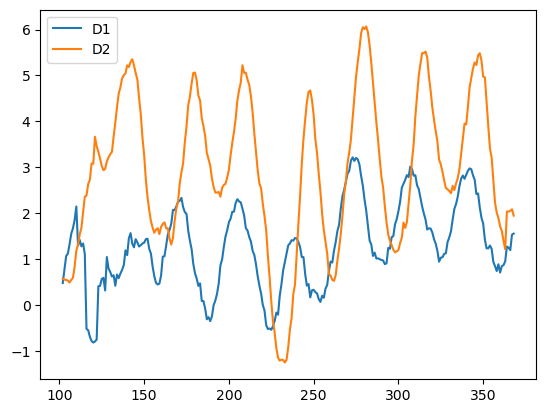

----------  0  ------------
----------  1-20-21-penelope_clip1.xlsx  ------------


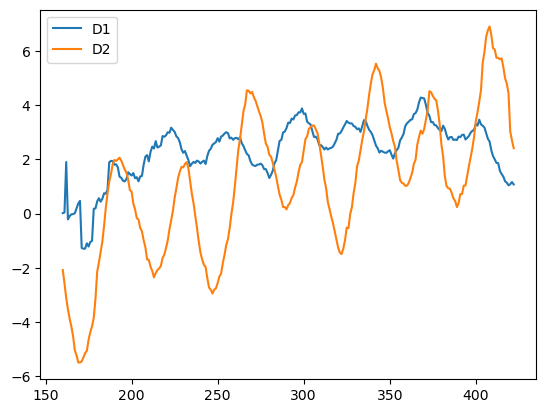

----------  0  ------------
----------  1-20-21-penelope_clip2_copy.xlsx  ------------


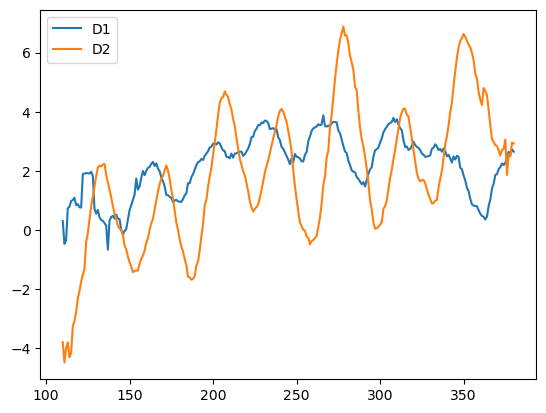

----------  0  ------------
----------  1-21-21-beyonce_clip1_copy.xlsx  ------------


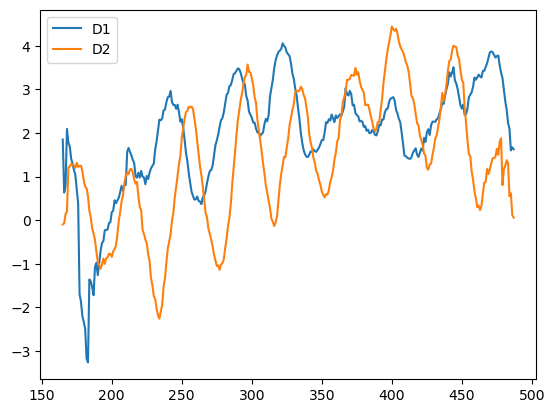

----------  0  ------------
----------  1-21-21-honey-clip2_copy.xlsx  ------------


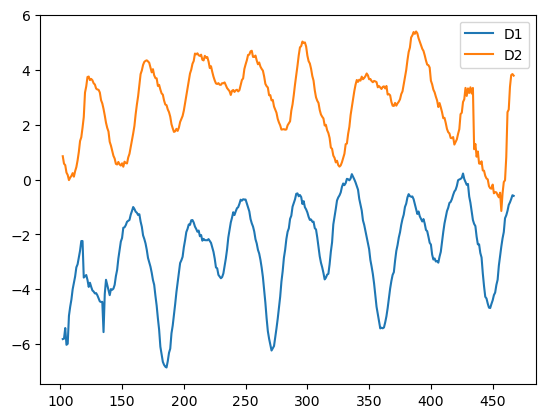

----------  0  ------------
----------  1-21-21-penelope_clip1_copy.xlsx  ------------


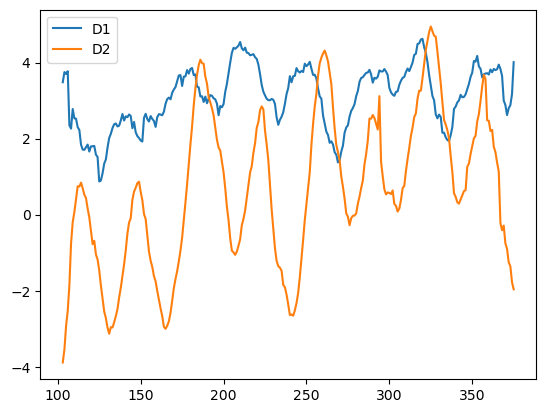

----------  0  ------------
----------  1-21-21-penelope_clip2_copy.xlsx  ------------


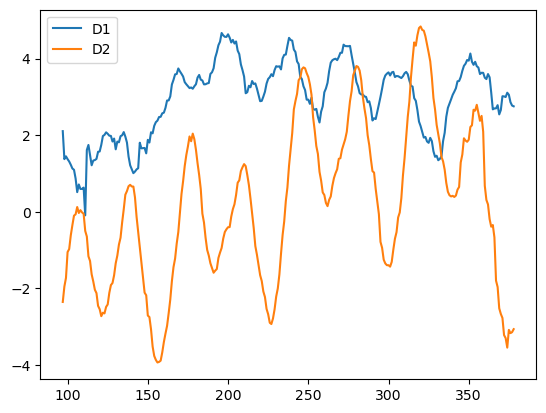

----------  0  ------------
----------  1-22-21-beyonce-clip2.xlsx  ------------


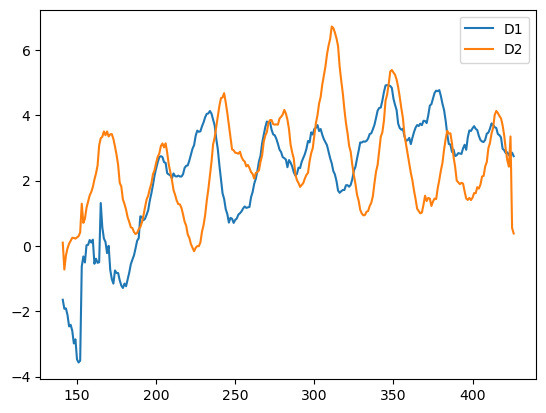

----------  0  ------------
----------  1-22-21-beyonce_clip1_copy2.xlsx  ------------


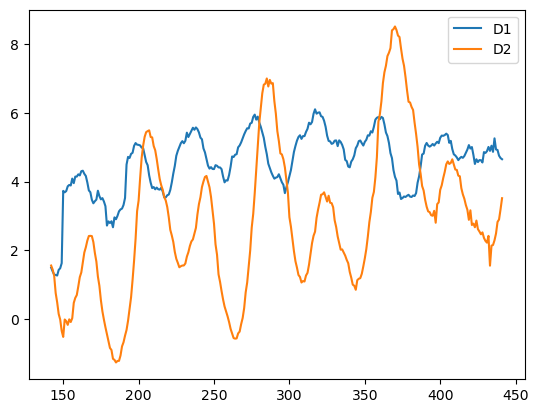

----------  0  ------------
----------  1-22-21-honey-clip1.xlsx  ------------


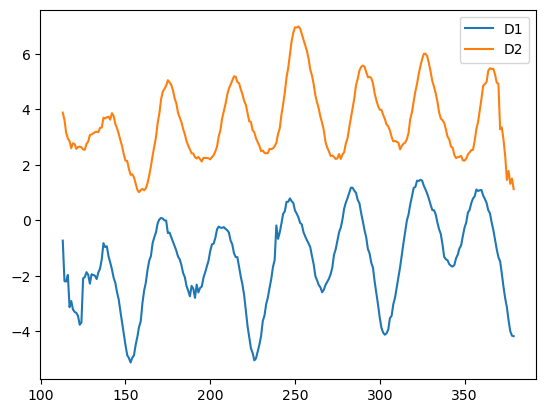

----------  0  ------------
----------  1-22-21-honey-clip2_copy.xlsx  ------------


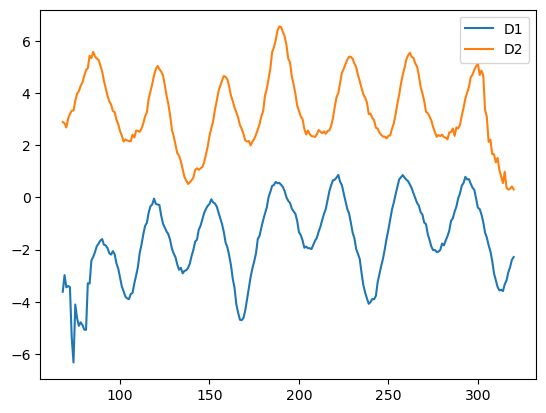

----------  0  ------------
----------  1-22-21-penelope_clip1_copy.xlsx  ------------


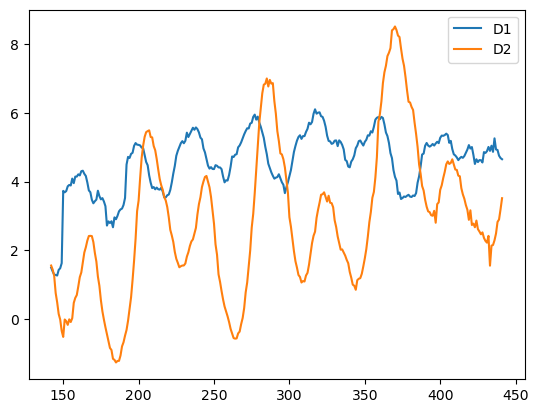

----------  0  ------------
----------  1-25-21-moonique_clip1.xlsx  ------------


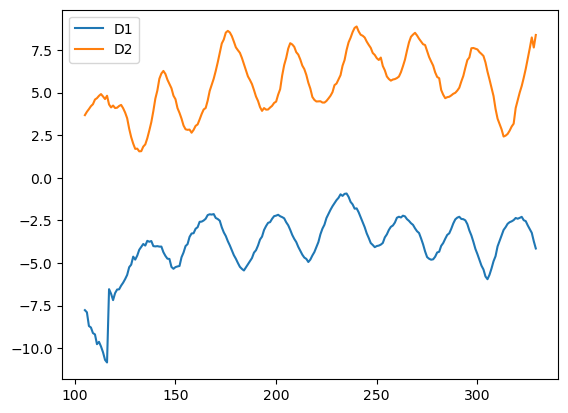

----------  0  ------------
----------  1-25-21-moonique_clip2.xlsx  ------------


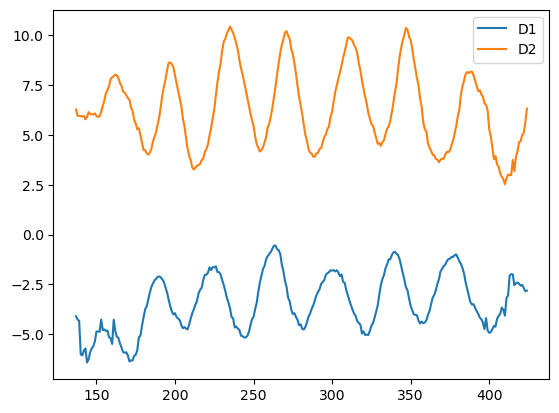

----------  0  ------------
----------  1-26-21-alice_clip1_copy.xlsx  ------------


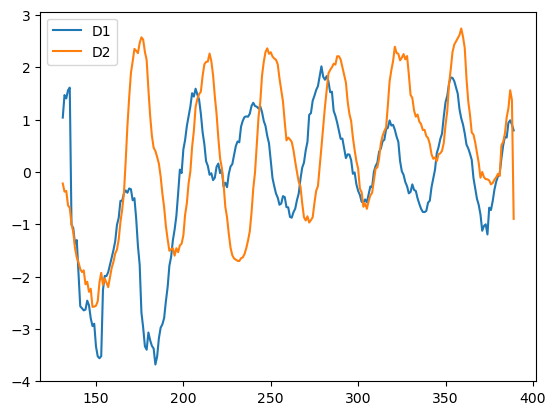

----------  0  ------------
----------  1-26-21-moonique_clip1_copy.xlsx  ------------


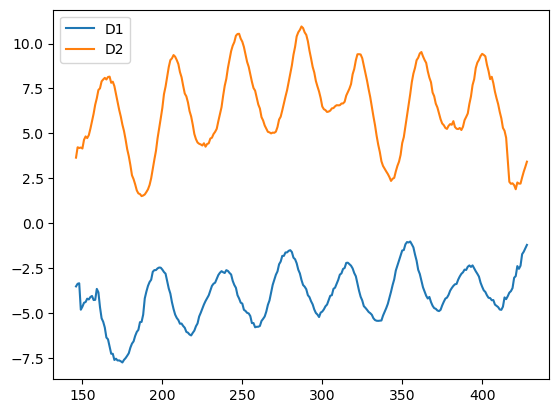

----------  0  ------------
----------  1-26-21-moonique_clip2.xlsx  ------------


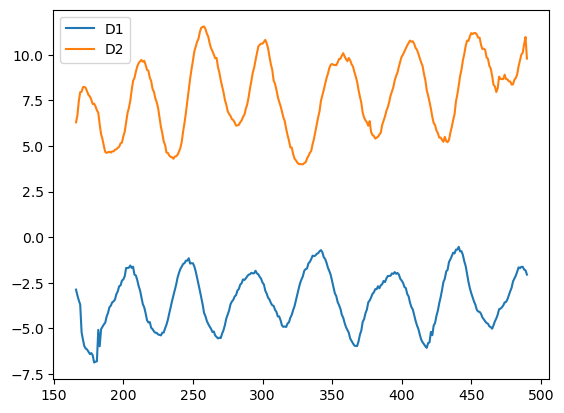

----------  0  ------------
----------  1-28-21-alice_clip1.xlsx  ------------


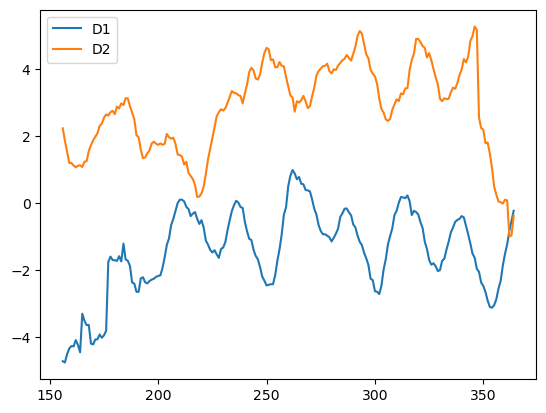

----------  0  ------------
----------  1-28-21-alice_clip2_copy.xlsx  ------------


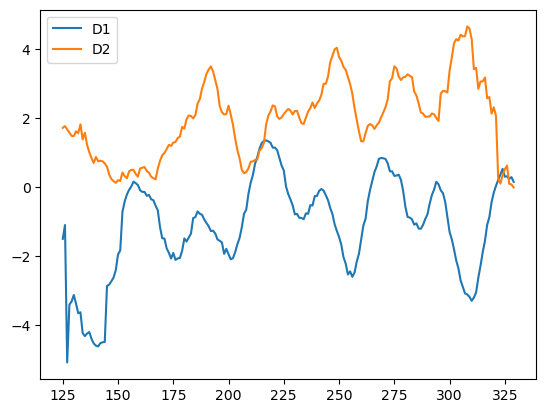

----------  0  ------------
----------  1-28-21-moonique_clip2.xlsx  ------------


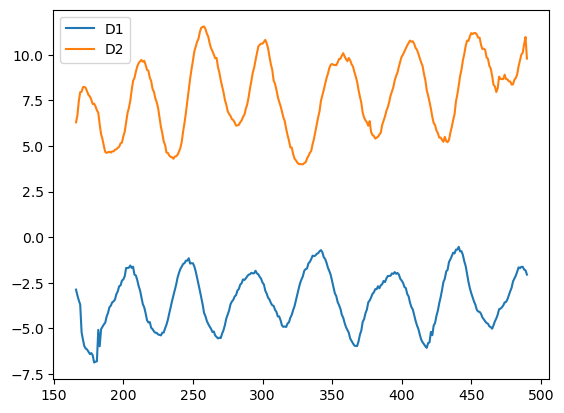

----------  1  ------------
----------  2-1-21-tweet_clip1.xlsx  ------------


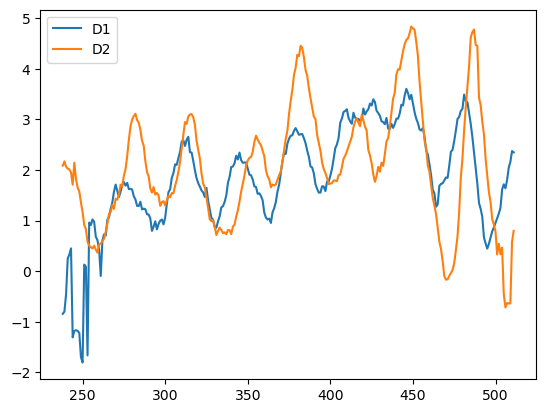

----------  0  ------------
----------  2-10-21-moolan_clip1.xlsx  ------------


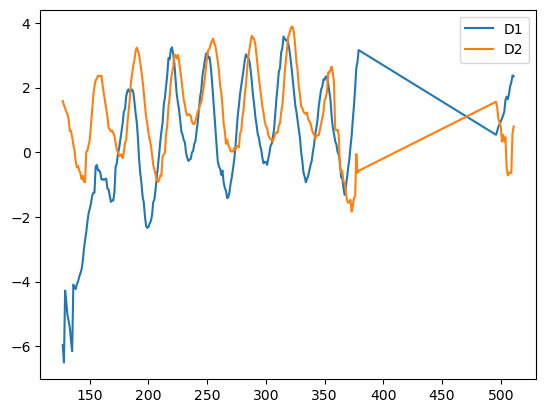

----------  0  ------------
----------  2-10-21-moolan_clip2.xlsx  ------------


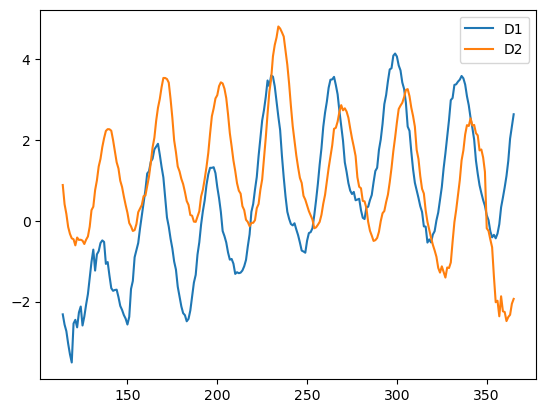

----------  0  ------------
----------  2-11-21-loza_clip1.xlsx  ------------


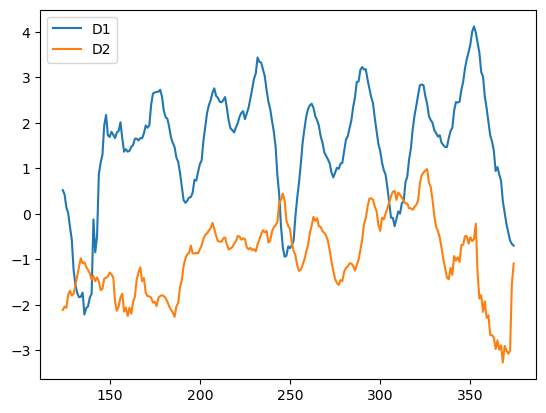

----------  0  ------------
----------  2-11-21-moon_clip1.xlsx  ------------


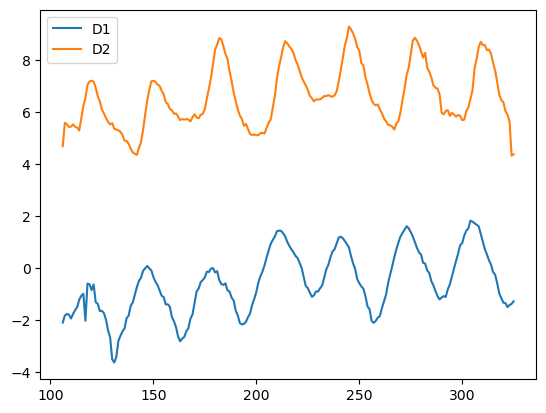

----------  1  ------------
----------  2-11-21-robin_clip1.xlsx  ------------


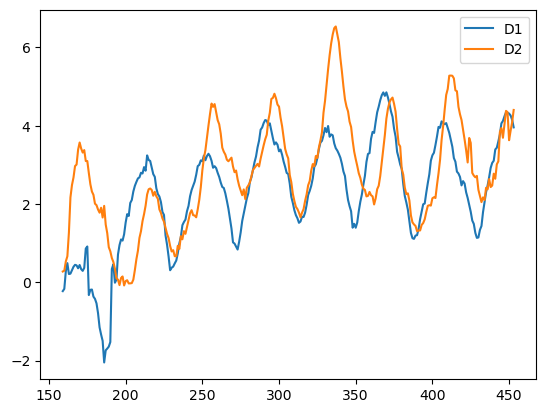

----------  0  ------------
----------  2-11-21-tweet_clip1.xlsx  ------------


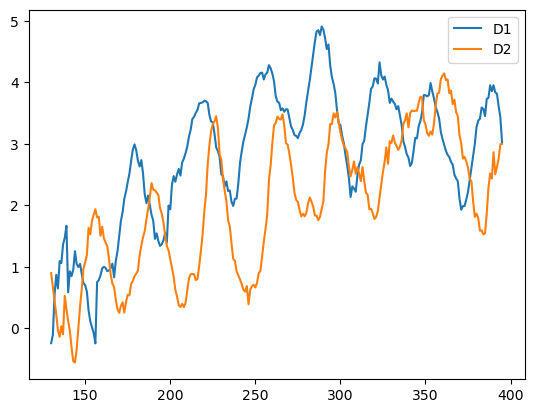

----------  0  ------------
----------  2-12-21-leona_clip1.xlsx  ------------


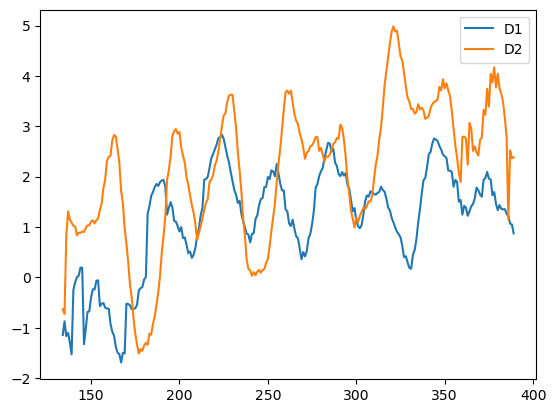

----------  0  ------------
----------  2-12-21-leona_clip2.xlsx  ------------


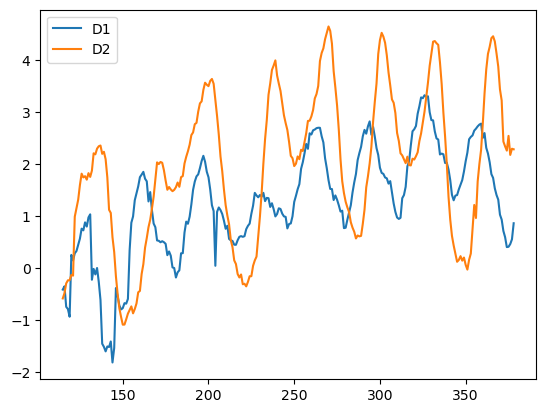

----------  0  ------------
----------  2-12-21-leona_clip3.xlsx  ------------


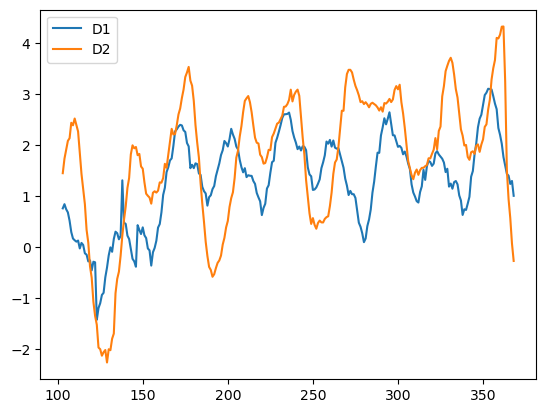

----------  0  ------------
----------  2-12-21-moon_clip1.xlsx  ------------


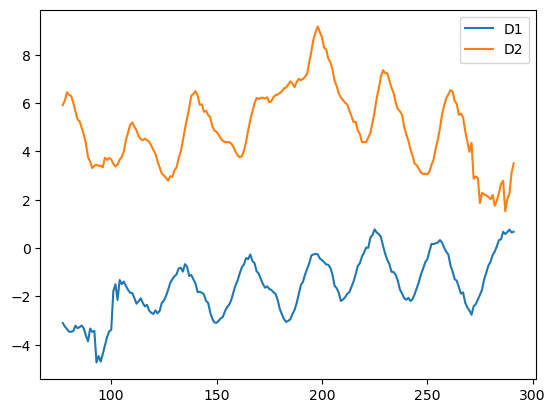

----------  1  ------------
----------  2-12-21-robin_clip1.xlsx  ------------


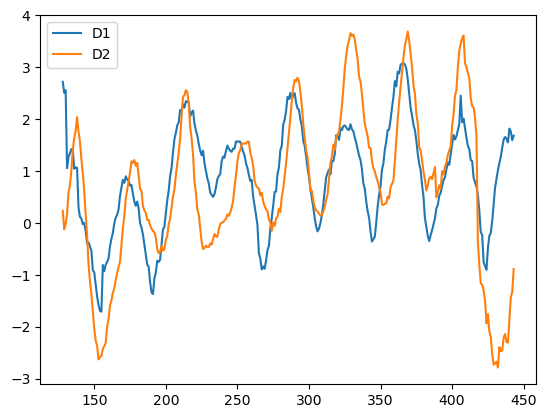

----------  0  ------------
----------  2-12-21-robin_clip2.xlsx  ------------


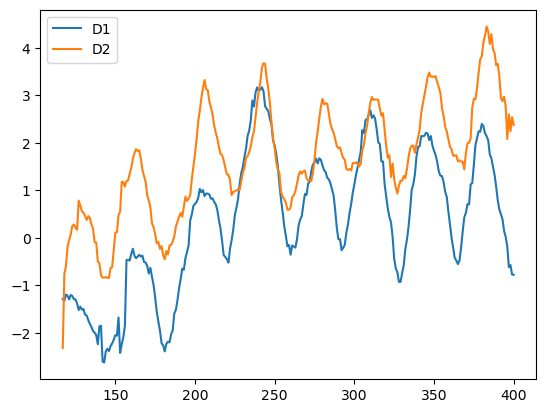

----------  0  ------------
----------  2-12-21-robin_clip3.xlsx  ------------


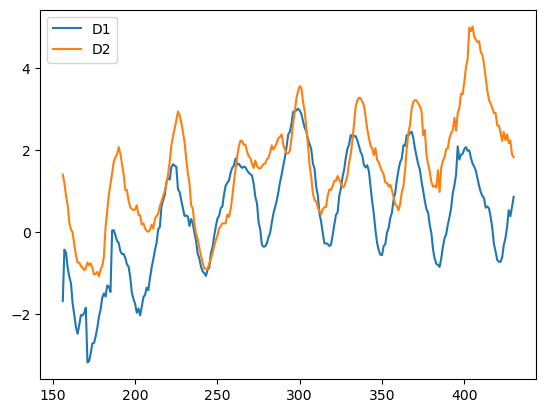

----------  1  ------------
----------  2-12-21-tweet_clip1.xlsx  ------------


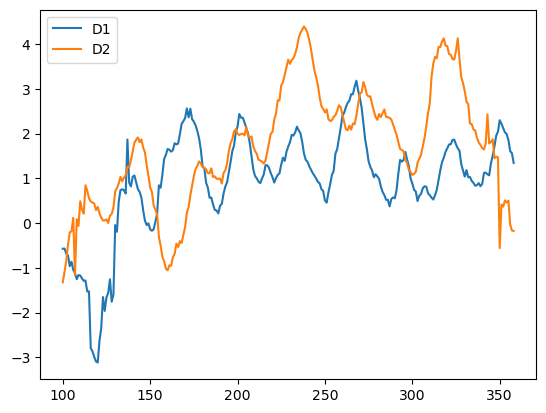

----------  0  ------------
----------  2-2-21-loza_clip1.xlsx  ------------


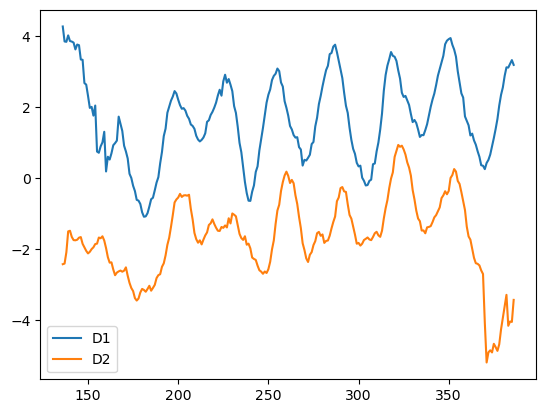

----------  0  ------------
----------  2-2-21-loza_clip2.xlsx  ------------


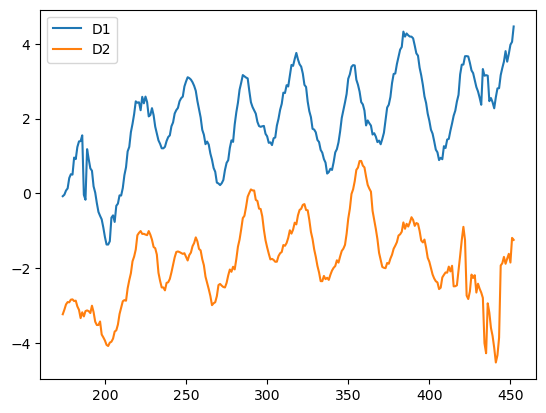

----------  0  ------------
----------  2-2-21-loza_clip3.xlsx  ------------


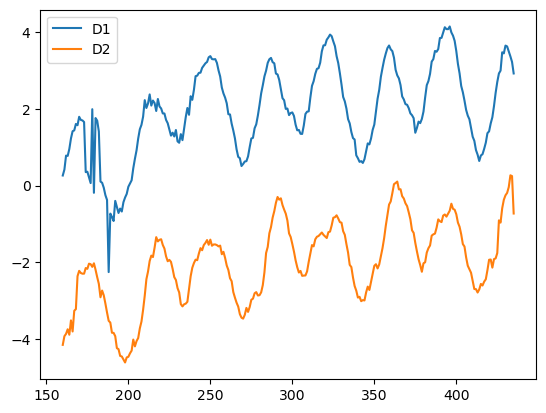

----------  0  ------------
----------  2-2-21-tweet_clip1.xlsx  ------------


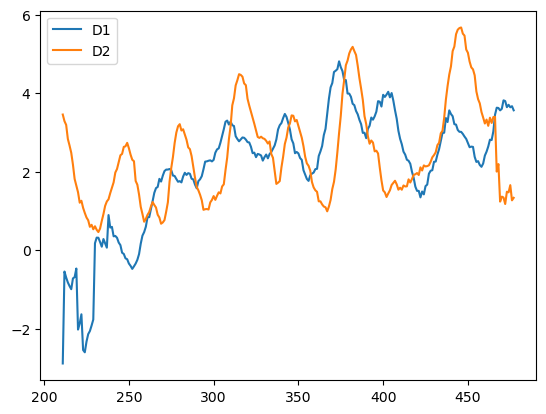

----------  0  ------------
----------  2-2-21-tweet_clip2.xlsx  ------------


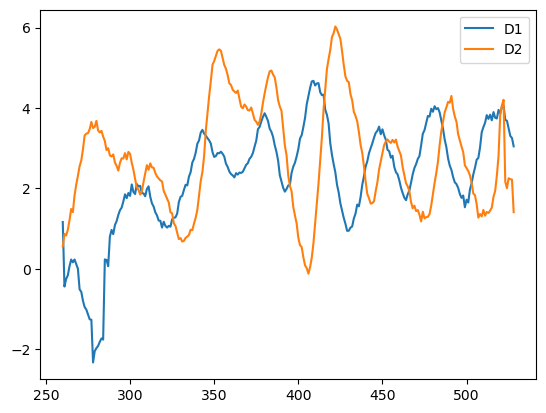

----------  0  ------------
----------  2-3-21-loza_clip1.xlsx  ------------


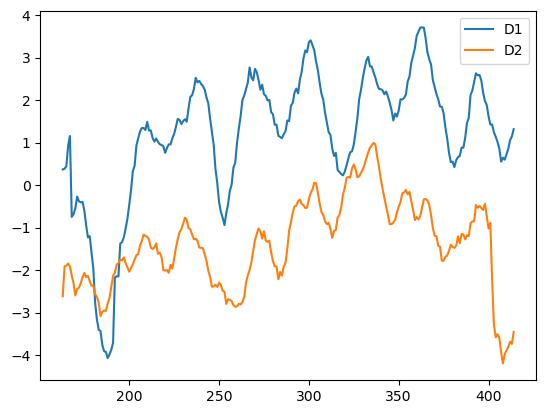

----------  0  ------------
----------  2-3-21-loza_clip3.xlsx  ------------


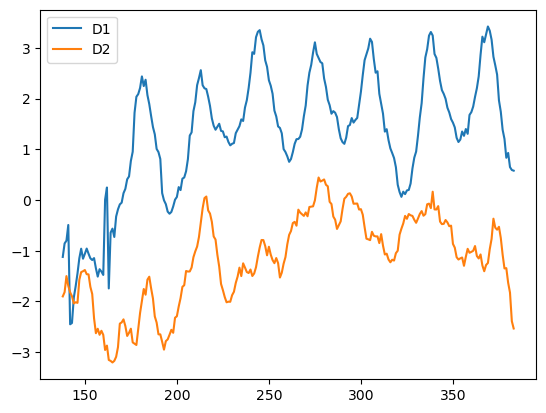

----------  0  ------------
----------  2-3-21-moon_clip1.xlsx  ------------


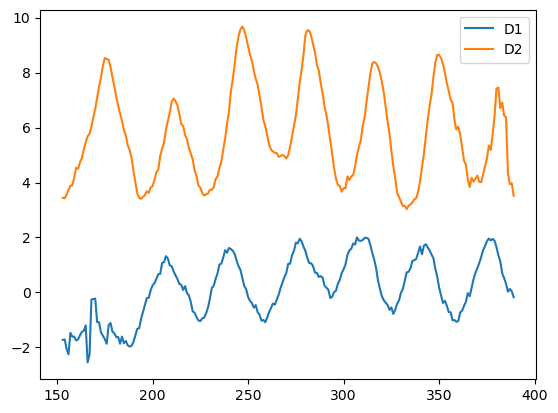

----------  0  ------------
----------  2-3-21-moon_clip2.xlsx  ------------


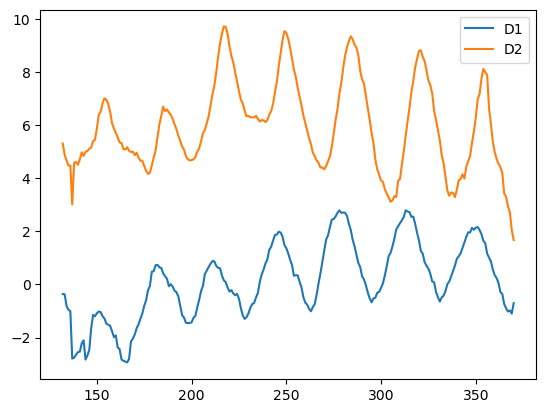

----------  0  ------------
----------  2-4-21-loza_clip1.xlsx  ------------


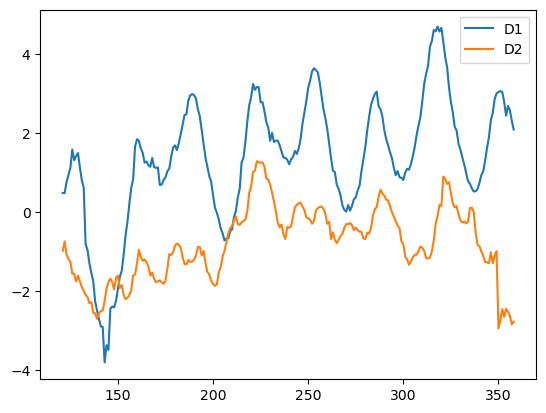

----------  0  ------------
----------  2-4-21-loza_clip2.xlsx  ------------


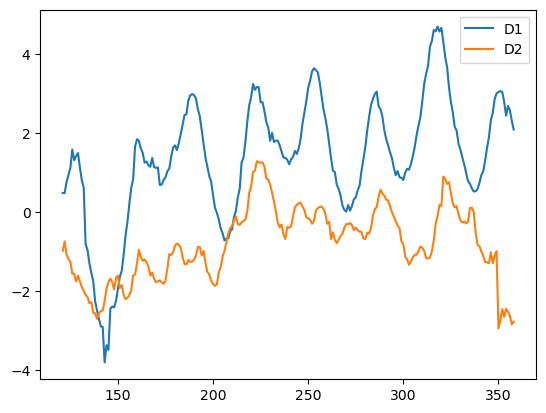

----------  0  ------------
----------  2-5-21-PtitNugget_clip1.xlsx  ------------


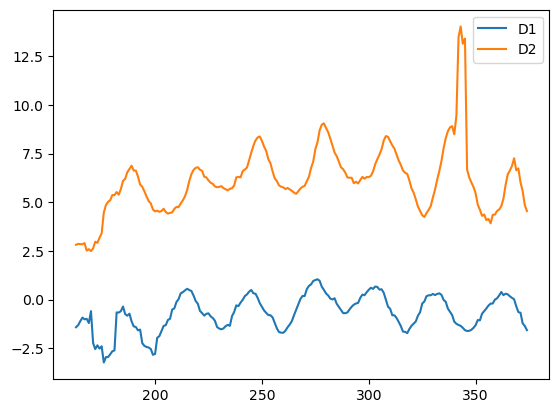

----------  0  ------------
----------  2-5-21-moon_clip1.xlsx  ------------


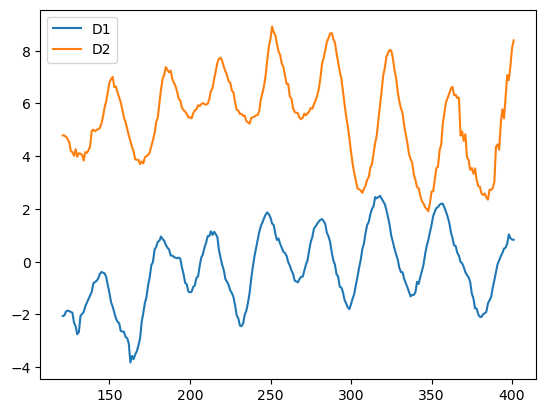

----------  0  ------------
----------  2-5-21-moon_clip2.xlsx  ------------


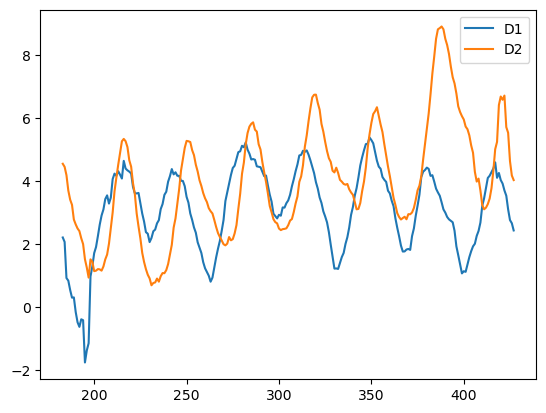

----------  1  ------------
----------  2-5-21-tweet_clip1.xlsx  ------------


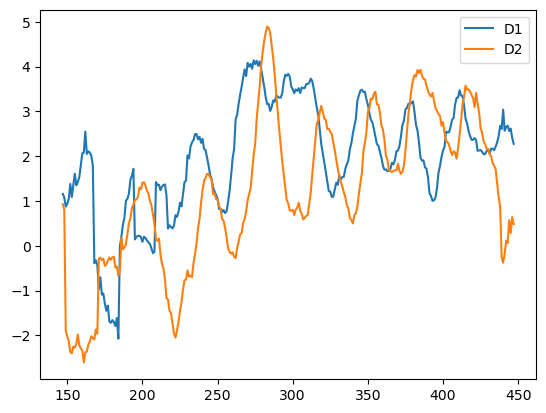

----------  1  ------------
----------  2-5-21-tweet_clip2.xlsx  ------------


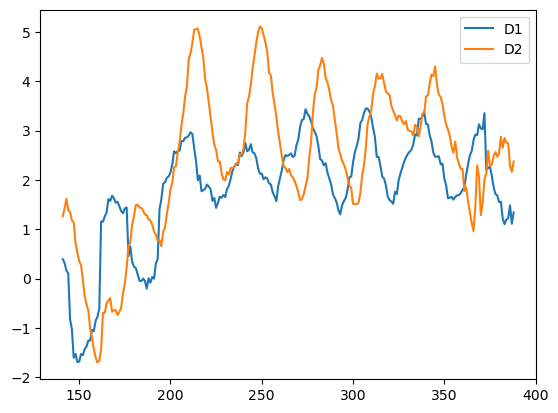

----------  0  ------------
----------  2-8-21-moon_clip1.xlsx  ------------


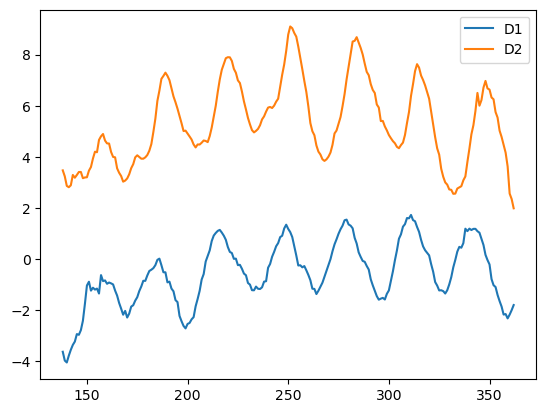

----------  0  ------------
----------  2-8-21-moon_clip2.xlsx  ------------


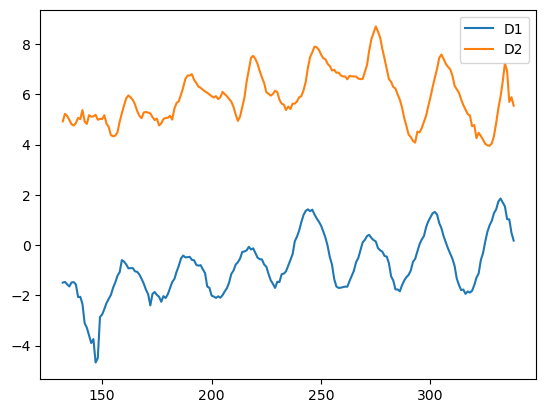

----------  0  ------------
----------  2-8-21-moon_clip3.xlsx  ------------


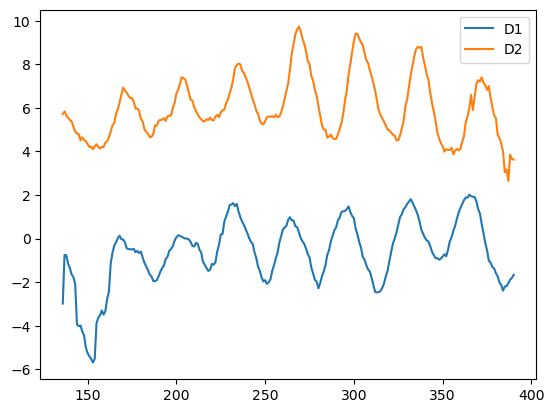

----------  0  ------------
----------  2-8-21-ptitnugget_clip2.xlsx  ------------


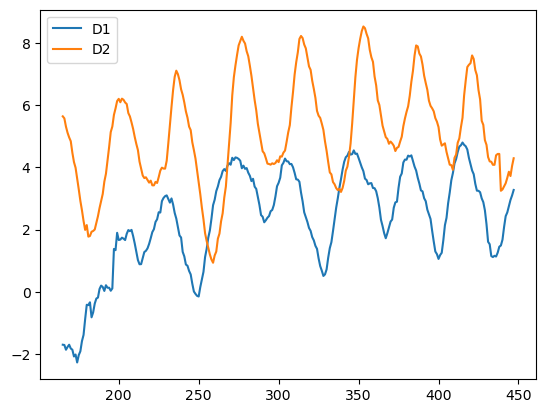

----------  0  ------------
----------  2-9-21-PtitNugget-clip1_manual.xlsx  ------------


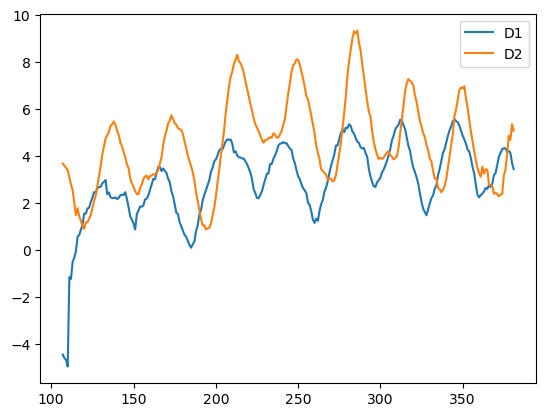

----------  0  ------------
----------  2-9-21-PtitNugget-clip2_manual.xlsx  ------------


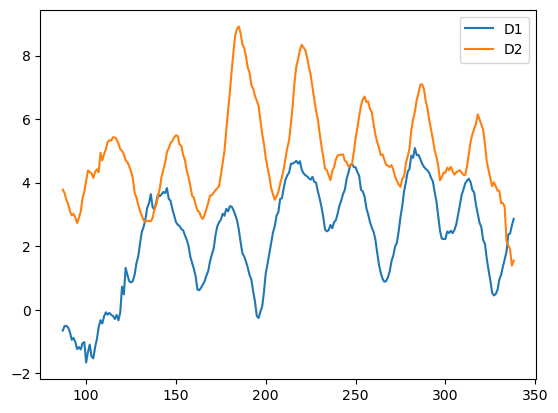

----------  0  ------------
----------  2-9-21-PtitNugget-clip3_manual.xlsx  ------------


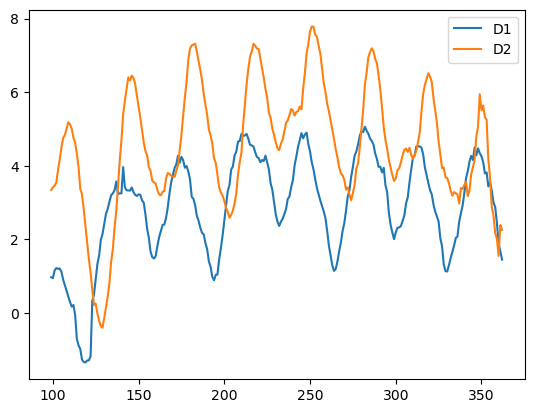

----------  0  ------------
----------  2-9-21-Robin-clip1_manual.xlsx  ------------


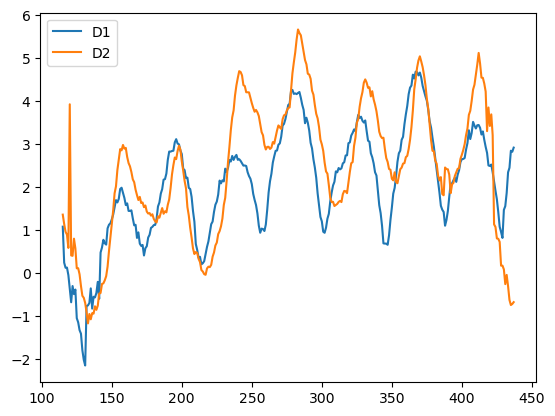

----------  0  ------------
----------  2-9-21-Robin-clip2_manual.xlsx  ------------


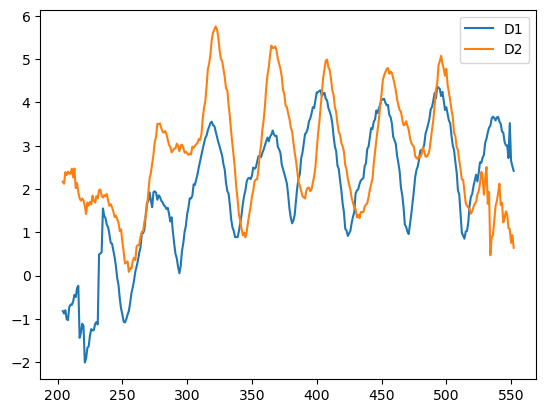

----------  0  ------------
----------  2-9-21-Robin-clip3_manual.xlsx  ------------


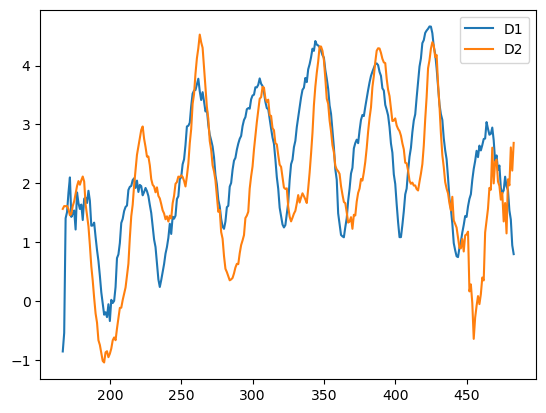

In [116]:
for i in range(len(ls_pds)):
    print("---------- ", binary_ls[i], " ------------")
    print("---------- ", files_xlsx[i], " ------------")
    """using func: plot_d"""
    plot_d(ls_pds[i], binary_ls[i], only_pos=False)

### Plot the same cow together

In [121]:

temp = ['leona', 'honey', 'beyonce', 'penelope', 'moonique', 'alice', 'tweet', 'moolan', 'loza', 'moon', 'robin', 'leona', 'ptitnugget']

----------  0  ------------
----------  1-18-21-leona-clip1.xlsx  ------------


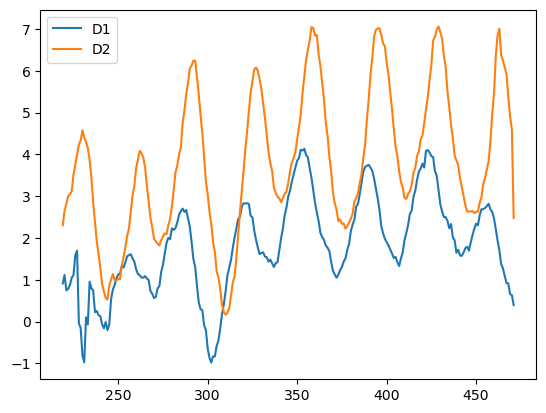

----------  0  ------------
----------  1-18-21-leona-clip2_copy.xlsx  ------------


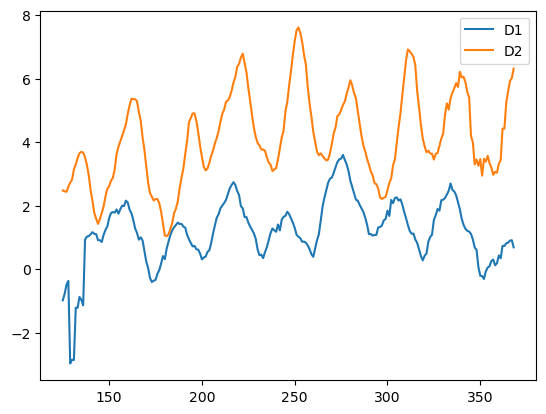

----------  0  ------------
----------  1-19-21-leona_clip1.xlsx  ------------


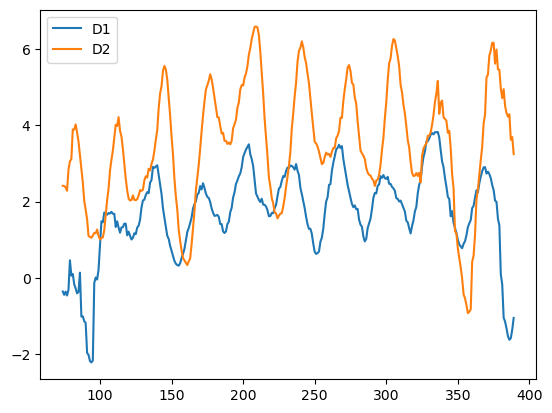

----------  0  ------------
----------  1-19-21-leona_clip2_copy.xlsx  ------------


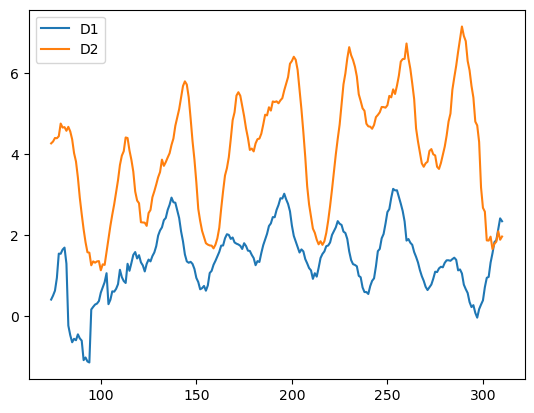

----------  0  ------------
----------  1-20-21-leona_clip1.xlsx  ------------


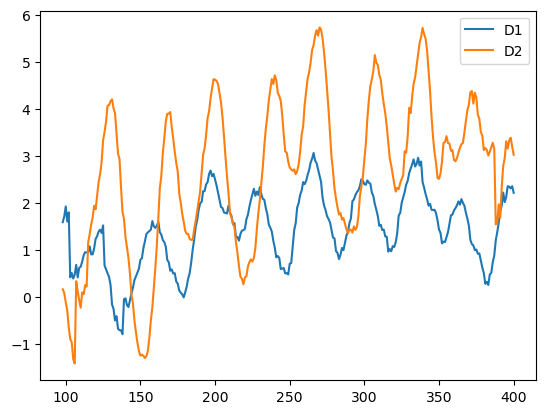

----------  0  ------------
----------  1-20-21-leona_clip2.xlsx  ------------


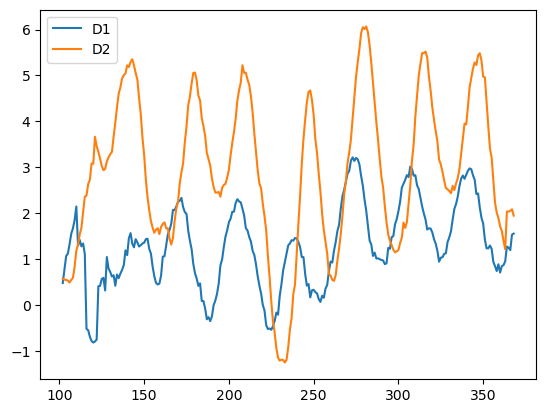

----------  0  ------------
----------  2-12-21-leona_clip1.xlsx  ------------


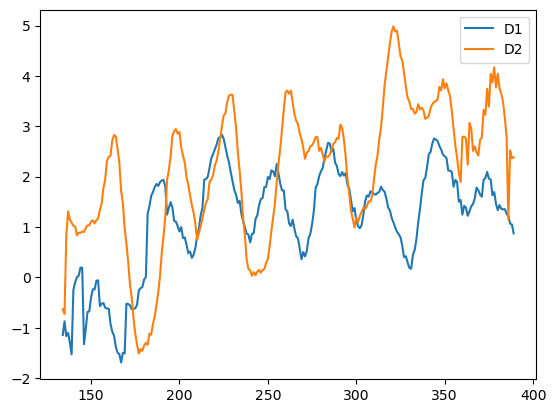

----------  0  ------------
----------  2-12-21-leona_clip2.xlsx  ------------


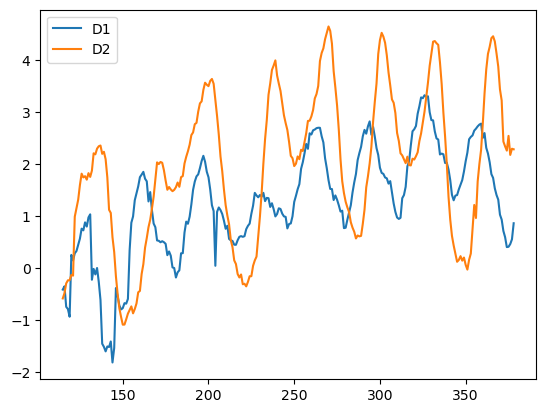

----------  0  ------------
----------  2-12-21-leona_clip3.xlsx  ------------


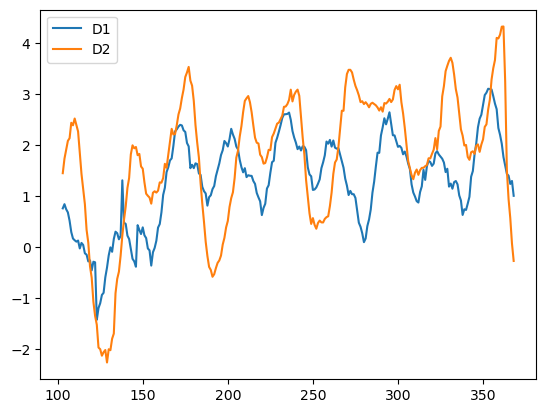

----------  0  ------------
----------  1-19-21-honey-clip1.xlsx  ------------


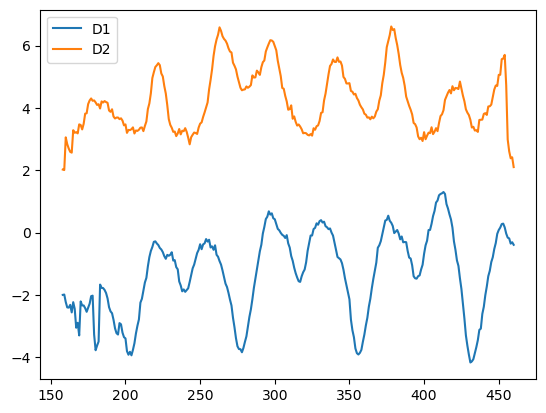

----------  0  ------------
----------  1-20-21-honey-clip1.xlsx  ------------


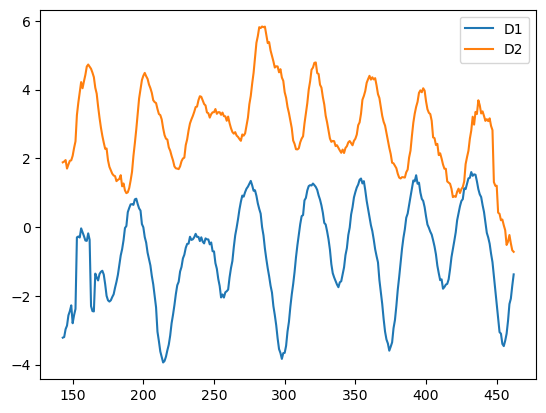

----------  0  ------------
----------  1-21-21-honey-clip2_copy.xlsx  ------------


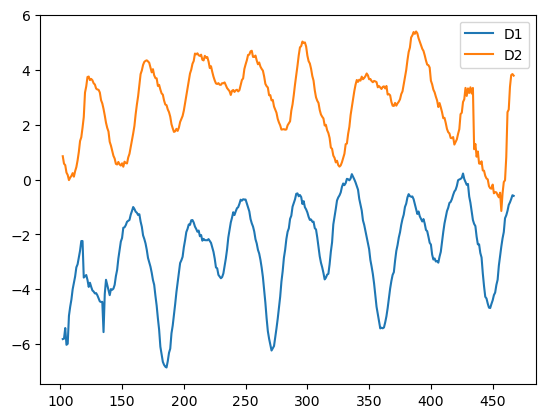

----------  0  ------------
----------  1-22-21-honey-clip1.xlsx  ------------


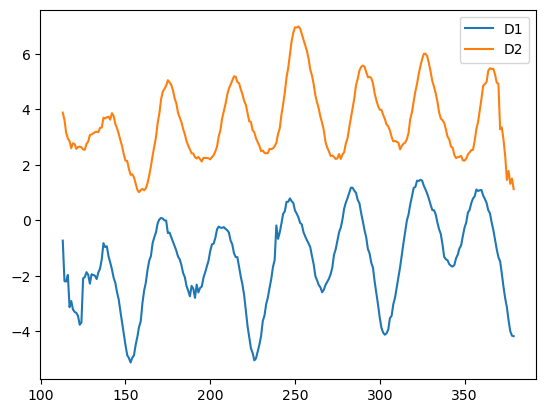

----------  0  ------------
----------  1-22-21-honey-clip2_copy.xlsx  ------------


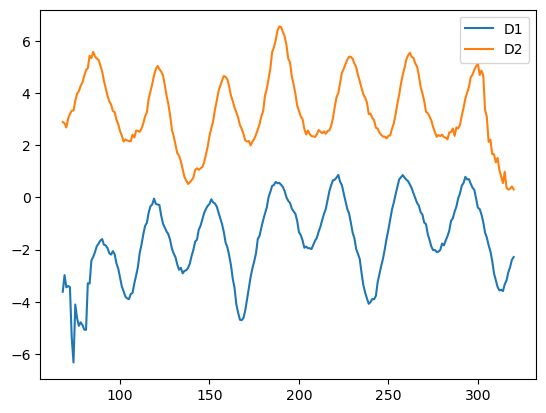

----------  0  ------------
----------  1-20-21-beyonce-clip1.xlsx  ------------


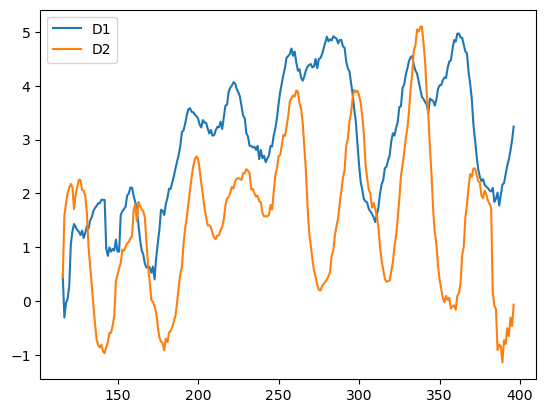

----------  0  ------------
----------  1-21-21-beyonce_clip1_copy.xlsx  ------------


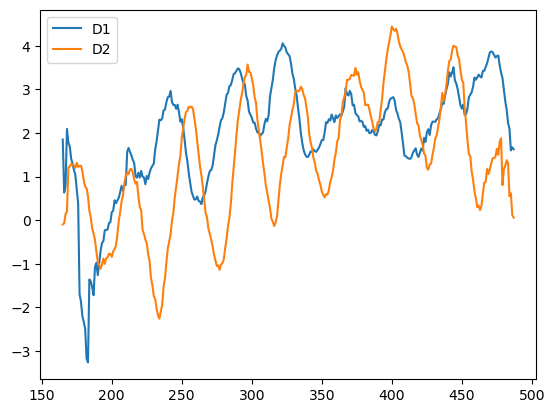

----------  0  ------------
----------  1-22-21-beyonce-clip2.xlsx  ------------


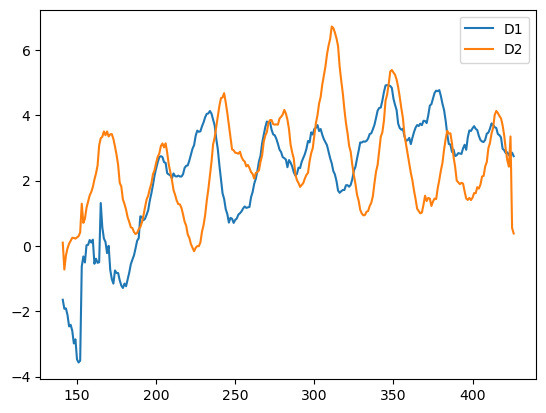

----------  0  ------------
----------  1-22-21-beyonce_clip1_copy2.xlsx  ------------


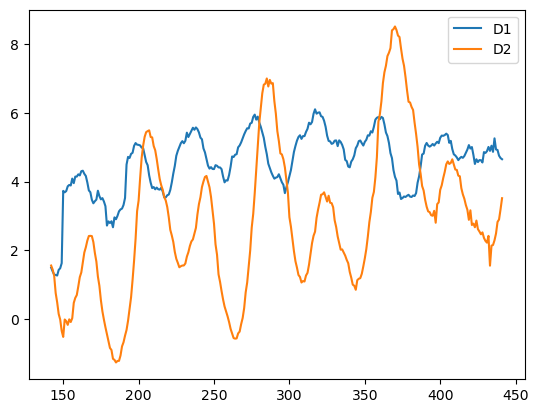

----------  0  ------------
----------  1-20-21-penelope_clip1.xlsx  ------------


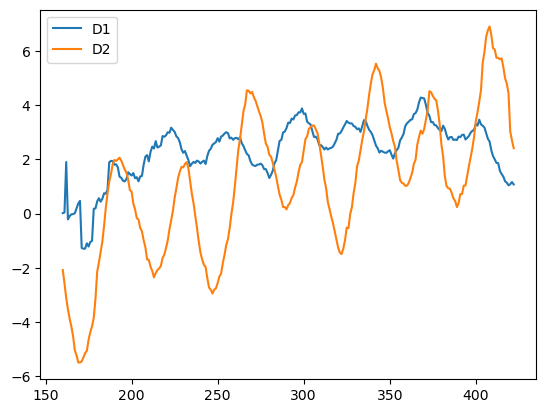

----------  0  ------------
----------  1-20-21-penelope_clip2_copy.xlsx  ------------


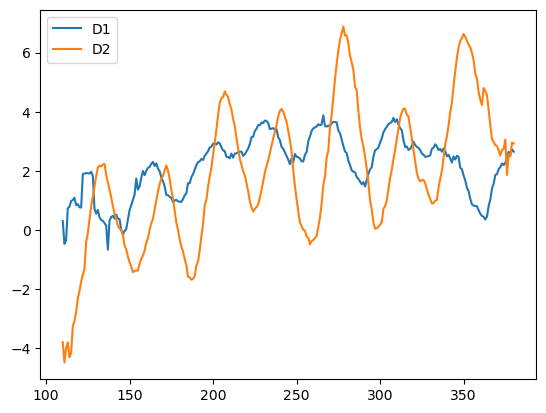

----------  0  ------------
----------  1-21-21-penelope_clip1_copy.xlsx  ------------


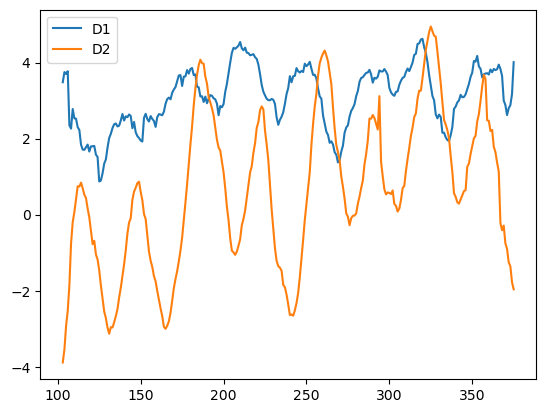

----------  0  ------------
----------  1-21-21-penelope_clip2_copy.xlsx  ------------


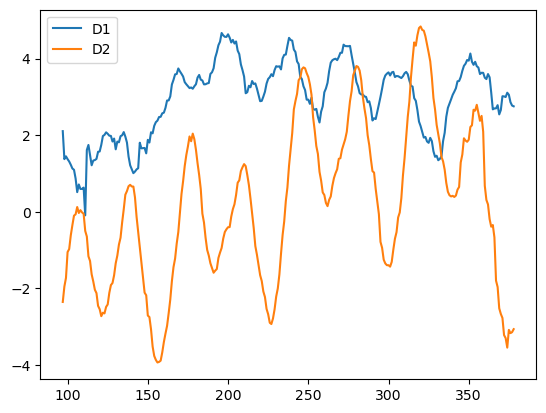

----------  0  ------------
----------  1-22-21-penelope_clip1_copy.xlsx  ------------


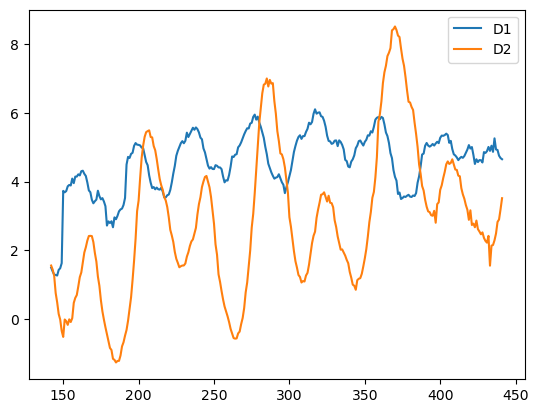

----------  0  ------------
----------  1-25-21-moonique_clip1.xlsx  ------------


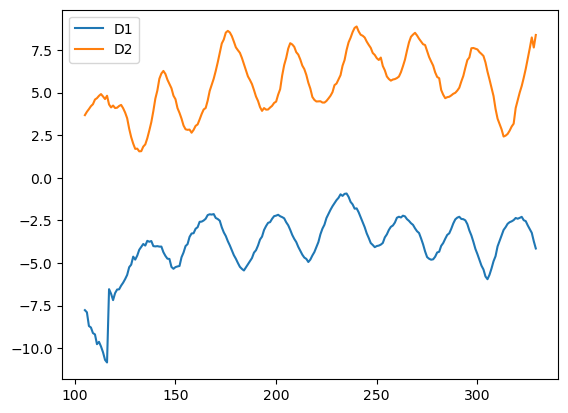

----------  0  ------------
----------  1-25-21-moonique_clip2.xlsx  ------------


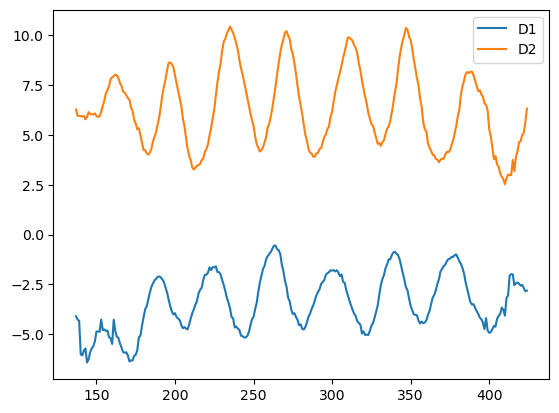

----------  0  ------------
----------  1-26-21-moonique_clip1_copy.xlsx  ------------


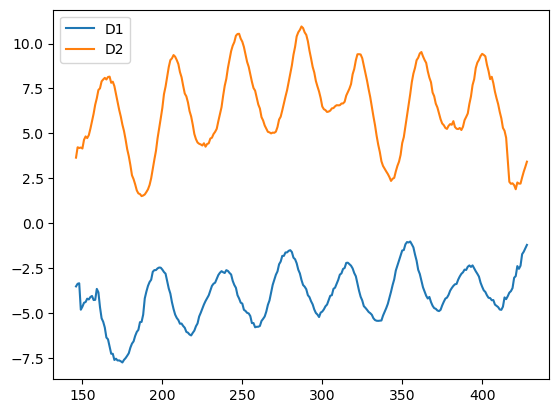

----------  0  ------------
----------  1-26-21-moonique_clip2.xlsx  ------------


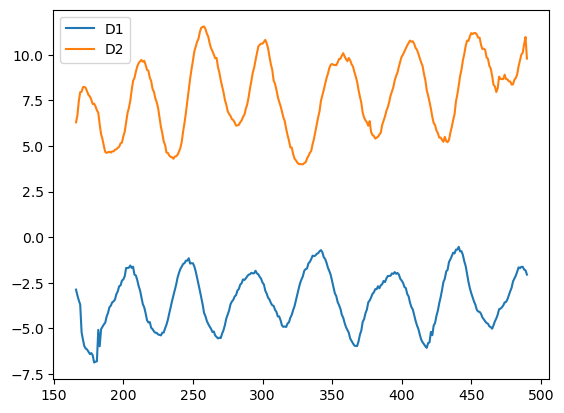

----------  0  ------------
----------  1-28-21-moonique_clip2.xlsx  ------------


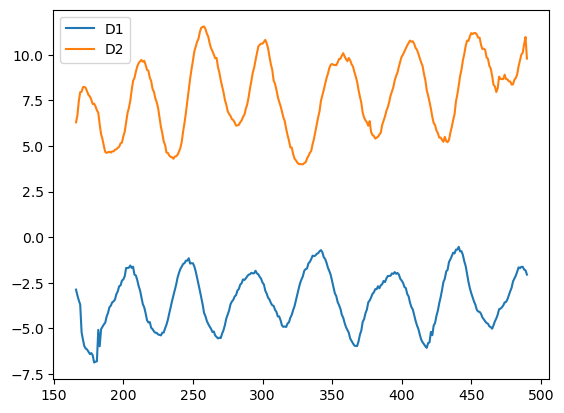

----------  0  ------------
----------  1-26-21-alice_clip1_copy.xlsx  ------------


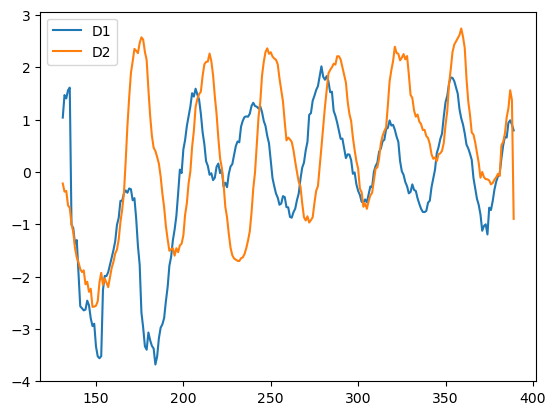

----------  0  ------------
----------  1-28-21-alice_clip1.xlsx  ------------


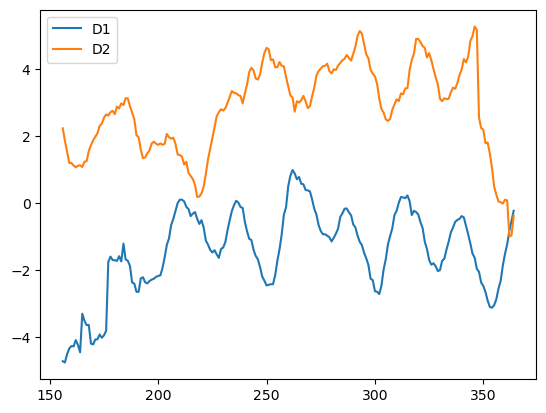

----------  0  ------------
----------  1-28-21-alice_clip2_copy.xlsx  ------------


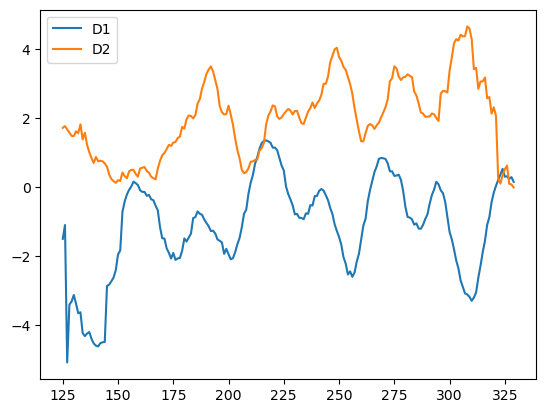

----------  1  ------------
----------  2-1-21-tweet_clip1.xlsx  ------------


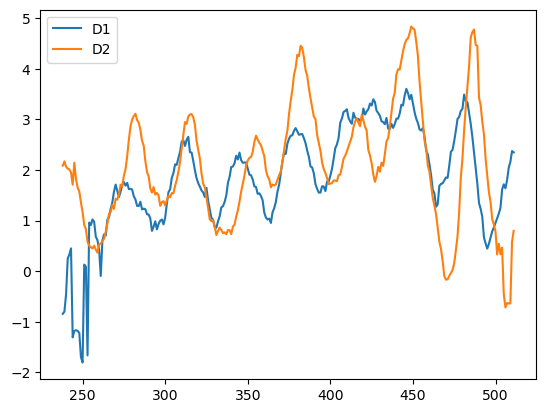

----------  0  ------------
----------  2-11-21-tweet_clip1.xlsx  ------------


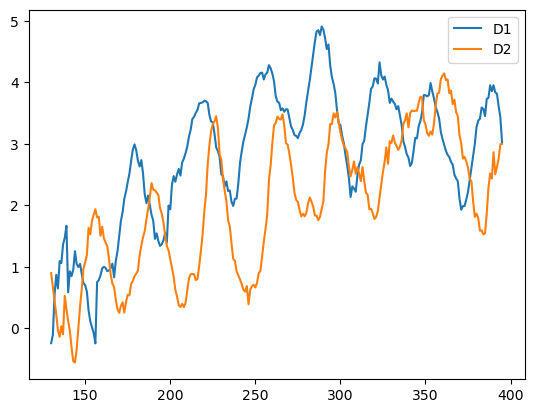

----------  1  ------------
----------  2-12-21-tweet_clip1.xlsx  ------------


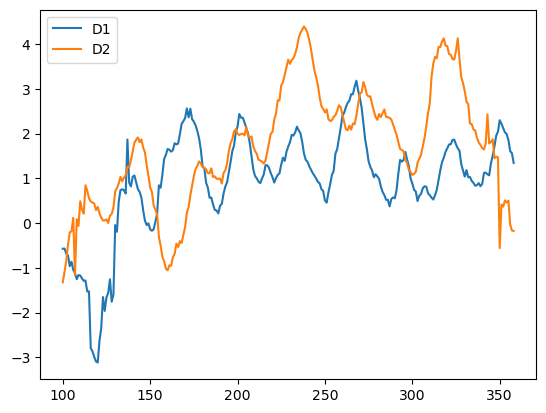

----------  0  ------------
----------  2-2-21-tweet_clip1.xlsx  ------------


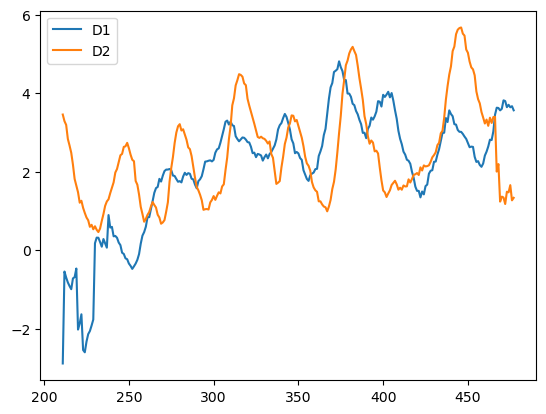

----------  0  ------------
----------  2-2-21-tweet_clip2.xlsx  ------------


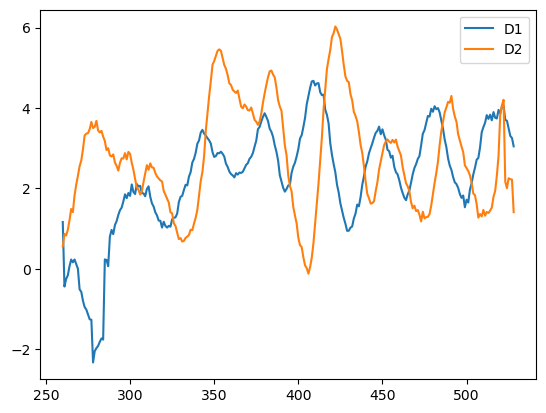

----------  1  ------------
----------  2-5-21-tweet_clip1.xlsx  ------------


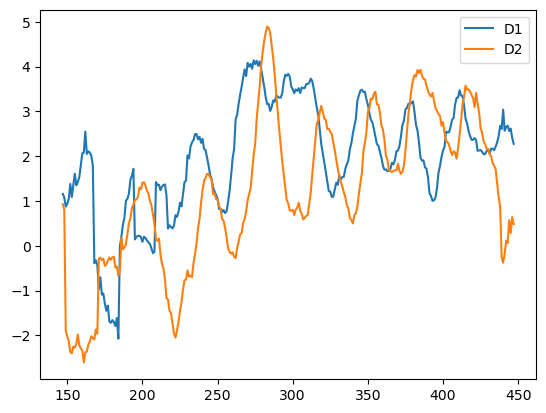

----------  1  ------------
----------  2-5-21-tweet_clip2.xlsx  ------------


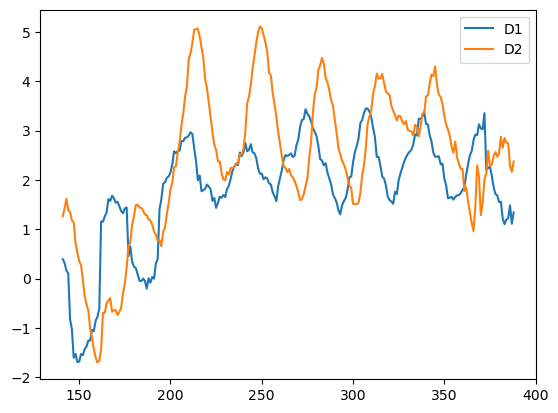

----------  0  ------------
----------  2-10-21-moolan_clip1.xlsx  ------------


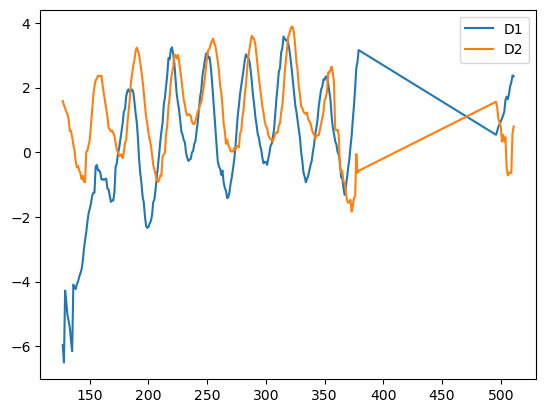

----------  0  ------------
----------  2-10-21-moolan_clip2.xlsx  ------------


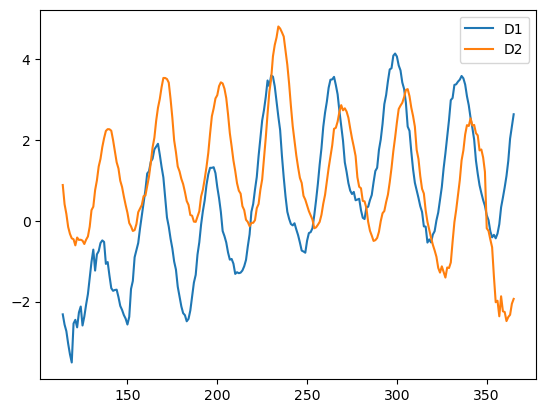

----------  0  ------------
----------  2-11-21-loza_clip1.xlsx  ------------


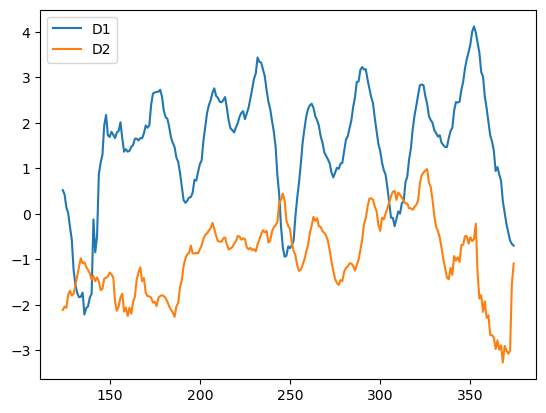

----------  0  ------------
----------  2-2-21-loza_clip1.xlsx  ------------


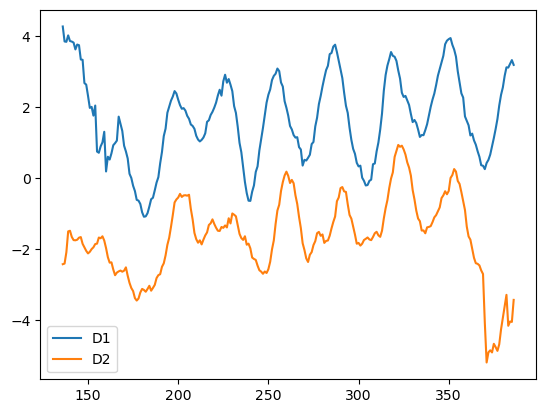

----------  0  ------------
----------  2-2-21-loza_clip2.xlsx  ------------


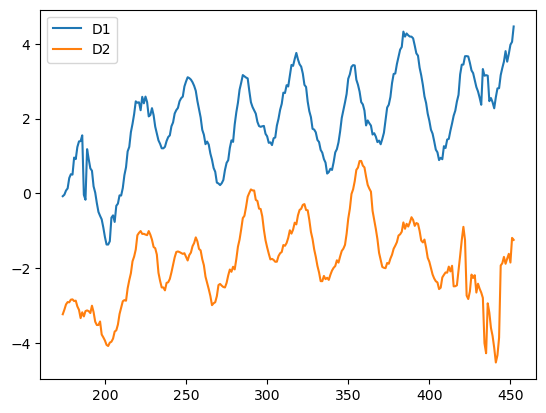

----------  0  ------------
----------  2-2-21-loza_clip3.xlsx  ------------


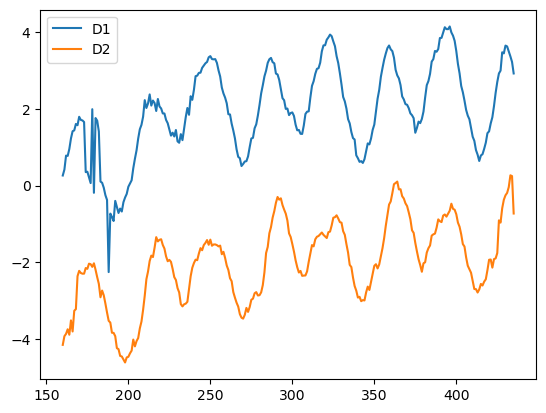

----------  0  ------------
----------  2-3-21-loza_clip1.xlsx  ------------


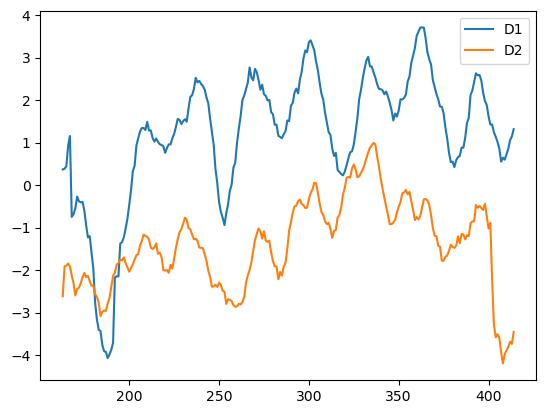

----------  0  ------------
----------  2-3-21-loza_clip3.xlsx  ------------


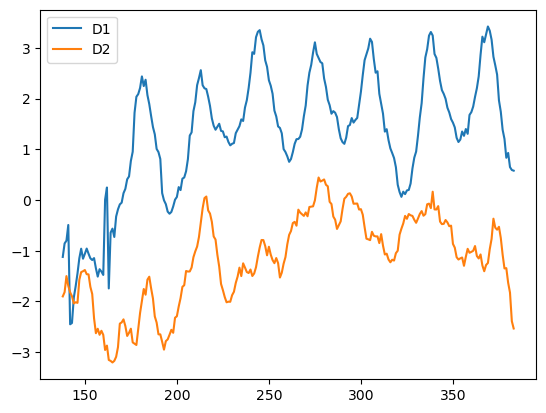

----------  0  ------------
----------  2-4-21-loza_clip1.xlsx  ------------


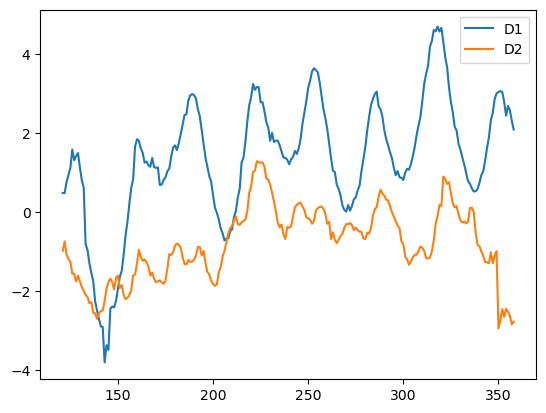

----------  0  ------------
----------  2-4-21-loza_clip2.xlsx  ------------


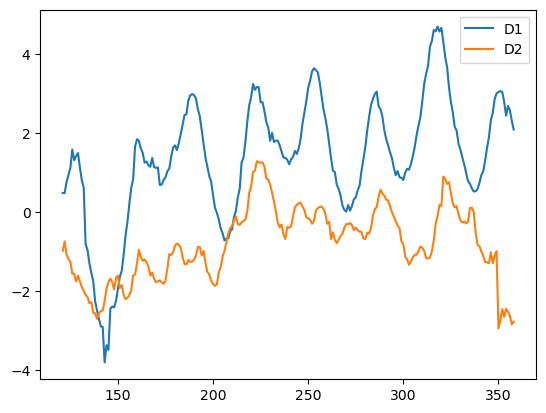

----------  0  ------------
----------  1-25-21-moonique_clip1.xlsx  ------------


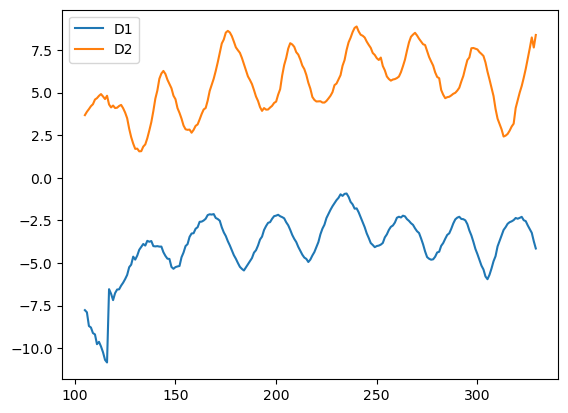

----------  0  ------------
----------  1-25-21-moonique_clip2.xlsx  ------------


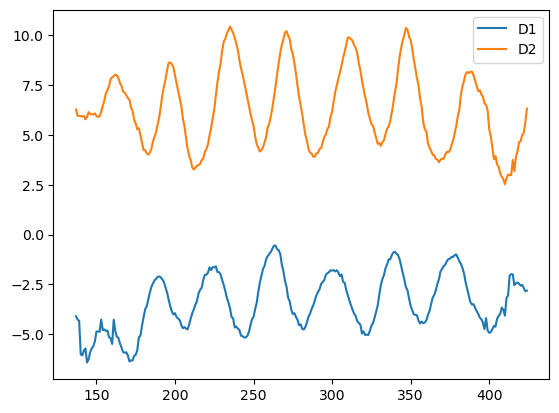

----------  0  ------------
----------  1-26-21-moonique_clip1_copy.xlsx  ------------


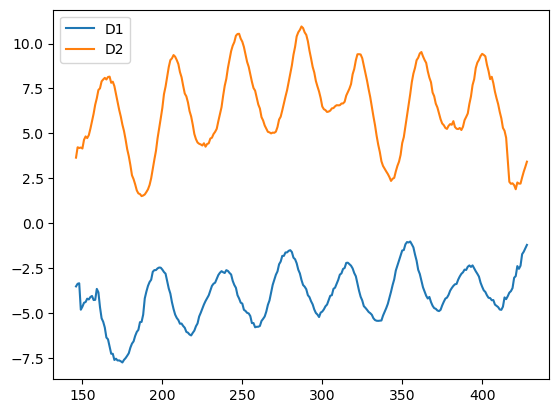

----------  0  ------------
----------  1-26-21-moonique_clip2.xlsx  ------------


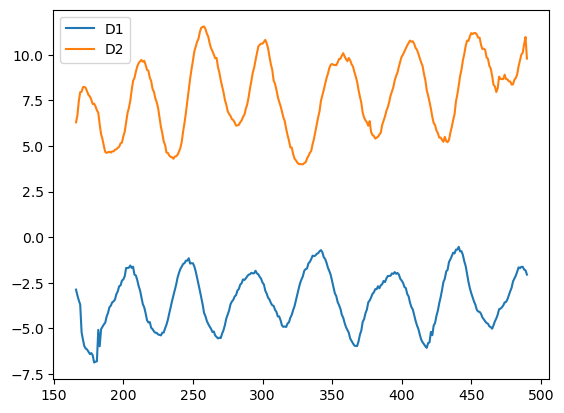

----------  0  ------------
----------  1-28-21-moonique_clip2.xlsx  ------------


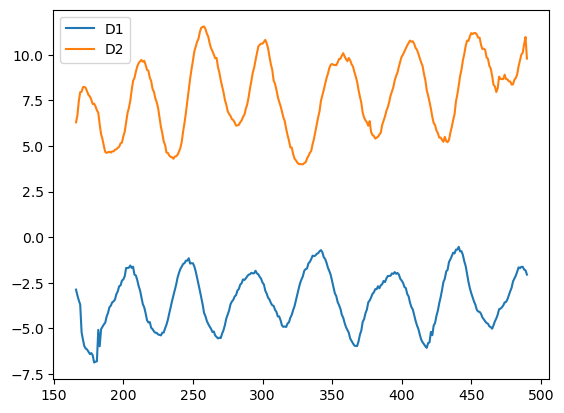

----------  0  ------------
----------  2-11-21-moon_clip1.xlsx  ------------


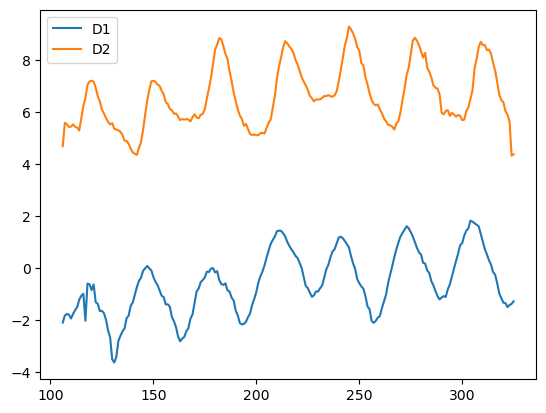

----------  0  ------------
----------  2-12-21-moon_clip1.xlsx  ------------


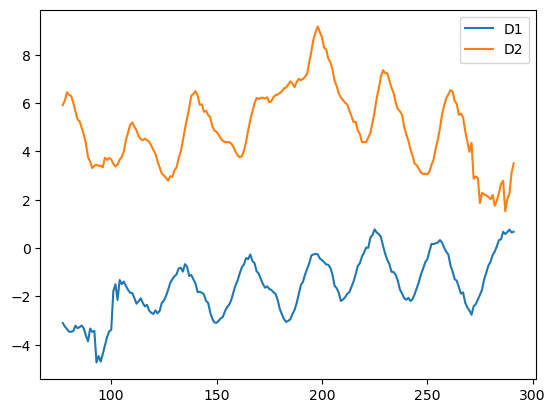

----------  0  ------------
----------  2-3-21-moon_clip1.xlsx  ------------


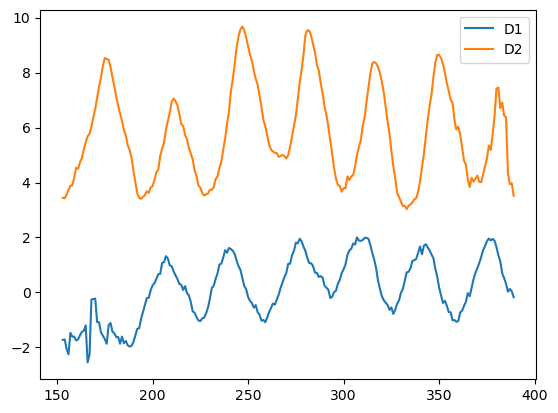

----------  0  ------------
----------  2-3-21-moon_clip2.xlsx  ------------


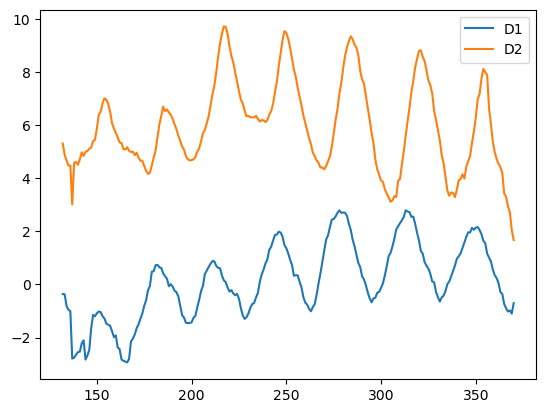

----------  0  ------------
----------  2-5-21-moon_clip1.xlsx  ------------


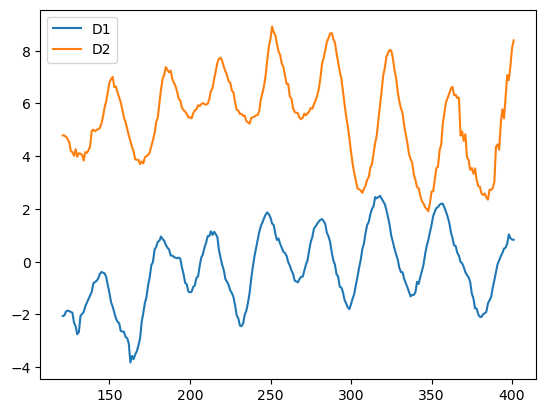

----------  0  ------------
----------  2-5-21-moon_clip2.xlsx  ------------


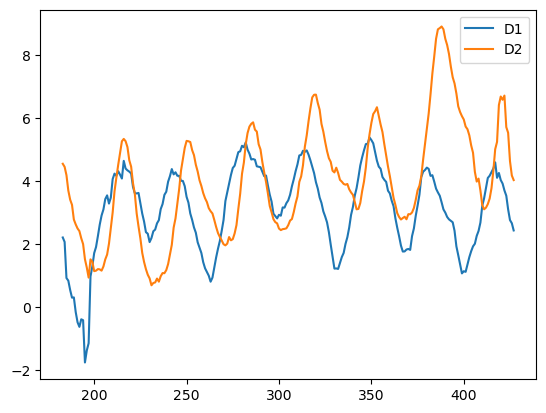

----------  0  ------------
----------  2-8-21-moon_clip1.xlsx  ------------


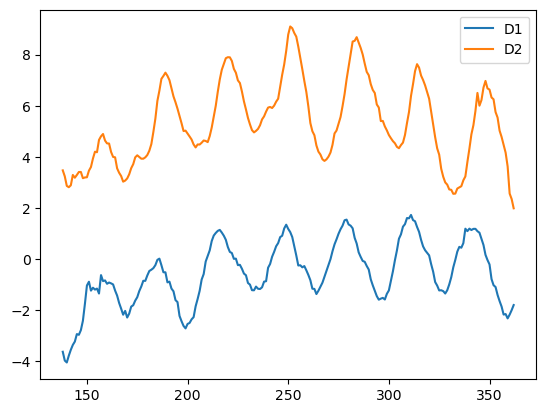

----------  0  ------------
----------  2-8-21-moon_clip2.xlsx  ------------


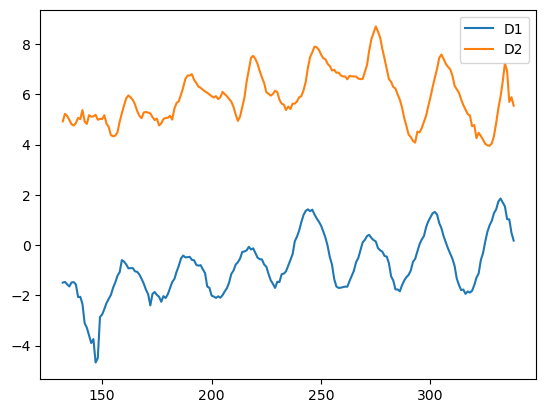

----------  0  ------------
----------  2-8-21-moon_clip3.xlsx  ------------


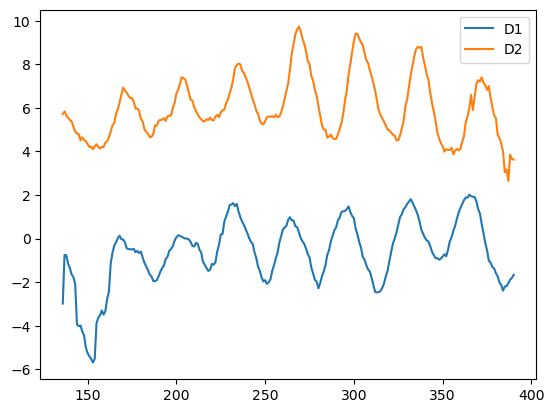

----------  1  ------------
----------  2-11-21-robin_clip1.xlsx  ------------


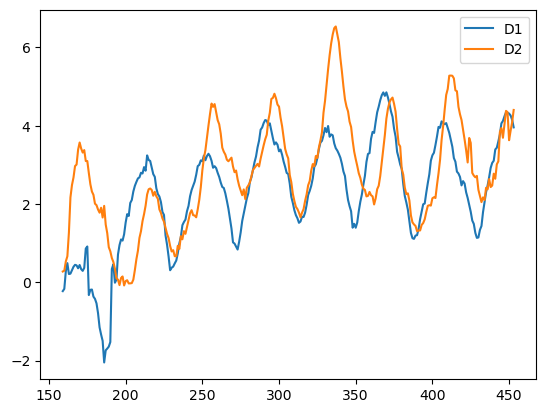

----------  1  ------------
----------  2-12-21-robin_clip1.xlsx  ------------


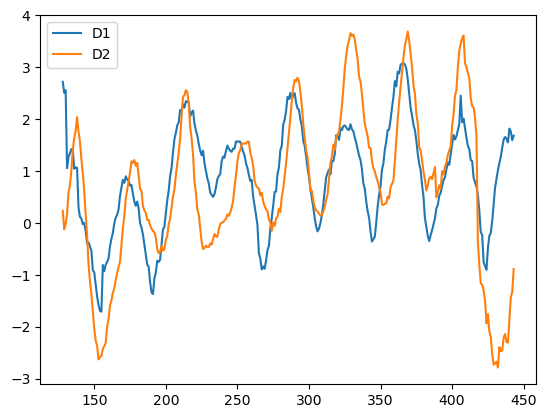

----------  0  ------------
----------  2-12-21-robin_clip2.xlsx  ------------


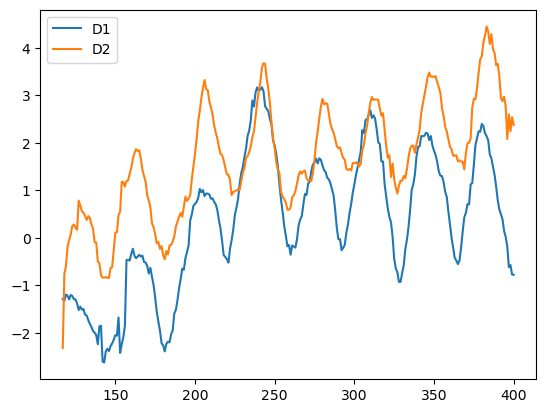

----------  0  ------------
----------  2-12-21-robin_clip3.xlsx  ------------


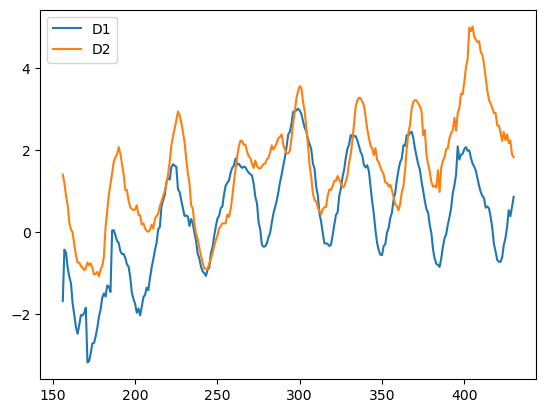

----------  0  ------------
----------  1-18-21-leona-clip1.xlsx  ------------


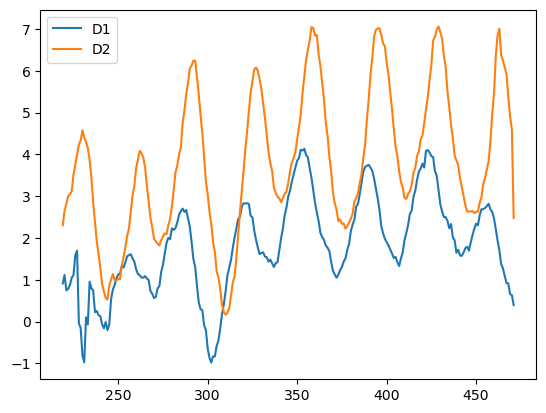

----------  0  ------------
----------  1-18-21-leona-clip2_copy.xlsx  ------------


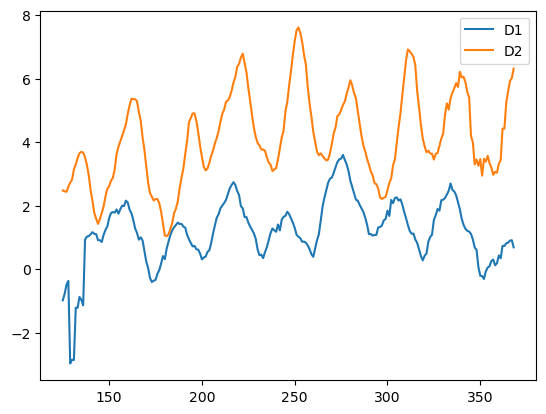

----------  0  ------------
----------  1-19-21-leona_clip1.xlsx  ------------


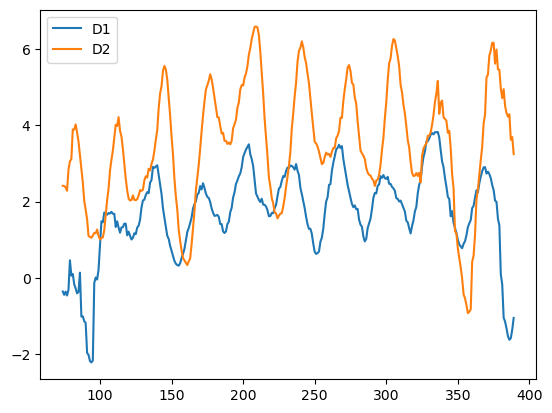

----------  0  ------------
----------  1-19-21-leona_clip2_copy.xlsx  ------------


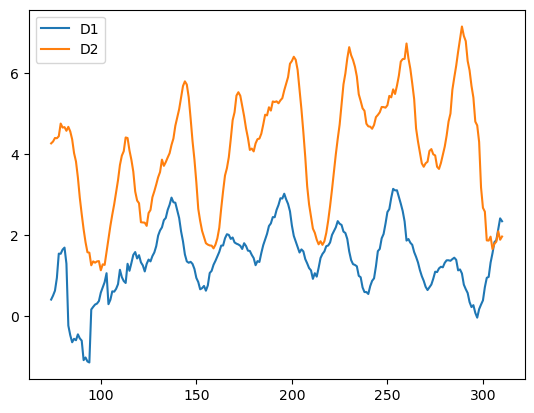

----------  0  ------------
----------  1-20-21-leona_clip1.xlsx  ------------


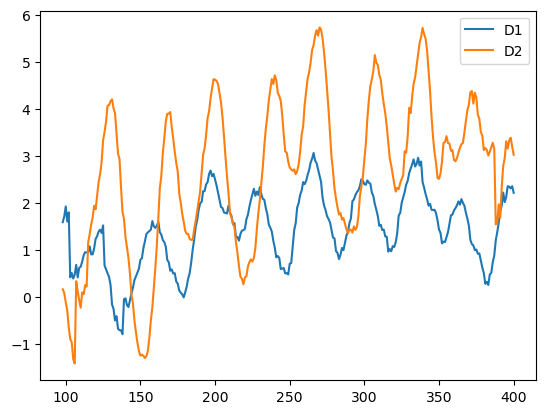

----------  0  ------------
----------  1-20-21-leona_clip2.xlsx  ------------


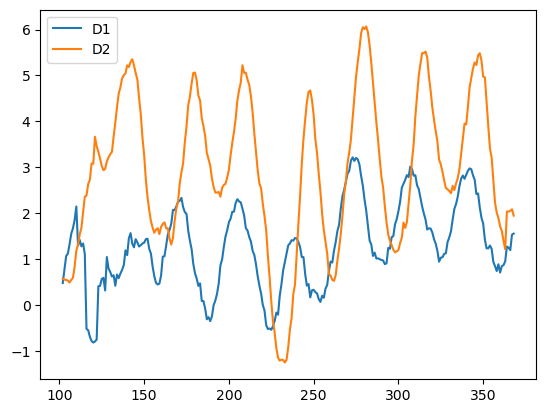

----------  0  ------------
----------  2-12-21-leona_clip1.xlsx  ------------


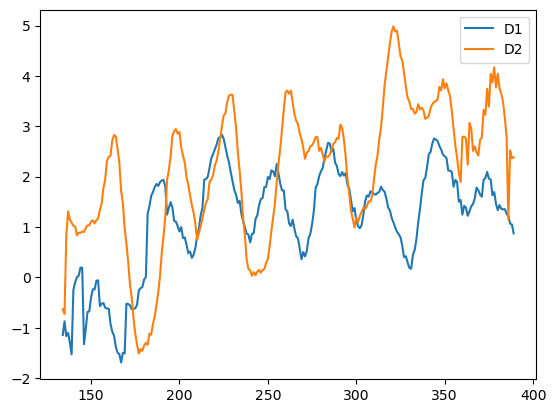

----------  0  ------------
----------  2-12-21-leona_clip2.xlsx  ------------


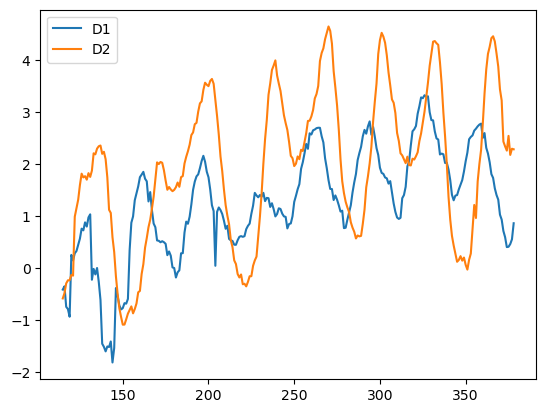

----------  0  ------------
----------  2-12-21-leona_clip3.xlsx  ------------


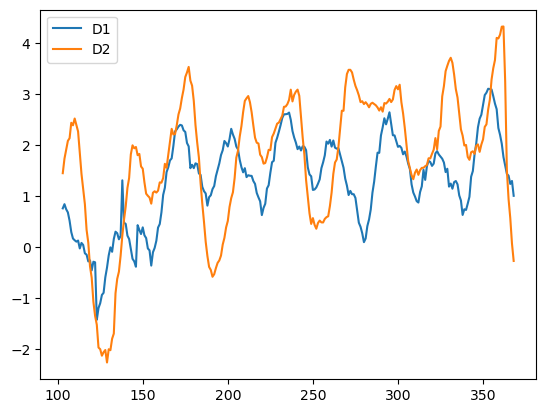

----------  0  ------------
----------  2-8-21-ptitnugget_clip2.xlsx  ------------


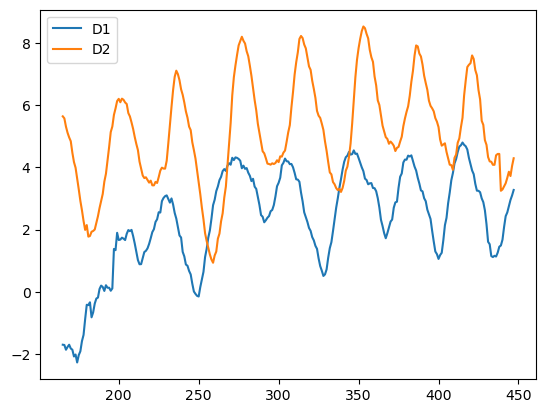

In [123]:
for name in temp: 
    for i in range(len(ls_pds)):
        if name in files_xlsx[i]: 
            print("---------- ", binary_ls[i], " ------------")
            print("---------- ", files_xlsx[i], " ------------")
            """using func: plot_d"""
            plot_d(ls_pds[i], binary_ls[i], only_pos=False)

# Find a few candidates and test them